# logb distribution 
Fig 9

In [2]:
import pandas as pd
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import bilby
import corner

from glob import glob

In [3]:
file_array = glob("*/*N100*new*.csv")
file_array 

['w1Xin/N100_npoints=2000_6parameter_echoamplitude=160_newlikelihood_all.csv',
 'w1specM50RbolT10Chi0.69/N100_npoints=2000_6parameter_echoamplitude=57_newlikelihood_all.csv',
 'w1specM50RdV0.2Chi0.69/N100_npoints=2000_6parameter_echoamplitude=29_newlikelihood_all.csv',
 'w1specM50Rw0.99Chi0.69/N100_npoints=2000_6parameter_echoamplitude=34_newlikelihood_all.csv',
 'noise/N100_npoints=2000_6parameter_echoamplitude=0_newlikelihood_all.csv']

In [4]:
file_array = ['w1specM50Rw0.99Chi0.69/N100_npoints=2000_6parameter_echoamplitude=34_newlikelihood_all.csv',
    'w1specM50RdV0.2Chi0.69/N100_npoints=2000_6parameter_echoamplitude=29_newlikelihood_all.csv',
    'w1specM50RbolT10Chi0.69/N100_npoints=2000_6parameter_echoamplitude=57_newlikelihood_all.csv',
    'w1Xin/N100_npoints=2000_6parameter_echoamplitude=160_newlikelihood_all.csv']

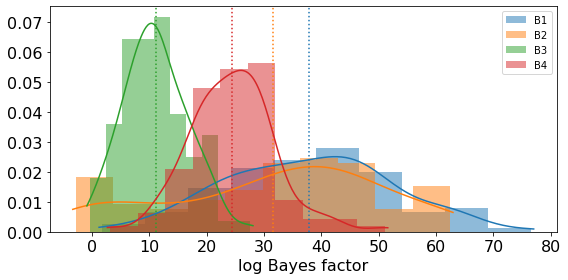

In [6]:
plt.figure(figsize=(8,4),)
for file,color,name in zip(file_array,["C0","C1","C2","C3"],["B1","B2","B3","B4"]):
    data = pd.read_csv(file)
    logB = data['logB']
    probDensityFun = scipy.stats.gaussian_kde(logB)
    x = np.linspace(logB.min() - 0.5, logB.max() + 0.5, 200)
    plt.plot(x, probDensityFun(x), color=color)
    plt.axvline(np.mean(logB), color=color, linestyle=":")
    plt.hist(logB,10,density=1,alpha=0.5,label = name,color=color,)
plt.legend()
plt.xlabel("log Bayes factor",fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig('logBBenchmark.pdf',dpi=300)

# 4 benchmarks and search results

In [7]:
result_json_B1_new = glob('w1specM50Rw0.99Chi0.69/newlikelihood/*N100*SNR*.json')
result_json_B1_new.sort()


result_json_B2_new = glob('w1specM50RdV0.2Chi0.69/newlikelihood/*N100*SNR*.json')
result_json_B2_new.sort()


result_json_B3_new = glob('w1specM50RbolT10Chi0.69/newlikelihood/*N100*SNR*.json')
result_json_B3_new.sort()

result_json_B4_new = glob('w1Xin/newlikelihood/*N100*SNR*.json')
result_json_B4_new.sort()

print(len(result_json_B1_new),len(result_json_B2_new),len(result_json_B3_new),len(result_json_B4_new))

100 100 100 100


In [8]:
posterior_array_B1_new = [bilby.result.read_in_result(result_single).posterior for result_single in result_json_B1_new]
posterior_all_B1_new = pd.concat(posterior_array_B1_new,ignore_index=True)
posterior_array_B2_new = [bilby.result.read_in_result(result_single).posterior for result_single in result_json_B2_new]
posterior_all_B2_new = pd.concat(posterior_array_B2_new,ignore_index=True)
posterior_array_B3_new = [bilby.result.read_in_result(result_single).posterior for result_single in result_json_B3_new]
posterior_all_B3_new = pd.concat(posterior_array_B3_new,ignore_index=True)
posterior_array_B4_new = [bilby.result.read_in_result(result_single).posterior for result_single in result_json_B4_new]
posterior_all_B4_new = pd.concat(posterior_array_B4_new,ignore_index=True)

In [19]:
result = bilby.result.read_in_result(result_json_B1_new[0])
priors = result.priors

## FIG 10 left

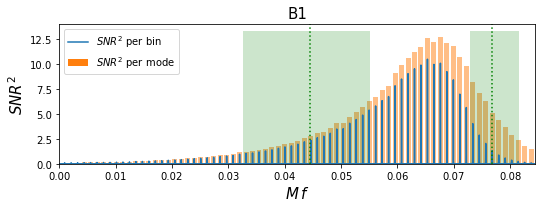

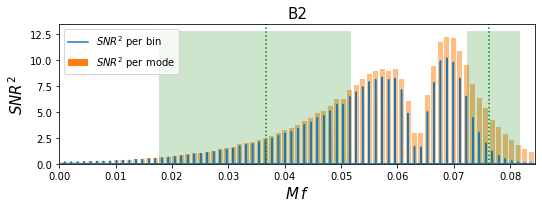

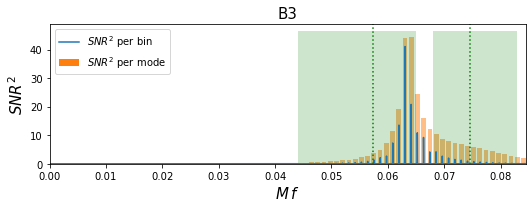

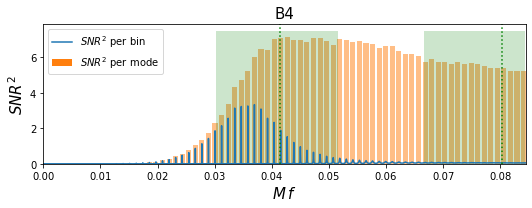

In [16]:
from scipy.signal import find_peaks
spacing_array = []

length0 = int(500*4096)
file_list = glob('echo_waves/*.dat')
file_list.sort()
chi = 0.69
f_RD = (1.5251-1.1568*(1-chi)**0.129)/(2*np.pi)
R_bar = 0.00547/(1+1/np.sqrt(1-chi**2))/(2*np.pi)


amplitude_array = np.concatenate((np.linspace(160,160,6),np.linspace(57,57,6),np.linspace(29,29,6),np.linspace(34,34,6),np.linspace(0,0,6)))

import matplotlib.mlab as mlab
from scipy.interpolate import interp1d


for index,posterior,name in zip(np.arange(3,24,6)[::-1],[posterior_all_B1_new,posterior_all_B2_new,posterior_all_B3_new,posterior_all_B4_new],["B1","B2","B3","B4"]):
	file = file_list[index]
	amplitude_inject = amplitude_array[index]
	inject_data = np.genfromtxt(file,delimiter="\t",dtype=np.complex128)

	omega = np.real(inject_data[0::,0])
	frequency = omega/(2*np.pi)
	df = np.diff(frequency)[0]
	duration = 1/df
	dt = duration/len(omega)
	frequency = frequency[0:len(frequency)//2]


	inject_strain_fre = inject_data[0::,1]
	inject_strain_fre = (inject_strain_fre + np.conjugate(inject_strain_fre[::-1]))/2
	inject_strain_fre = inject_data[0::,1]
	inject_strain_plus = inject_strain_fre
	inject_strain_minus = np.conjugate(inject_strain_fre[::-1])


	inject_strain_fre = (inject_strain_plus+inject_strain_minus)/2
	inject_strain_fre = inject_strain_fre[0:len(frequency)]

	length = len(inject_strain_fre)*2

	i=0

	noise0 = np.load('noise100_500second.npy')
	noisep = noise0[i*length0:(i+1)*length0]
	noise = noisep[0:length]

	NFFT = 2048
	fs = 1/dt
	psd_window = np.blackman(NFFT)
	NOVL = int(NFFT/2)

	Pxx_strain, freqs = mlab.psd(noisep, Fs = fs, NFFT = NFFT,window = psd_window,noverlap = NOVL)
	psd_strain = interp1d(freqs, Pxx_strain)
	noisefre = dt * np.fft.fft(noise)[0:len(frequency)]

 
	fmin = 0
	fmax = f_RD

 
	strainfre = inject_strain_fre * amplitude_inject + noisefre
	frequencye = frequency[int(fmin/df):int(fmax/df+2)]

	hi = inject_strain_fre[int(fmin/df):int(fmax/df+2)] * amplitude_inject
	hi_plus = inject_strain_plus[int(fmin/df):int(fmax/df+2)] * amplitude_inject
	hi_minus = inject_strain_minus[int(fmin/df):int(fmax/df+2)] * amplitude_inject
 
	rho_opt_signal = np.sqrt(4*df * np.sum(np.abs(hi)**2/psd_strain(frequencye)))
	rho_opt_signal_plus = np.sqrt(4*df * np.sum(np.abs(hi_plus)**2/psd_strain(frequencye)))/2
	rho_opt_signal_minus = np.sqrt(4*df * np.sum(np.abs(hi_minus)**2/psd_strain(frequencye)))/2
 
	rho_opt_signal_square_list_plus= 4*df * (np.abs(hi_plus)**2/psd_strain(frequencye))/4
	rho_opt_signal_square_list_minus= 4*df * (np.abs(hi_minus)**2/psd_strain(frequencye))/4
 
	peaks_plus , _=find_peaks(np.abs(hi_plus),distance=2*R_bar/df,height=20)
	peaks_plus = peaks_plus[0:len(peaks_plus)-1]
	peaks_minus , _=find_peaks(np.abs(hi_minus),distance=2*R_bar/df,height=20)
	peaks_minus = peaks_minus[0:len(peaks_minus)-1]

	fminbar1 = np.percentile(posterior.fmin.values,5)
	fminbar2 = np.percentile(posterior.fmin.values,95)
	fmaxbar1 = np.percentile(posterior.fmax.values,5)
	fmaxbar2 = np.percentile(posterior.fmax.values,95)

	plt.figure(figsize=(7.5,3))
	if index == 3:
		comb_length_minus, comb_phase_minus=np.polyfit(np.arange(len(peaks_minus)),frequencye[peaks_minus],1,w=np.abs(hi_minus)[peaks_minus])
		snr_all_minus = np.sqrt(np.sum(rho_opt_signal_square_list_minus))
		spacing = comb_length_minus
		shift = comb_phase_minus
		shift = shift- spacing*int(shift/spacing)-0.5*spacing
		plt.plot(frequencye,rho_opt_signal_square_list_minus,label=r'$SNR^2$ per bin')
		for x in np.arange(0,f_RD/comb_length_minus,1):
			# plt.axvline(x*spacing+fmin+shift, color='red', linestyle=":",alpha = 1)
			fmine = x*spacing+fmin+shift
			fmaxe = (x+1)*spacing+fmin+shift
			hie = np.abs(inject_strain_minus)[int(fmine/df):int(fmaxe/df+2)]* amplitude_inject/2
			frequencyee = frequency[int(fmine/df):int(fmaxe/df+2)]
			rho_opt_signale = np.sum(4*df * (hie**2/psd_strain(np.abs(frequencyee))))
			plt.bar((fmine+fmaxe)/2,rho_opt_signale,spacing/1.3,color = 'C1',alpha = 0.5)
		plt.xlim(0,f_RD)
		plt.xlabel('frequency')
		plt.ylabel('$SNR^2$')
	else:
		comb_length_plus, comb_phase_plus=np.polyfit(np.arange(len(peaks_plus)),frequencye[peaks_plus],1,w=np.abs(hi_plus)[peaks_plus])
		snr_all_plus = np.sqrt(np.sum(rho_opt_signal_square_list_plus))
		spacing = comb_length_plus
		shift = comb_phase_plus
		shift = shift- spacing*int(shift/spacing)-0.5*spacing
		plt.plot(frequencye,rho_opt_signal_square_list_plus,label= r'$SNR^2$ per bin')
		for x in np.arange(0,f_RD/comb_length_plus,1):
			# plt.axvline(x*spacing+fmin+shift, color='red', linestyle=":",alpha = 1)
			fmine = x*spacing+fmin+shift
			fmaxe = (x+1)*spacing+fmin+shift
			hie = np.abs(inject_strain_plus)[int(fmine/df):int(fmaxe/df+2)]* amplitude_inject/2
			frequencyee = frequency[int(fmine/df):int(fmaxe/df+2)]
			rho_opt_signale = np.sum(4*df * (hie**2/psd_strain(np.abs(frequencyee))))
			plt.bar((fmine+fmaxe)/2,rho_opt_signale,spacing/1.3,color = 'C1',alpha = 0.5)
		plt.xlim(0,f_RD)
		
	height = plt.gca().get_ylim()[1]
	plt.bar((fminbar2+fminbar1)/2,height,(fminbar2-fminbar1),color = 'green',alpha = 0.2)
	plt.bar((fmaxbar2+fmaxbar1)/2,height,(fmaxbar2-fmaxbar1),color = 'green',alpha = 0.2)
	plt.axvline(np.mean(posterior.fmin.values), color='green', linestyle=":",alpha = 1)
	plt.axvline(np.mean(posterior.fmax.values), color='green', linestyle=":",alpha = 1)
	plt.title(name,fontsize = 15)
	plt.bar(0,0,color = 'C1',label= r'$SNR^2$ per mode')
	plt.legend(fontsize = 15)
	plt.xlabel(r'$M\, f$',fontsize = 15)
	plt.ylabel('$SNR^2$',fontsize = 15)
	# plt.axvline(np.mean(posterior.fmin.values),color='g',label='fmin mean')
	# plt.axvline(np.mean(posterior.fmax.values),color='g',label='fmax mean')
	plt.legend(loc='upper left')
	plt.tight_layout()
	plt.savefig('SNRBenchmark'+name+'.pdf',dpi=300)
	plt.show()
 
	spacing_array.append(spacing)

## Figure 10 right

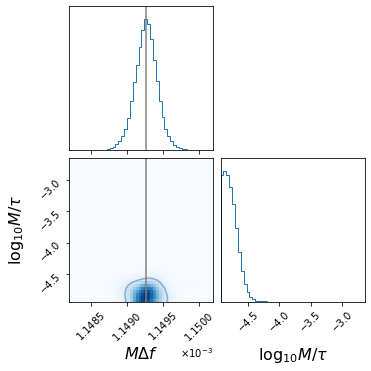

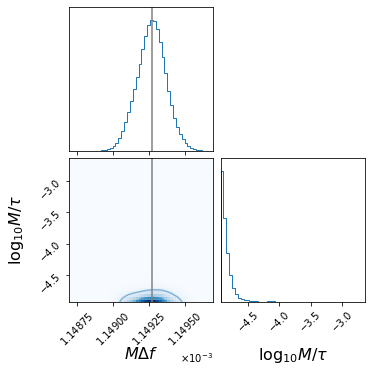

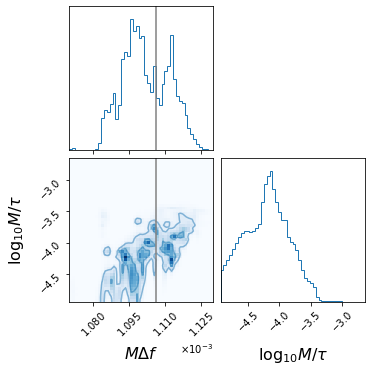

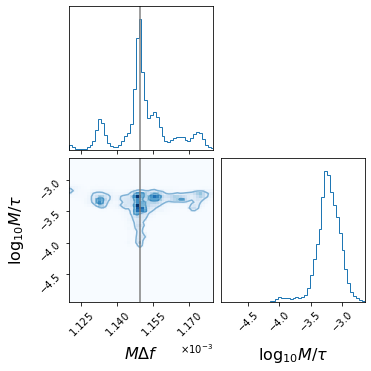

In [20]:
import matplotlib.lines as mlines
from matplotlib.transforms import Bbox
range_array = [[0.0011482,0.0011502],[0.0011487,0.0011497],[0.00107,0.00113],[0.00112,0.00118]]
for posterior,name,spacing,spacing_range in zip([posterior_all_B1_new,posterior_all_B2_new,posterior_all_B3_new,posterior_all_B4_new],["B1","B2","B3","B4"],spacing_array,range_array):   
    # line1 = mlines.Line2D([], [], color='C0', label='newlikelihood')
    # line2 = mlines.Line2D([], [], color='C1', label='oldlikelihood')
    # #line3 = mlines.Line2D([], [], color='gray', label='injected value')
    # line4 = mlines.Line2D([], [], ls = '--',color='black', alpha = 0.5,label='prior')

    datanew = np.transpose([posterior.spacing.values,np.log10(posterior.width.values)])
    kwargsnew = dict(labels=[r"$M \Delta f$",r"$\log_{10}{M/\tau}$"], range=[spacing_range,[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    
    def get_normalisation_weight(len_current_samples, len_of_longest_samples):
        return np.ones(len_current_samples) * (len_of_longest_samples / len_current_samples)
    figure = corner.corner(datanew,**kwargsnew)
    inject = np.array([spacing,1])
    corner.overplot_lines(figure, inject, color="gray")
    corner.overplot_points(figure, inject[None], marker="s", color="gray")

    axes = np.array(figure.axes).reshape((2, 2))
    ax = axes[1,1]
    #logprior = 1/(np.log10(priors['width'].maximum/priors['width'].minimum))
    #ax.plot(np.log10(np.linspace(priors['width'].minimum, priors['width'].maximum, 1000)),np.linspace(logprior,logprior, 1000),color = 'black',ls='--',alpha = 0.5,label = 'prior')
    ax = axes[1,0]
    ax.hist2d(posterior.spacing.values,np.log10(posterior.width.values),bins=50,density=True,cmap='Blues',range=[range,[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]])
    ax.ticklabel_format(axis="x", style="sci", scilimits=(0, 0),useMathText=True)
    ax = axes[1,1]
    plt.savefig(name+"BenchmarkPosterior.pdf",dpi = 300)
    plt.show()
    plt.close()

# violin plot for logB
Fig 11 , Fig 17 lower

In [32]:
import pandas as pd
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import bilby
import corner

from glob import glob

In [33]:
duration_array_str = glob("echo_waves/*.dat")
duration_array_str.sort()
for i in range(len(duration_array_str)):
    duration_array_str[i] = duration_array_str[i].split("/")[1].split("N")[1].split('.')[0]
duration_array_str = list(dict.fromkeys(duration_array_str))
duration_array_str

['010', '020', '050', '100', '150', '200']

In [34]:
duration_array = glob("echo_waves/*.dat")
duration_array.sort()
for i in range(len(duration_array)):
    duration_array[i] = int(duration_array[i].split("/")[1].split("N")[1].split('.')[0])
duration_array = list(dict.fromkeys(duration_array))
duration_array.sort()
duration_array = np.array(duration_array)*2
duration_array

array([ 20,  40, 100, 200, 300, 400])

In [35]:
name_array = glob("echo_waves/*.dat")
name_array.sort()
for i in range(len(name_array)):
    name_array[i] = name_array[i].split("/")[1].split("N")[0]
#delete duplicates in name array
name_array = list(dict.fromkeys(name_array))
name_array.sort()
name_array = name_array[::-1]
name_array.append('noise')
name_array

['w1specM50Rw0.99Chi0.69',
 'w1specM50RdV0.2Chi0.69',
 'w1specM50RbolT10Chi0.69',
 'w1Xin',
 'noise']

In [36]:
file_array_new = [sorted(glob('%s/*%s*.csv'%(name,string_likelihood))) for name in name_array for string_likelihood in ['newlikelihood']]
file_array_old = [sorted(glob('%s/*%s*.csv'%(name,string_likelihood))) for name in name_array for string_likelihood in ['oldlikelihood']]
np.shape(file_array_new)
# (5,6) 5 rows, 6 columns means each row is a different signal, each column is a different duration
# file_array_new[i] could get all the duration with the i-th signal

(5, 6)

In [37]:
new_likelihood_logB_upper = []
new_likelihood_logB_lower = []
old_likelihood_logB_upper = []   
old_likelihood_logB_lower = []    
for file_new,file_old in zip(file_array_new[-1],file_array_old[-1]):
	data = pd.read_csv(file_new)
	log_b = data["logB"]
	new_likelihood_logB_upper.append(np.percentile(log_b.values, 95))
	new_likelihood_logB_lower.append(np.percentile(log_b.values, 5))
	data = pd.read_csv(file_old)
	log_b = data["logB"]
	old_likelihood_logB_upper.append(np.percentile(log_b.values, 95))
	old_likelihood_logB_lower.append(np.percentile(log_b.values, 5))
new_likelihood_logB_upper = np.array(new_likelihood_logB_upper)
new_likelihood_logB_lower = np.array(new_likelihood_logB_lower)
old_likelihood_logB_upper = np.array(old_likelihood_logB_upper)
old_likelihood_logB_lower = np.array(old_likelihood_logB_lower)

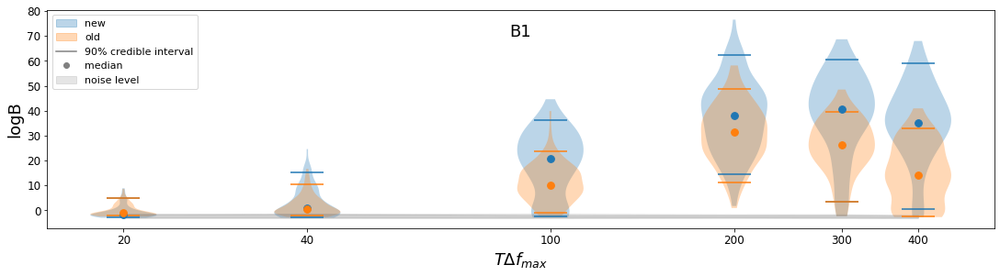

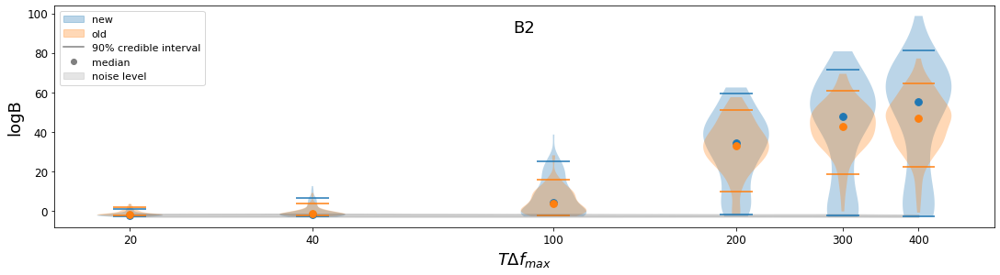

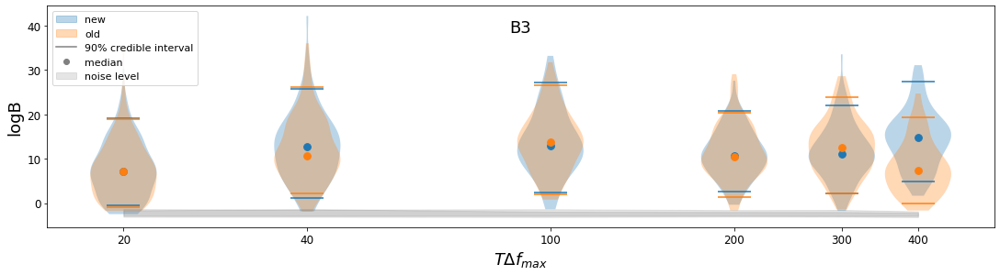

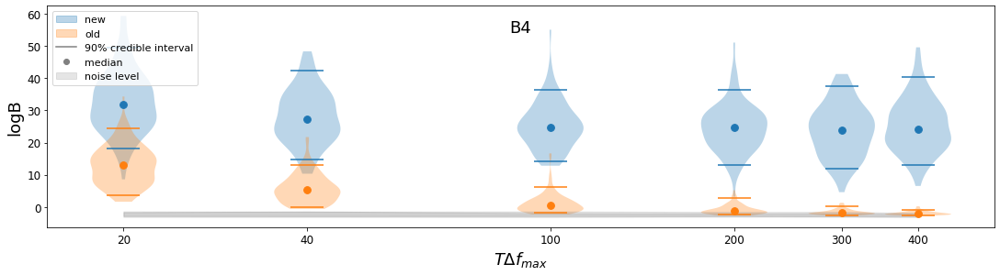

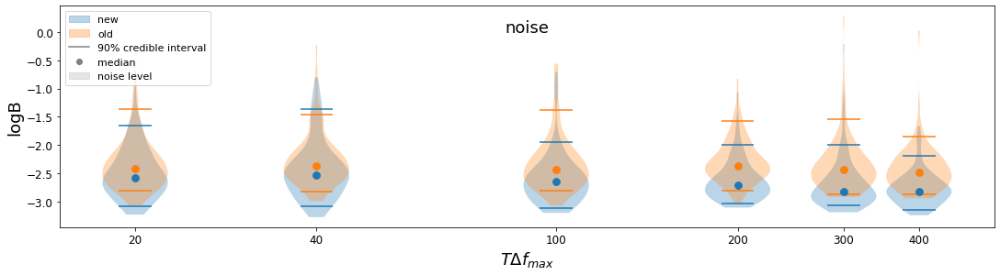

In [38]:
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
# min & max use solid line
# median use point
name_label_array= ['B1','B2','B3','B4','noise']
for file_array_new_2,file_array_old_2,name_string in zip(file_array_new,file_array_old,name_label_array):
    # quantilesnew = [[0,1],[0,1],[0,1],[0,1],[0,1],[0,1]]
    # quantilesold = [[0,1],[0,1],[0,1],[0,1],[0,1],[0,1]]
    quantilesnew = [[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95]]
    quantilesold = [[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95]]
    fig, ax = plt.subplots(figsize = (15,4),constrained_layout=True)
    labels = []

    new_likelihood_logB = []
    old_likelihood_logB = []
    for file_new,file_old in zip(file_array_new_2,file_array_old_2):
        data = pd.read_csv(file_new)
        log_b = data["logB"]
        new_likelihood_logB.append(log_b.values)
        data = pd.read_csv(file_old)
        log_b = data["logB"]
        old_likelihood_logB.append(log_b.values)
    parts1 = ax.violinplot(new_likelihood_logB,positions=np.log(duration_array),showmedians=False,quantiles=quantilesnew,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_logB,positions=np.log(duration_array),showmedians=False,quantiles=quantilesold,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    parts1['zorder'] = 2
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    parts1['zorder'] = 1
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_logB]
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    medians2 = [np.median(x) for x in old_likelihood_logB]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    if name_string != 'noise':
        ax.fill_between(np.log(duration_array), new_likelihood_logB_upper, new_likelihood_logB_lower, alpha=0.2, color='gray')
        ax.fill_between(np.log(duration_array), old_likelihood_logB_upper, old_likelihood_logB_lower, alpha=0.2, color='gray')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel('logB',fontsize = 18)
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1,patch3], loc=2,fontsize = 11)
    plt.savefig('logB_violinplot_%s.pdf'%name_string,dpi=300)
    plt.show()
    plt.close()

# corner plot for posterior 
Fig 12

In [47]:
import pandas as pd
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import bilby
import corner
import csv
from glob import glob

import matplotlib.lines as mlines
from matplotlib.transforms import Bbox

In [48]:
duration_array_str = glob("echo_waves/*.dat")
duration_array_str.sort()
for i in range(len(duration_array_str)):
    duration_array_str[i] = duration_array_str[i].split("/")[1].split("N")[1].split('.')[0]
duration_array_str = list(dict.fromkeys(duration_array_str))
duration_array_str

['010', '020', '050', '100', '150', '200']

In [49]:
duration_array = glob("echo_waves/*.dat")
duration_array.sort()
for i in range(len(duration_array)):
    duration_array[i] = int(duration_array[i].split("/")[1].split("N")[1].split('.')[0])
duration_array = list(dict.fromkeys(duration_array))
duration_array.sort()
duration_array = np.array(duration_array)*2
duration_array

array([ 20,  40, 100, 200, 300, 400])

In [50]:
name_array = glob("echo_waves/*.dat")
name_array.sort()
for i in range(len(name_array)):
    name_array[i] = name_array[i].split("/")[1].split("N")[0]
#delete duplicates in name array
name_array = list(dict.fromkeys(name_array))
name_array.sort()
name_array = name_array[::-1]
name_array.append('noise')
name_array

['w1specM50Rw0.99Chi0.69',
 'w1specM50RdV0.2Chi0.69',
 'w1specM50RbolT10Chi0.69',
 'w1Xin',
 'noise']

In [51]:
file_array_new = [sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for name in name_array for string_likelihood in ['newlikelihood'] for duration in duration_array_str]
file_array_old = [sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for name in name_array for string_likelihood in ['oldlikelihood'] for duration in duration_array_str]

In [52]:
names_array = ['B1','B1','B1','B1','B1','B1'
 ,'B2', 'B2', 'B2', 'B2', 'B2', 'B2'
 ,'B3', 'B3', 'B3', 'B3', 'B3', 'B3'
 ,'B4', 'B4', 'B4', 'B4', 'B4', 'B4'
 ,'noise', 'noise', 'noise', 'noise', 'noise', 'noise']

In [53]:
headers = ['names', 'log10width_median', 'log10width_plus', 'log10width_minus', 'amplitude_median', 'amplitude_plus', 'amplitude_minus', 'phase_median', 'phase_plus', 'phase_minus', 'spacing_median', 'spacing_plus', 'spacing_minus', 'fmin_median', 'fmin_plus', 'fmin_minus', 'fmax_median', 'fmax_plus', 'fmax_minus', 'duration_median', 'duration_plus', 'duration_minus', 'log_likelihood_median', 'log_likelihood_plus', 'log_likelihood_minus', 'log_prior_median', 'log_prior_plus', 'log_prior_minus', 'SNR_median', 'SNR_plus', 'SNR_minus']
keys_all = ['width', 'amplitude', 'phase', 'spacing', 'fmin', 'fmax', 'duration','log_likelihood', 'log_prior', 'SNR']
with open('PE.csv', 'w') as f:
    f_csv = csv.writer(f)
    f_csv.writerow(headers)
# The file PE.csv contains the parameter estimation with combined posterior results of all the signals with different durations and different likelihoods
# The data used in Table 3 is contained in PE_new.csv


100 100
B1N010


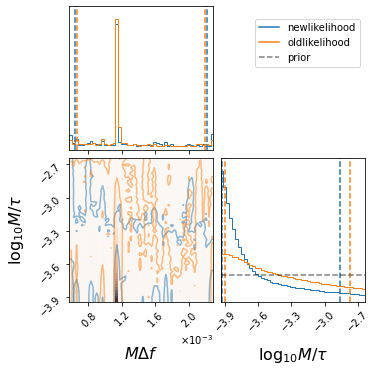

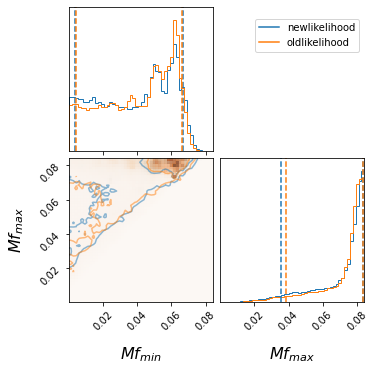

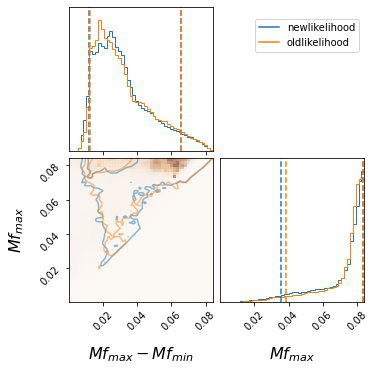

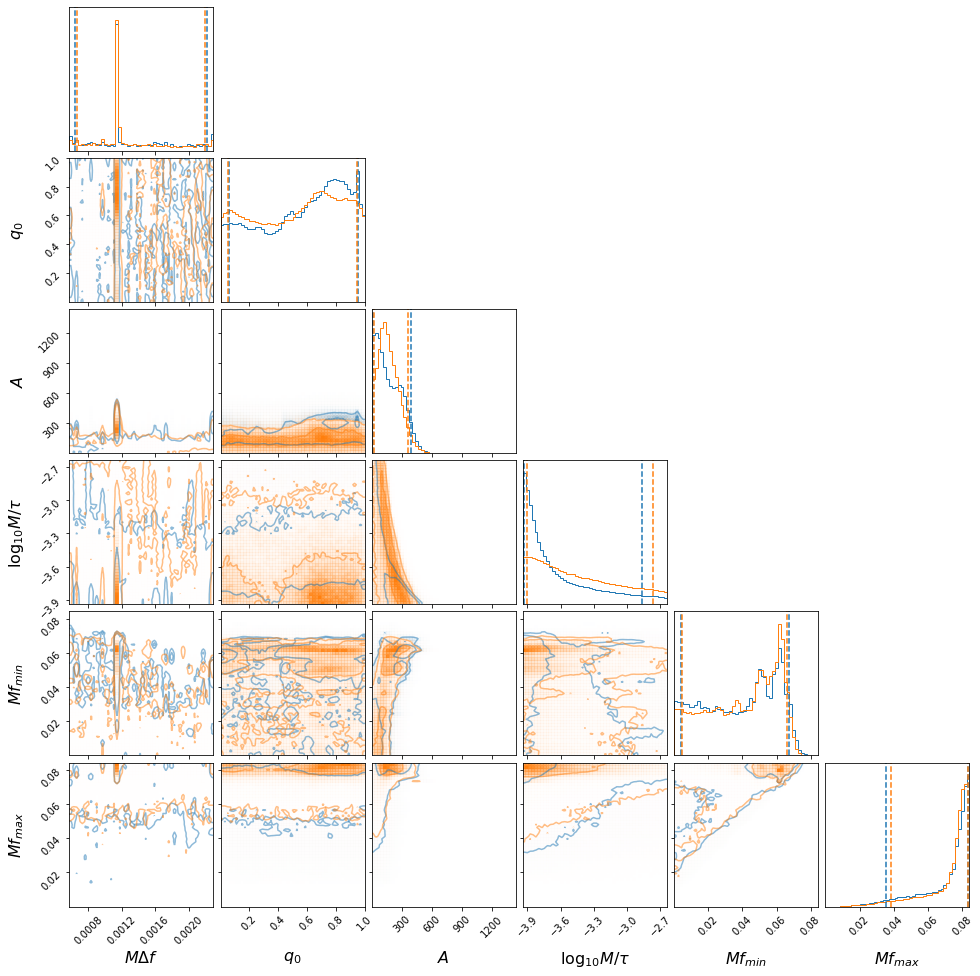

width -3.7332533445801164 0.8714164873930264 0.19351573913174303
amplitude 152.7243685982893 239.4834936614178 137.61834105953366
phase 0.5883755667007068 0.3639381408470058 0.5294096778345146
spacing 0.001152983478875796 0.0010629614618676915 0.0005123455087432665
fmin 0.04229493196580702 0.02476489965857364 0.038563733466616214
fmax 0.07736820233140906 0.006509547701321117 0.04176617446665439
duration 8701.17437140776 0.0 0.0
log_likelihood 6.205204299414771 17.390427885883735 6.556288342462009
log_prior 12.578351677268415 0.446942456285365 2.005355134088326
SNR 6.296729437630336 4.160638411041402 5.493658373625697
100 100
B1N020


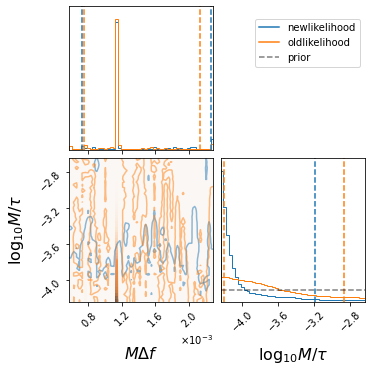

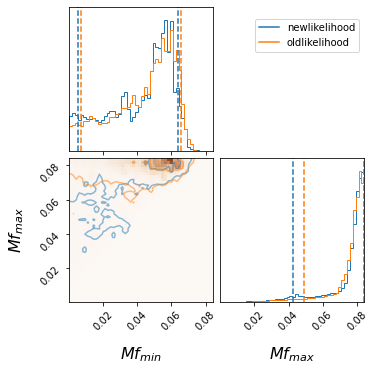

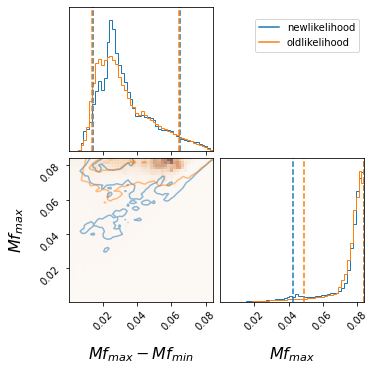

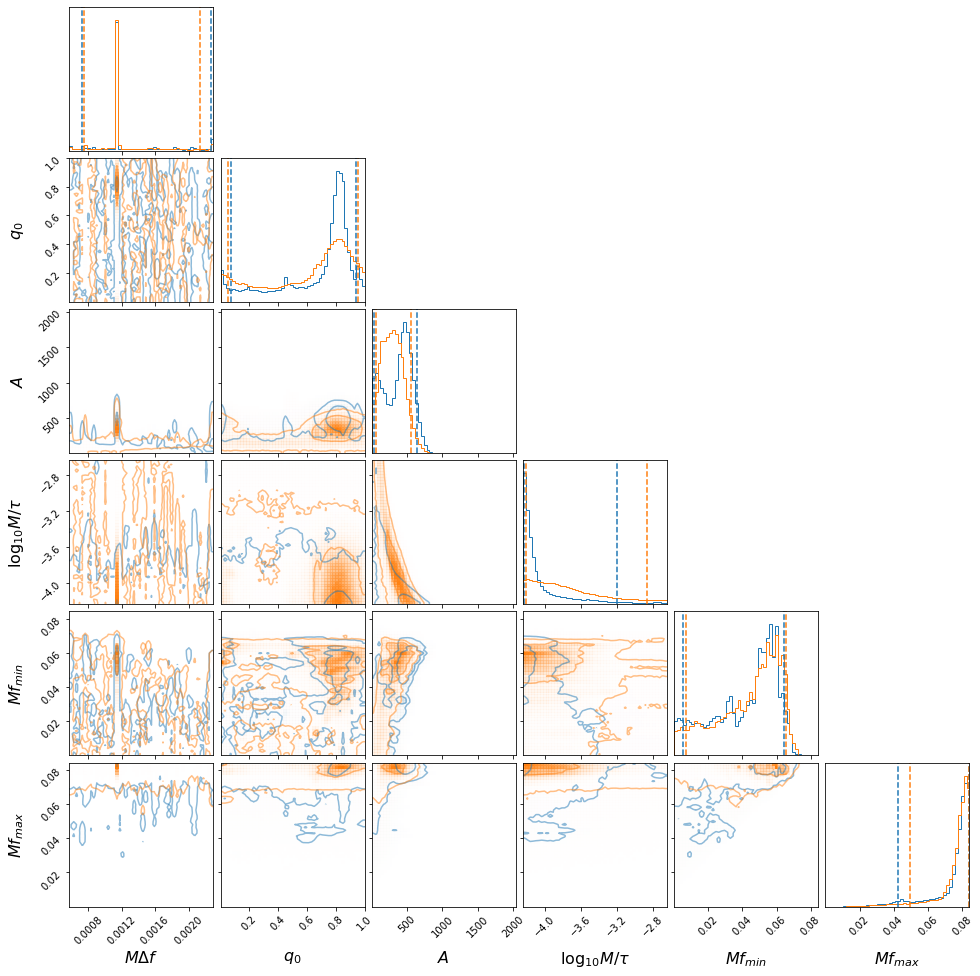

width -4.141495821736195 0.949810350655504 0.09259217149574361
amplitude 406.05708190439486 242.13475809991098 367.679703631236
phase 0.7835148524041654 0.1574838957725181 0.7084705140743797
spacing 0.0011498553666640784 0.0011223261285534833 0.0004202078232843527
fmin 0.04760136846045769 0.016496825393988987 0.0425139390228186
fmax 0.07950448944623559 0.004521317157624813 0.03696714531093728
duration 17402.34874281552 0.0 0.0
log_likelihood 19.721557230283885 17.214111857258523 19.75942302547136
log_prior 12.962944882126338 0.2133393492468727 2.188125381878965
SNR 9.140718921446204 3.3784812306305056 7.505843087629353
100 100
B1N050


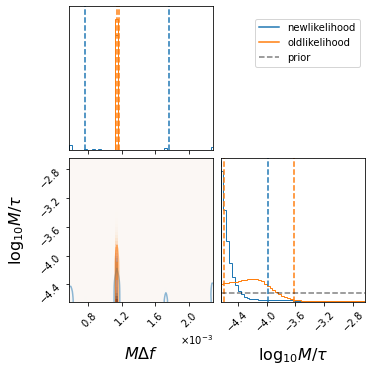

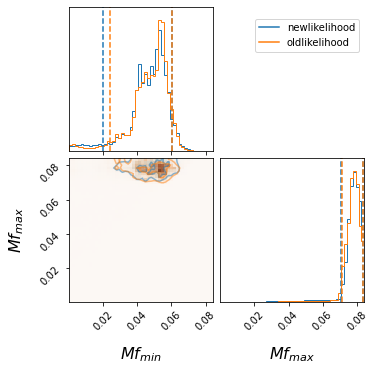

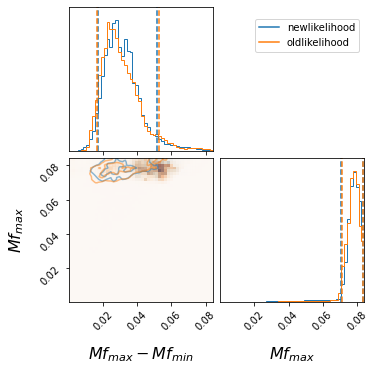

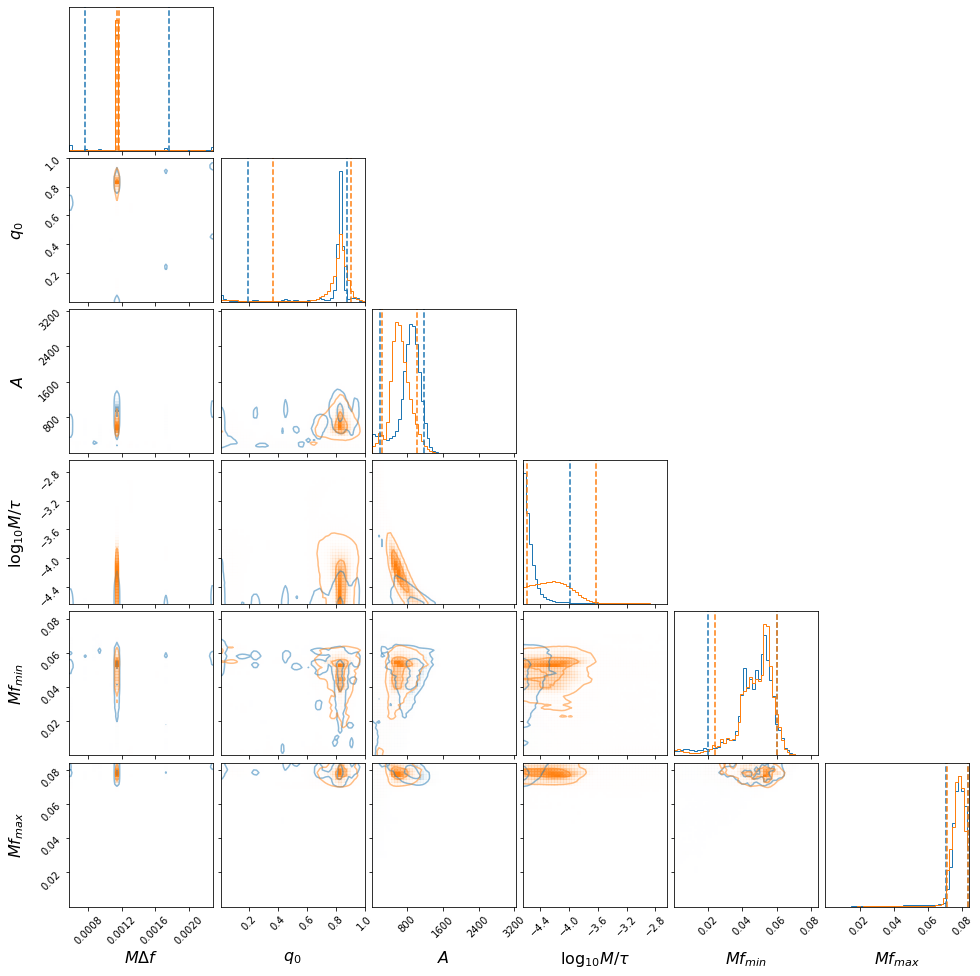

width -4.563814266484685 0.5810868261708508 0.06894542259419278
amplitude 874.0288608988982 300.8769953885786 689.6992345391814
phase 0.8259490353367975 0.04890881838777905 0.6357565628330786
spacing 0.001149302764449282 0.0006109635694861719 0.00038305968192680674
fmin 0.04849688948590455 0.012056446245193128 0.028502147674754272
fmax 0.0784868465247534 0.005150035111118542 0.00785464981186404
duration 43505.871857038794 0.0 0.0
log_likelihood 44.81841218220021 16.862857303846084 42.323222210442545
log_prior 13.257011718871444 0.15892651624625032 1.340800585190463
SNR 12.363317891896891 2.663147835851399 7.29294375432396
100 100
B1N100


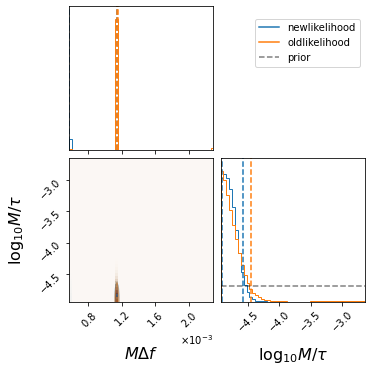

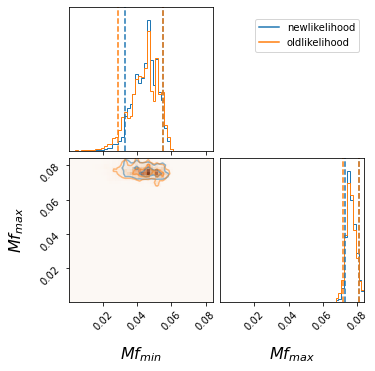

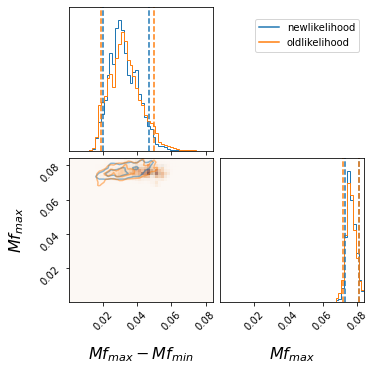

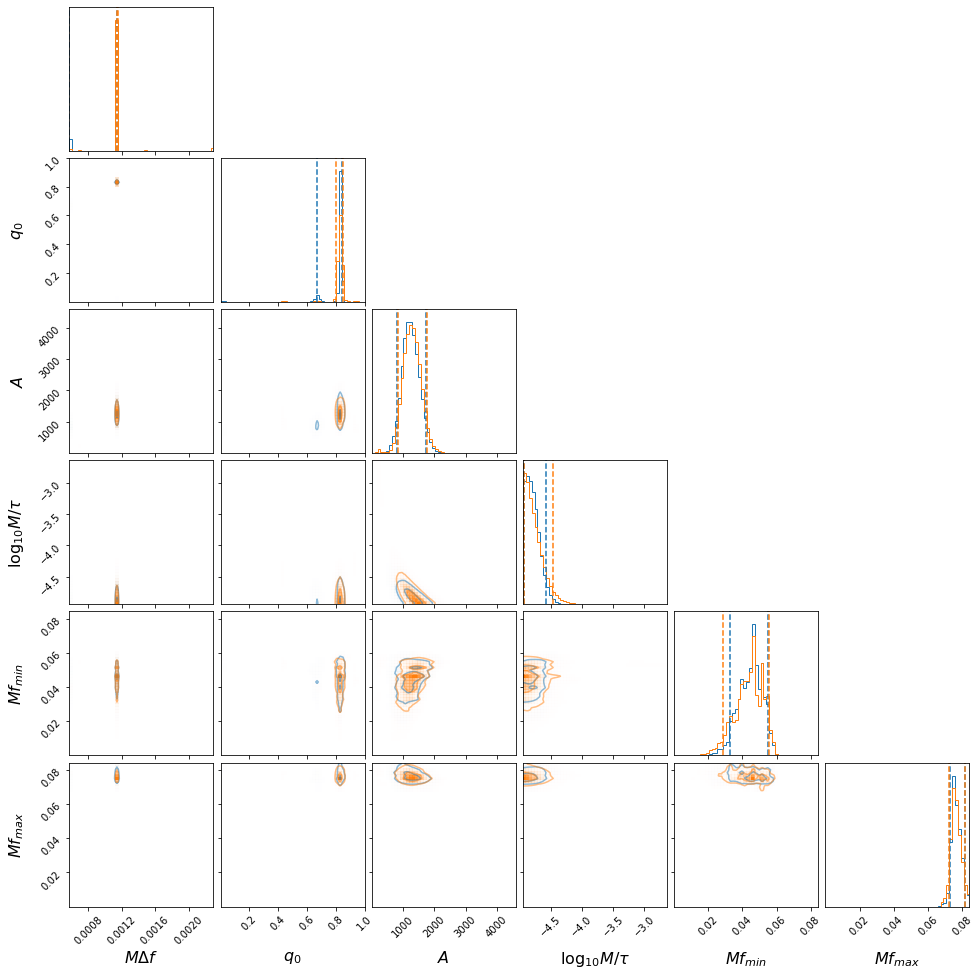

width -4.798122886569455 0.2198021151191556 0.12663568356787103
amplitude 1237.2385465794973 488.6763971229136 426.76316137007825
phase 0.8309983650783332 0.012914162627635895 0.16267503527675575
spacing 0.0011492453707412013 2.724346185589699e-07 0.0005746153404077945
fmin 0.0455424394474205 0.009560407152314945 0.012897850680978415
fmax 0.07630934954048163 0.00526986522988486 0.0034531135603692448
duration 87011.74371407759 0.0 0.0
log_likelihood 62.46575101813219 25.279664026492803 23.835211425607298
log_prior 13.309320309005933 0.2915017389913448 0.5064681398421822
SNR 14.26545584175965 2.5837747498070804 2.7668612104400125
100 100
B1N150


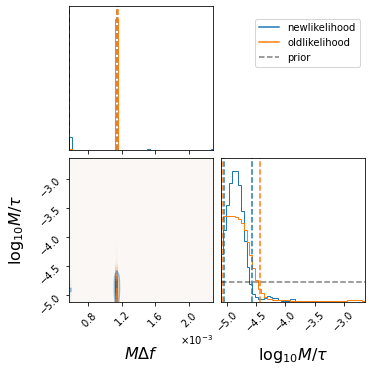

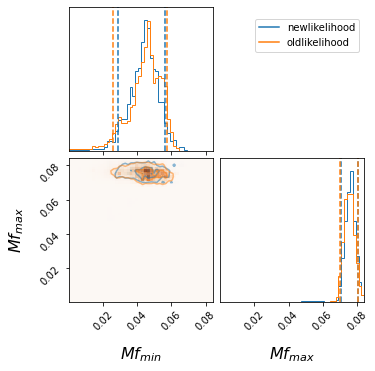

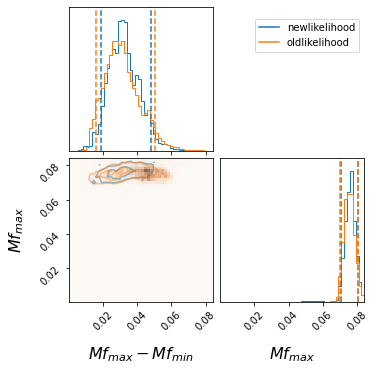

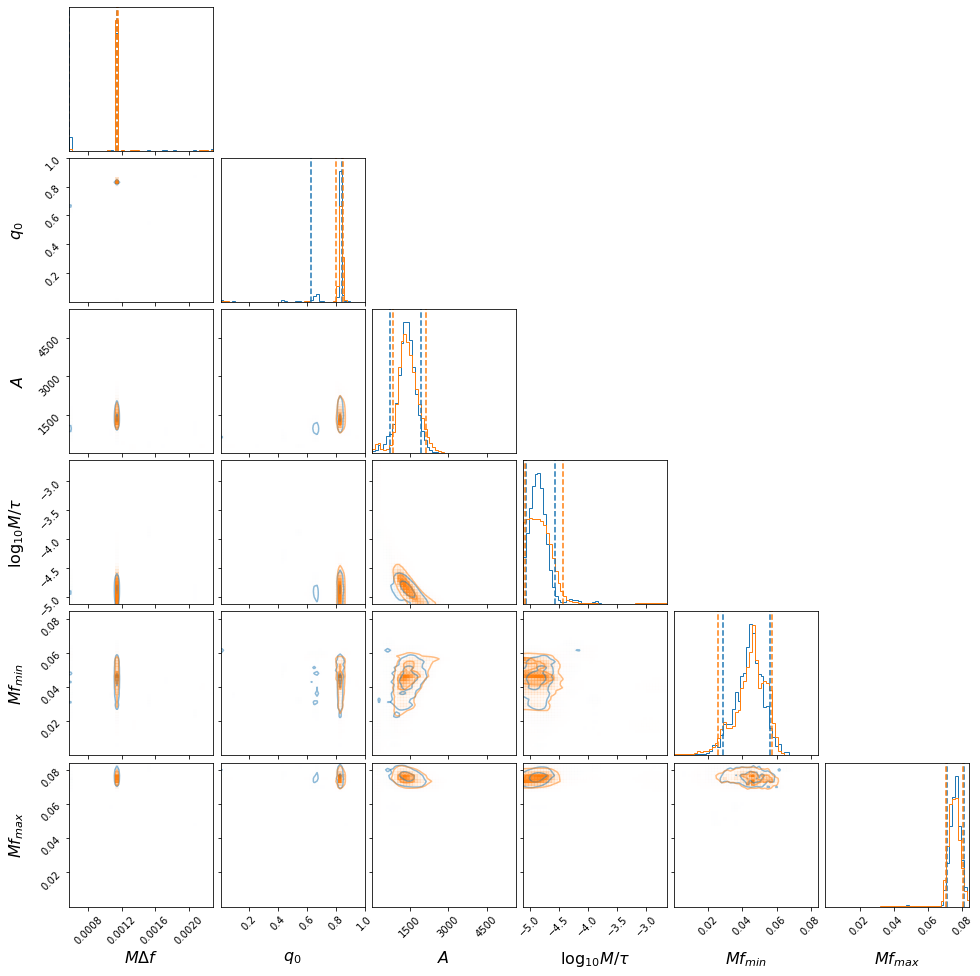

width -4.861493624961041 0.2918943944477306 0.2039811020441471
amplitude 1364.3222138392648 557.5400604826095 655.3918353352749
phase 0.829537116954522 0.010413191449507586 0.20171455889067014
spacing 0.0011492826465315385 2.9799413798245293e-07 0.0005746332458786699
fmin 0.044648171344282735 0.011415646655478472 0.016076146537459687
fmax 0.076156900475548 0.0048746112561771915 0.005120712623221169
duration 130517.61557111642 0.0 0.0
log_likelihood 66.62174359223089 19.774690726573994 41.714406964786605
log_prior 13.178724482575566 0.4699206538223901 0.6726276191692815
SNR 14.513036491802794 2.442493884461644 4.608695865949118
100 100
B1N200


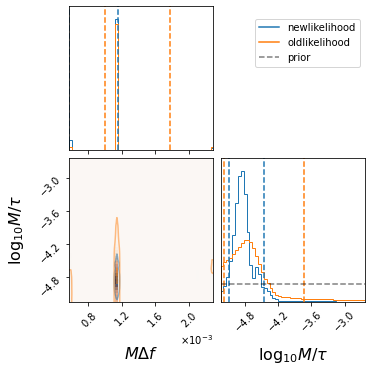

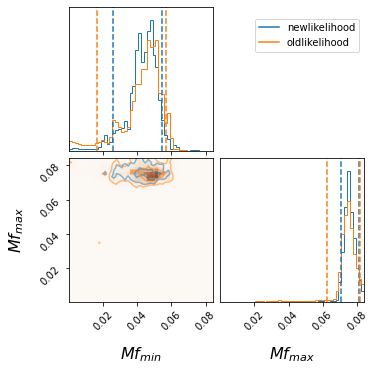

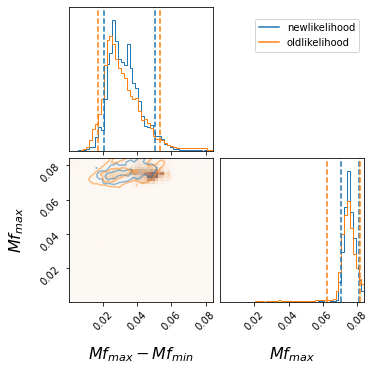

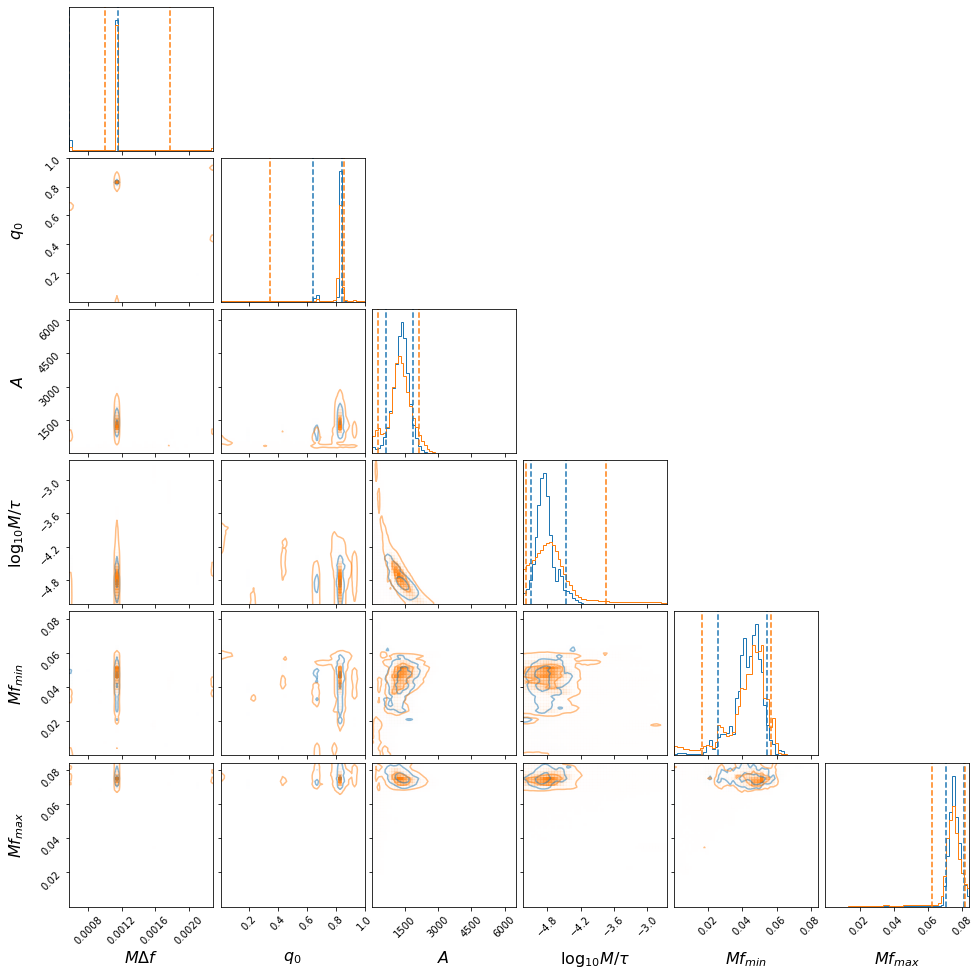

width -4.855394855653655 0.3963867358047919 0.24091284049477313
amplitude 1333.3174241467268 548.9650650965509 667.3683380674872
phase 0.8313915217040416 0.00992134736222483 0.18763498033857917
spacing 0.00114925398508133 3.7920493445916387e-07 0.0005745902086947727
fmin 0.04411905815920151 0.010272032551542624 0.018649152798632256
fmax 0.07539181555808559 0.0060397290838825335 0.00474802623543924
duration 174023.48742815517 0.0 0.0
log_likelihood 62.00647749885656 24.8932505676135 39.992020607012506
log_prior 12.971160568825704 0.5548306672963257 0.9142601079665749
SNR 14.200983608346778 2.6188220102199296 5.173978499075606
100 100
B2N010


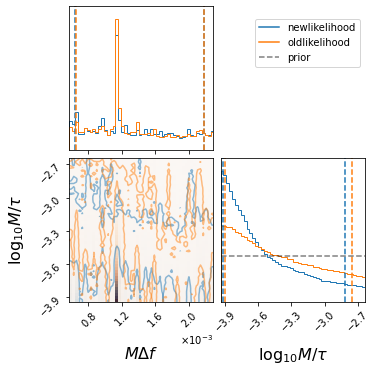

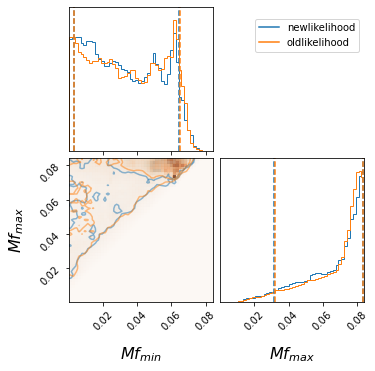

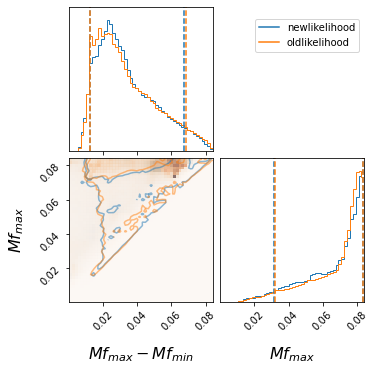

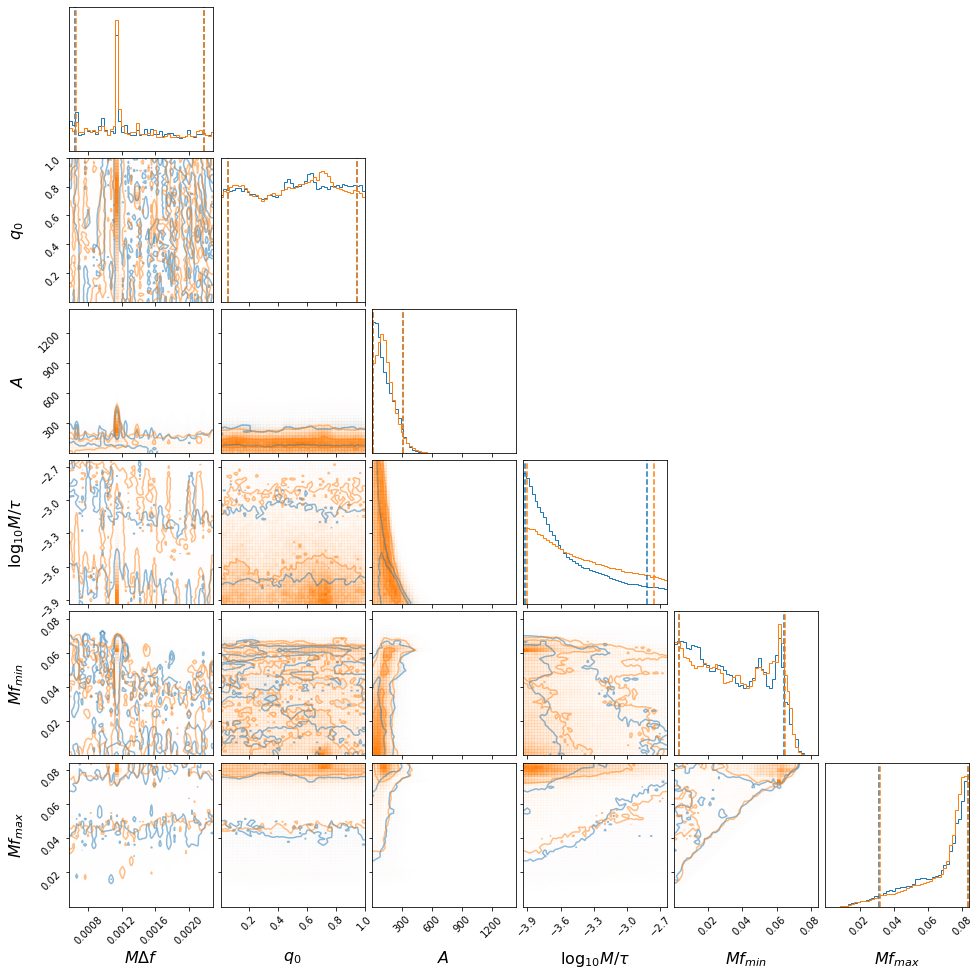

width -3.6372537713476336 0.8193832356179604 0.2799322138335816
amplitude 105.47306055980026 204.03297180380127 94.40265410832696
phase 0.5144169696611922 0.4358483107078356 0.46290410583884506
spacing 0.0012321904638953223 0.0009572894759644665 0.000592706635897553
fmin 0.030415086439259175 0.03377794874176497 0.027715034201372165
fmax 0.0723611311033813 0.011186841225897567 0.041104869592981964
duration 8701.17437140776 0.0 0.0
log_likelihood 2.2048179431864803 14.846912848230332 2.7837971052560477
log_prior 12.356728404245313 0.6453635652228407 1.885467057553086
SNR 4.956244498898286 4.698891572908353 4.364804334658195
100 100
B2N020


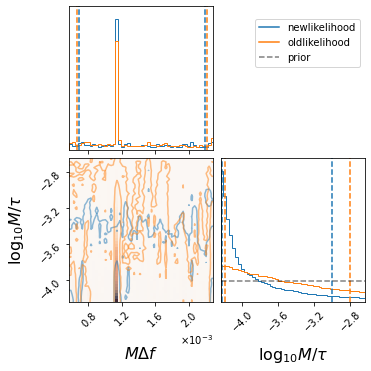

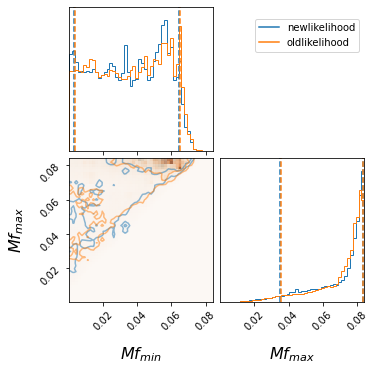

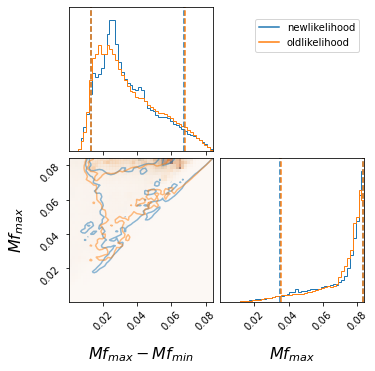

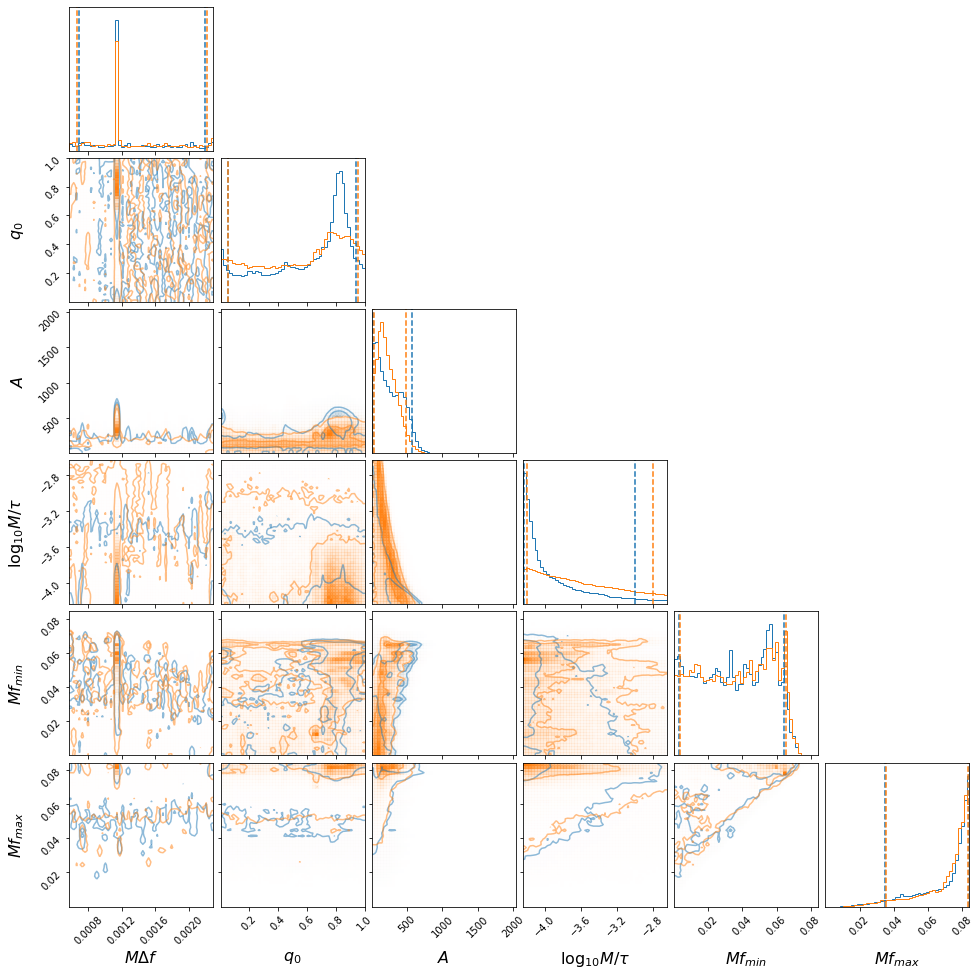

width -4.02468494176626 1.0266331332473397 0.20413337129223574
amplitude 228.16199091348474 337.0232875659452 207.16682992651462
phase 0.6914631200640173 0.24837382263922736 0.6368589599633667
spacing 0.0011504472163284822 0.0010460206584992616 0.00045555165920933285
fmin 0.03508914776469933 0.029479306382079268 0.032141971209914987
fmax 0.07675891311829748 0.0071736029143077 0.04198830177415717
duration 17402.34874281552 0.0 0.0
log_likelihood 8.049713417565226 19.568689706781367 8.352122797717863
log_prior 12.695036152912063 0.4686327921340876 2.3659756766470394
SNR 6.910035341041934 4.469097311178001 6.008460860074894
100 100
B2N050


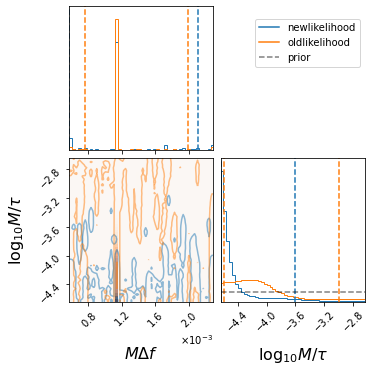

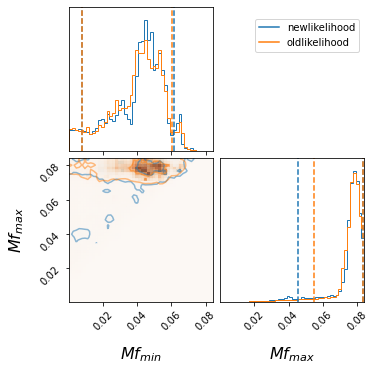

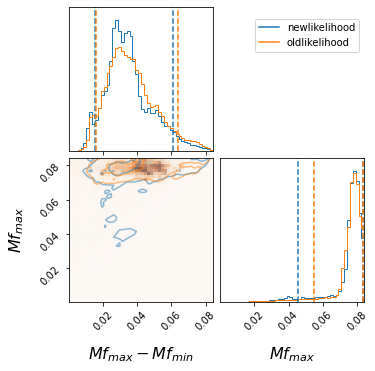

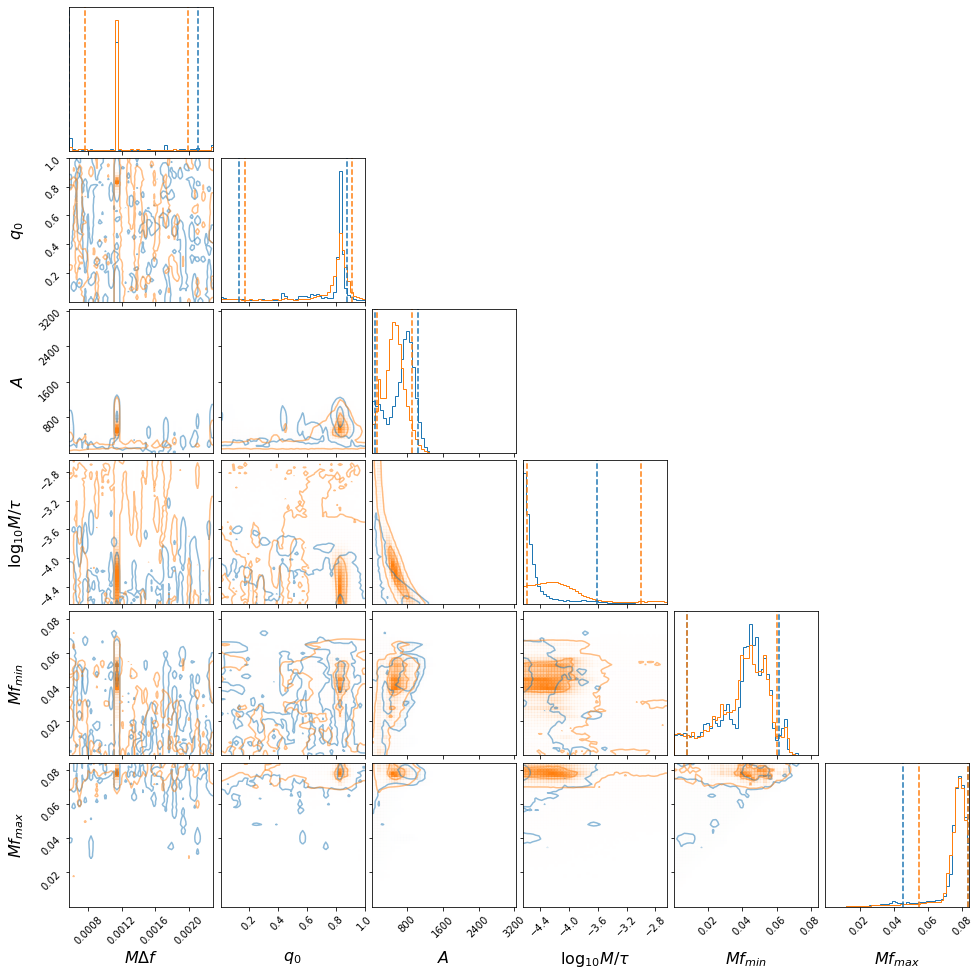

width -4.545191198366963 0.935968231104233 0.08667293093409523
amplitude 708.6469811039821 326.47327515919994 636.586476353544
phase 0.8213027222910233 0.05806953011819205 0.696908092701658
spacing 0.0011493251470533843 0.0009680163190131383 0.0005745116709963853
fmin 0.04358740433414895 0.017722936274262455 0.03607746449244201
fmax 0.07791351642124236 0.005531026054043778 0.03231284211564662
duration 43505.871857038794 0.0 0.0
log_likelihood 29.132854398553487 19.590153966902452 29.125733608561216
log_prior 13.212589951258956 0.20005515734017543 2.152089519674135
SNR 10.804580959570018 3.2454441910804075 8.59890243685447
100 100
B2N100


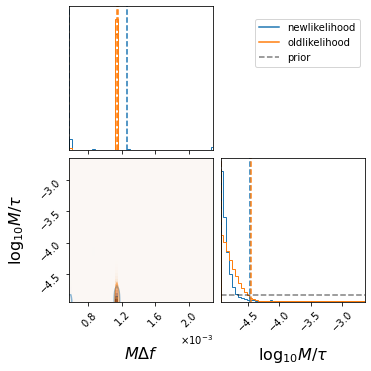

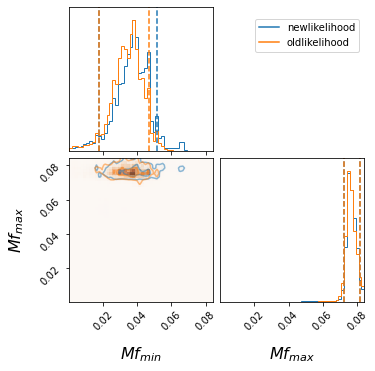

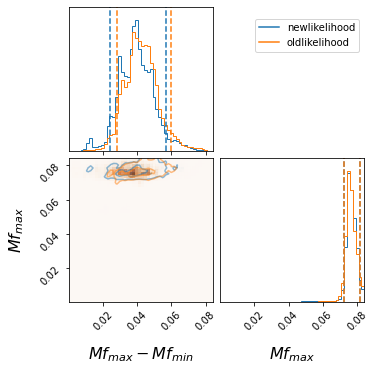

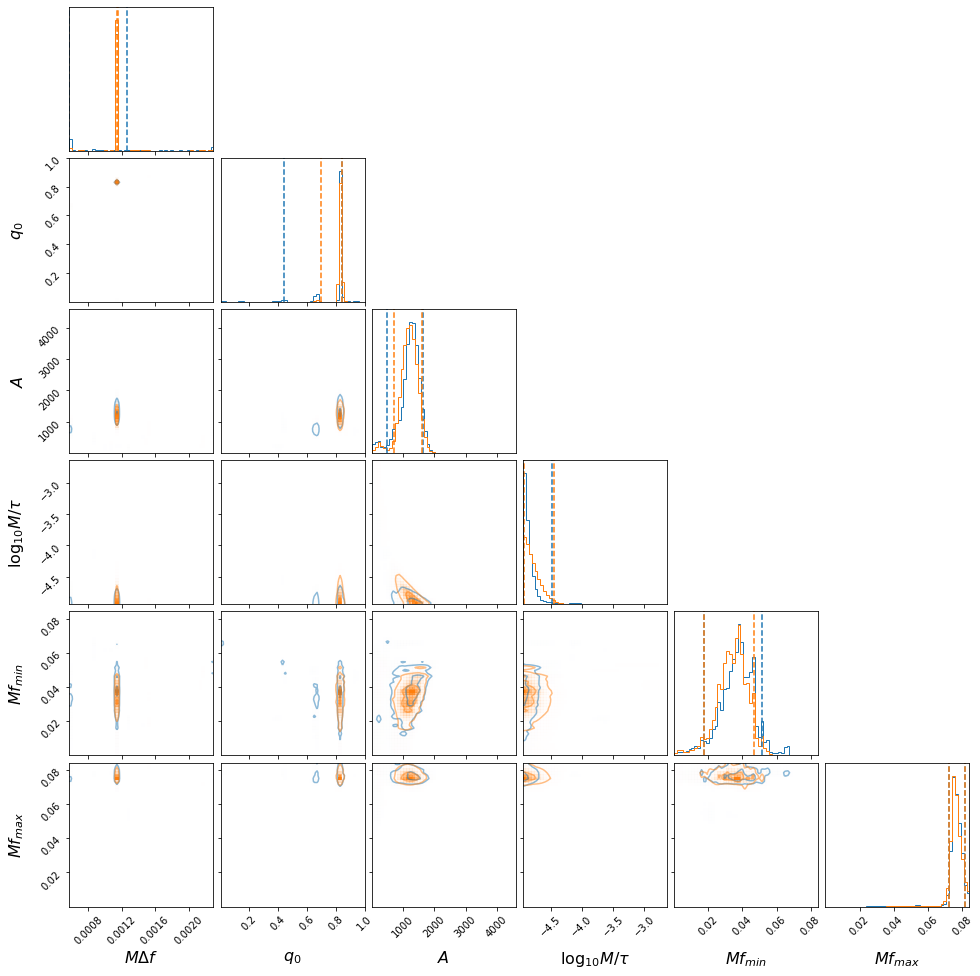

width -4.873671718910282 0.4030157187853085 0.06064844055654017
amplitude 1250.359102211326 382.99584596511636 769.8884770653727
phase 0.8306029720490417 0.009079117853029617 0.3923155799952013
spacing 0.0011492620112695875 0.00011873929695147044 0.0005746085237818702
fmin 0.03743196555808742 0.014298508441166327 0.019824795374095622
fmax 0.07640798171273779 0.005252392590679708 0.004115266069078041
duration 87011.74371407759 0.0 0.0
log_likelihood 60.83030272462371 25.460934701162387 45.85940998050913
log_prior 13.482793502329416 0.13965603062552212 0.9249900359896426
SNR 14.427465432846287 2.651367297675222 6.503301986422005
100 100
B2N150


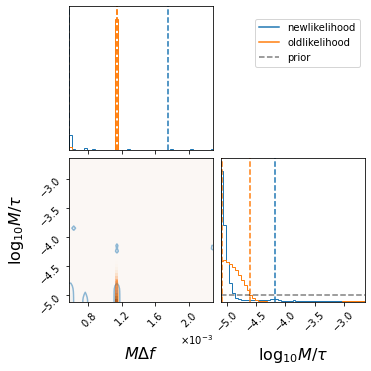

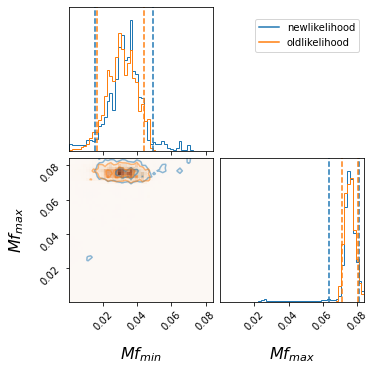

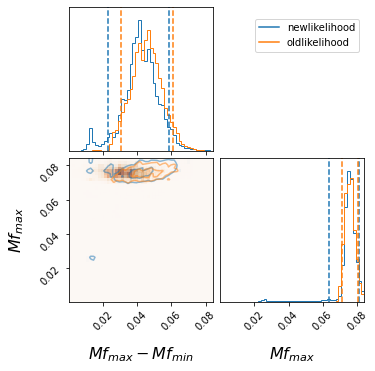

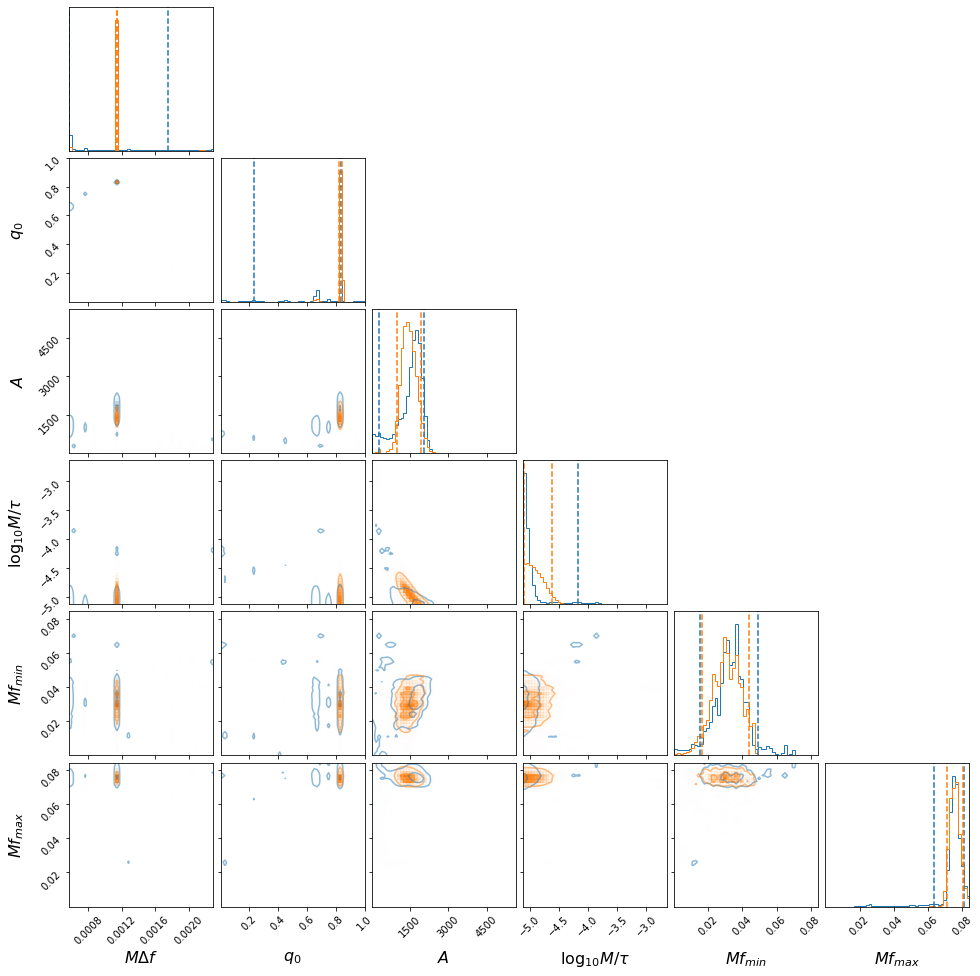

width -5.051456625028349 0.8762064382934946 0.05911699392241587
amplitude 1614.621285690779 441.6245972266495 1340.9891958704843
phase 0.8302589487428494 0.0051355756683434395 0.5958487996084626
spacing 0.0011492726892938139 0.0006103495576079462 0.0005746407557134379
fmin 0.032905505681185186 0.016013577833394063 0.01795671691940876
fmax 0.07572779490367826 0.00549298420820675 0.012215508598251351
duration 130517.61557111642 0.0 0.0
log_likelihood 77.13110997812298 21.320150210722332 72.43488293679937
log_prior 13.616042488829548 0.13632783442382035 2.0171656027276708
SNR 15.811545704986065 2.566119733431753 10.108245696285767
100 100
B2N200


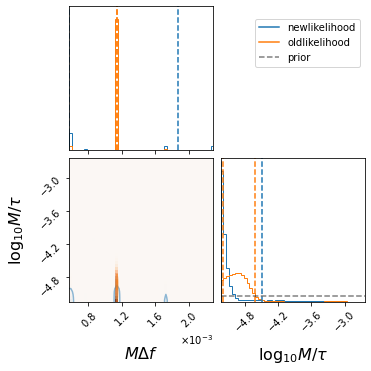

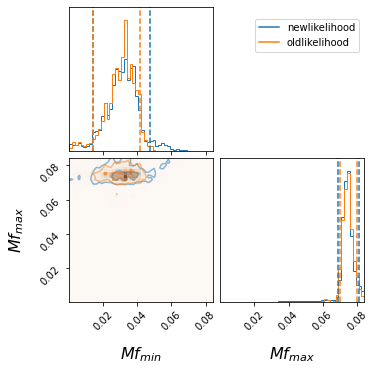

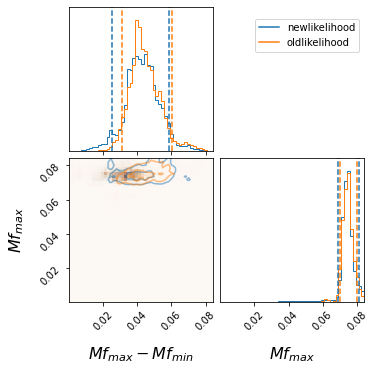

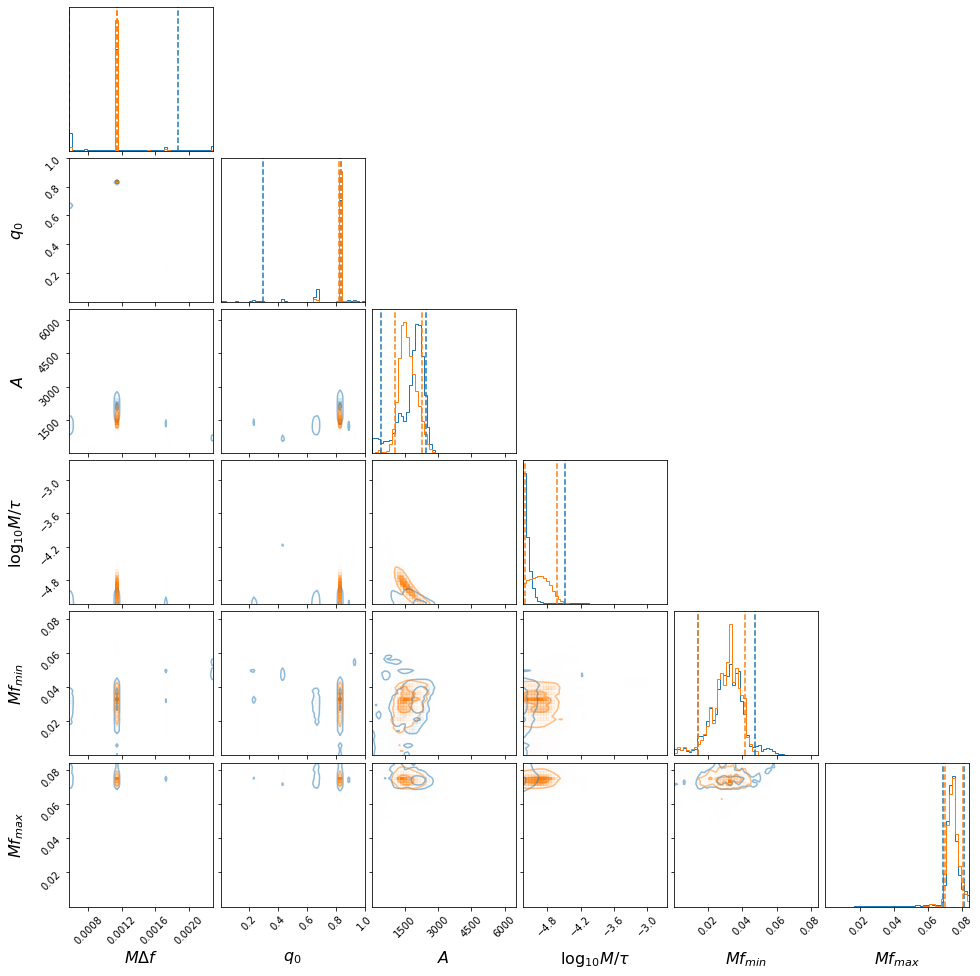

width -5.181942541677413 0.6948605538169232 0.054244816158512954
amplitude 1949.9230983876062 506.11268337417937 1523.1468779616657
phase 0.8311046148776574 0.004584803172046459 0.5347447049069811
spacing 0.0011492646660836102 0.000723652218268994 0.000574637782045809
fmin 0.0315841531082224 0.015975820003003488 0.01739106676091036
fmax 0.07440194411032043 0.006700259650060339 0.005466181806866921
duration 174023.48742815517 0.0 0.0
log_likelihood 85.06355780588211 28.710177954867774 79.32590273336001
log_prior 13.724123966566903 0.1252046668872655 1.601378863527044
SNR 16.434122749993648 2.6379482885836367 10.340077169262909
100 100
B3N010


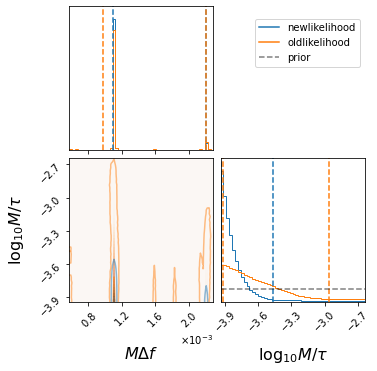

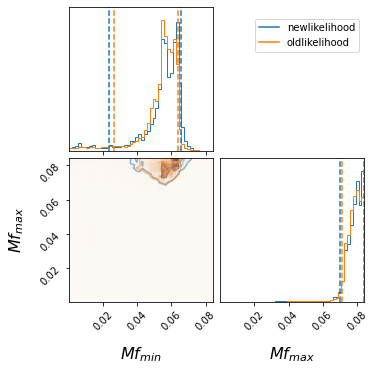

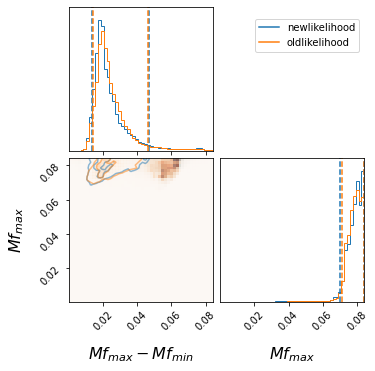

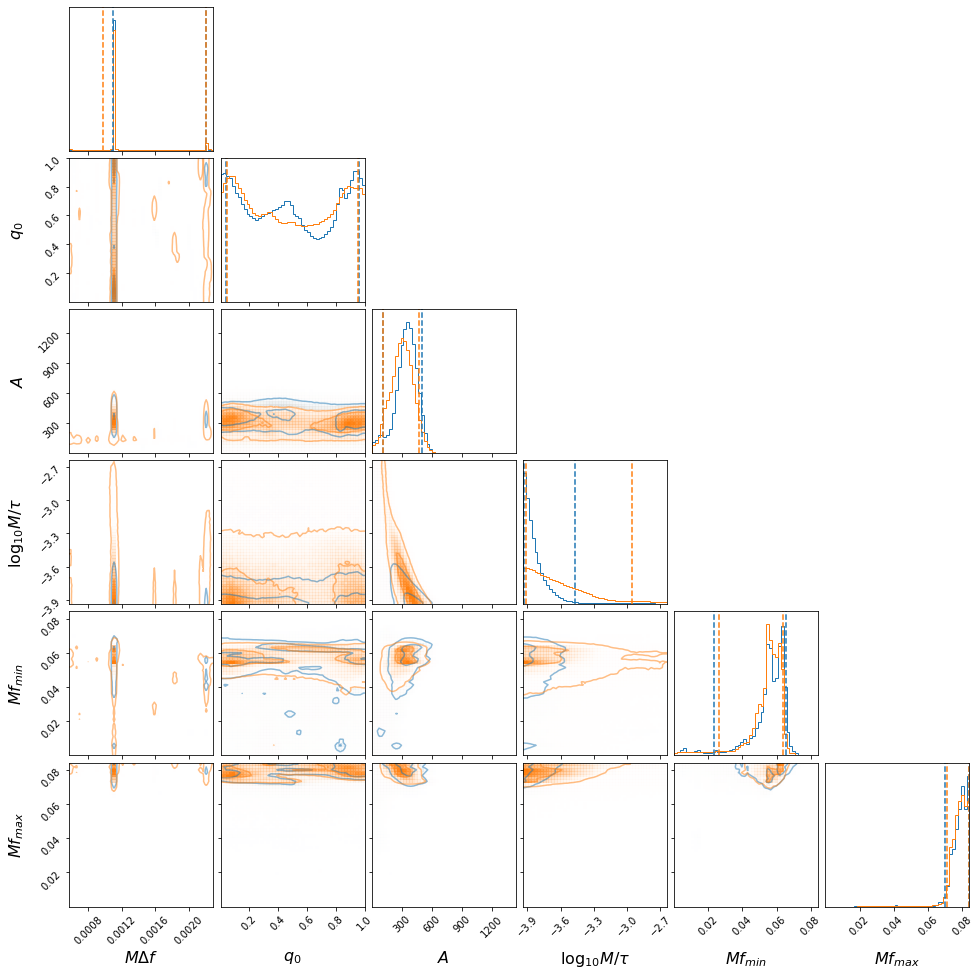

width -3.860043706410643 0.3935711324127107 0.07346562231840537
amplitude 351.59744546172385 149.12235262347025 240.85491168605623
phase 0.47666560438886374 0.4839509607634651 0.439784420806057
spacing 0.0011091445920311236 0.0010955810909024609 1.3633490739702655e-05
fmin 0.05668900220356206 0.008648643749884291 0.03349003335484776
fmax 0.07939717020447577 0.004669584832024565 0.009244660566591609
duration 8701.17437140776 0.0 0.0
log_likelihood 24.18254976393553 15.498866335784594 19.047621262432898
log_prior 12.870637293069938 0.17069371741123618 0.9059122906159391
SNR 9.62030732073843 2.7041410739069818 3.969681665657033
100 100
B3N020


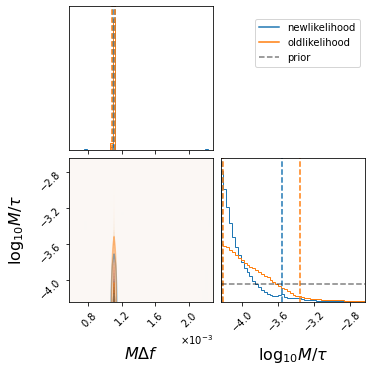

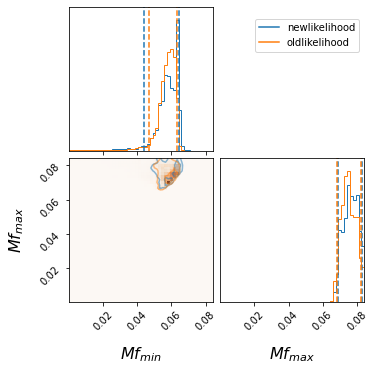

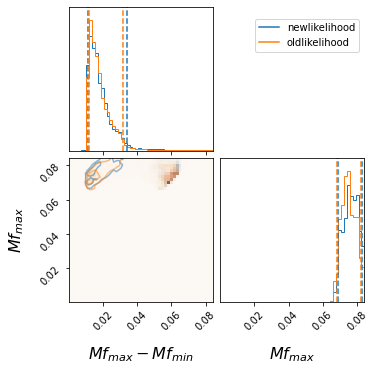

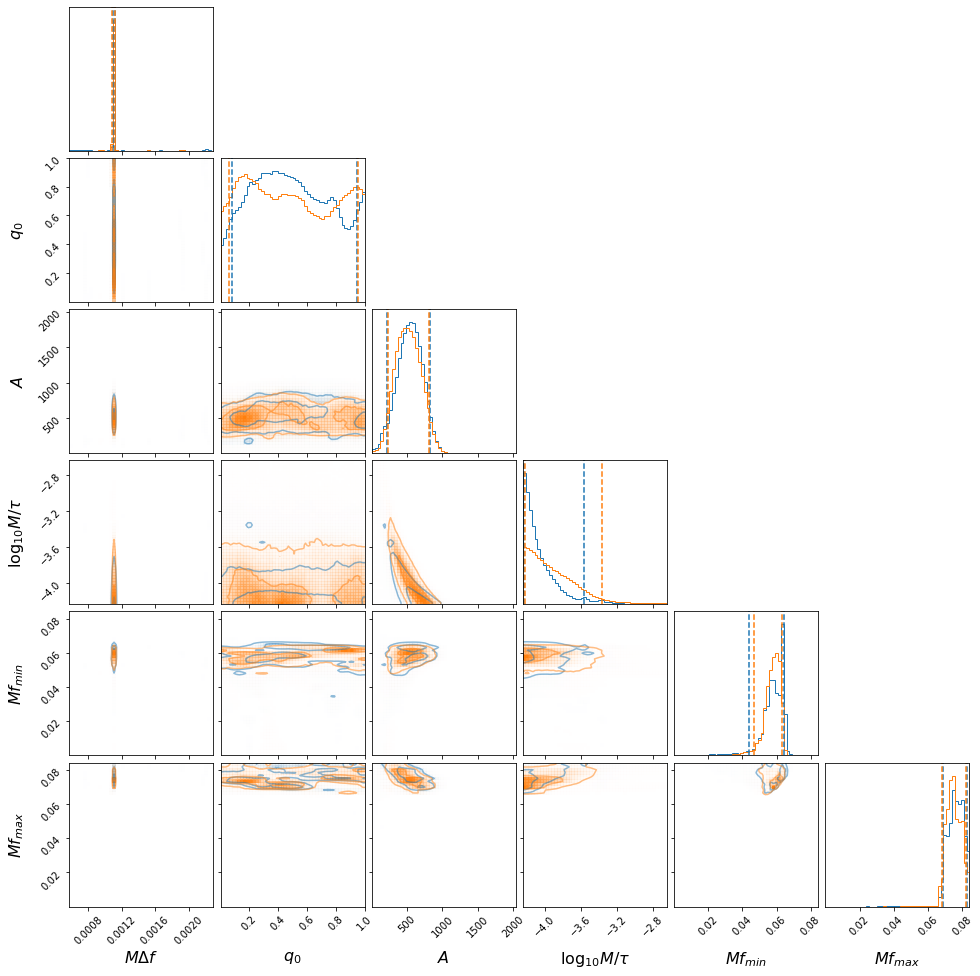

width -4.105974677823357 0.5459536461619732 0.12442124384645048
amplitude 540.0242250205775 280.6960883440913 319.5899545920237
phase 0.47676435776274817 0.47207742240108697 0.40040208158861657
spacing 0.0011066129498638647 1.4305012797541502e-05 1.528336469893885e-05
fmin 0.05877817353431599 0.0057675193681942585 0.015017370421818027
fmax 0.07644353549858539 0.006766606633385588 0.007232491354221798
duration 17402.34874281552 0.0 0.0
log_likelihood 31.401952390823396 16.580814213891294 16.160299366396046
log_prior 12.881535196883629 0.28677152438969067 1.254033479051671
SNR 10.231869750647384 2.5027237432951495 2.8459298592208393
100 100
B3N050


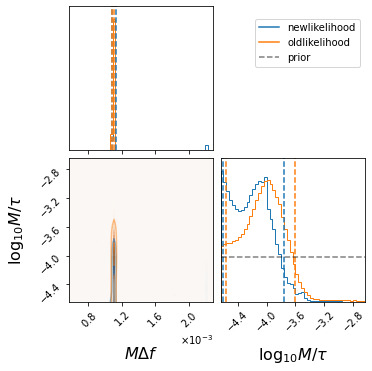

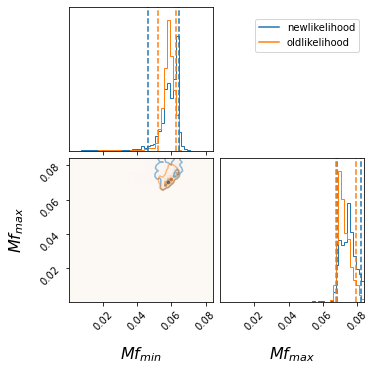

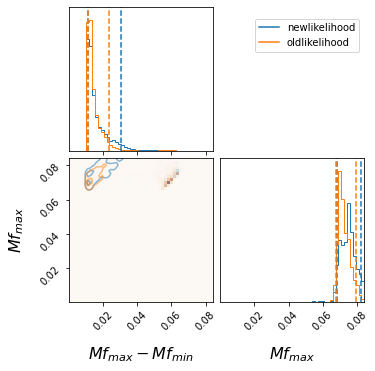

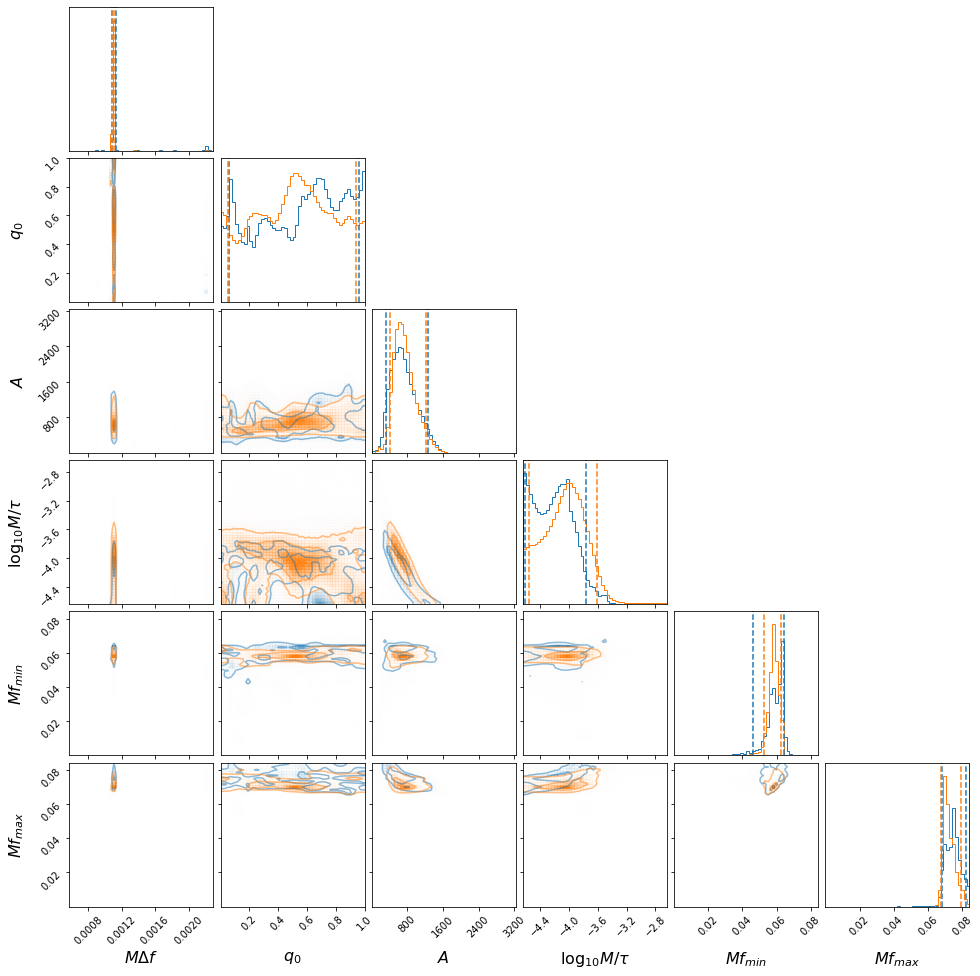

width -4.206262241861061 0.4439688011645746 0.3985793745961921
amplitude 686.3568922518922 575.307434107967 373.71489835642024
phase 0.5865389194142783 0.3765601581632677 0.5287964591662708
spacing 0.0011053994931081472 2.3674945529766466e-05 1.570641089015121e-05
fmin 0.059492545221863674 0.004749322478828477 0.013006443460934054
fmax 0.07483639073503784 0.007454304002573894 0.006626225658579829
duration 43505.871857038794 0.0 0.0
log_likelihood 34.015111925304254 16.42109255382227 14.587407609153267
log_prior 12.432510785407768 0.917579359942069 1.0189933452613467
SNR 10.350970684262567 2.355671178497218 2.547829414792788
100 100
B3N100


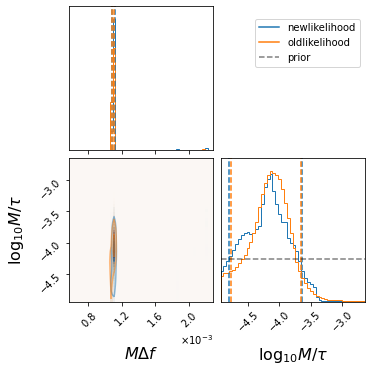

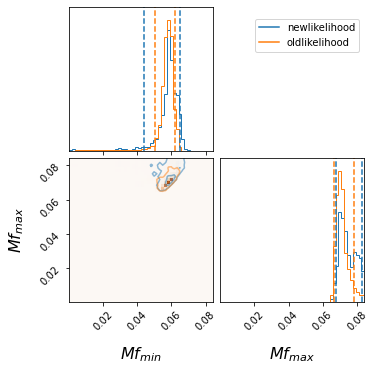

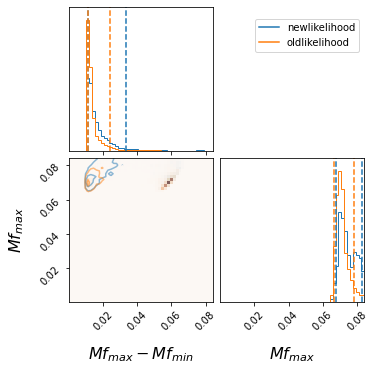

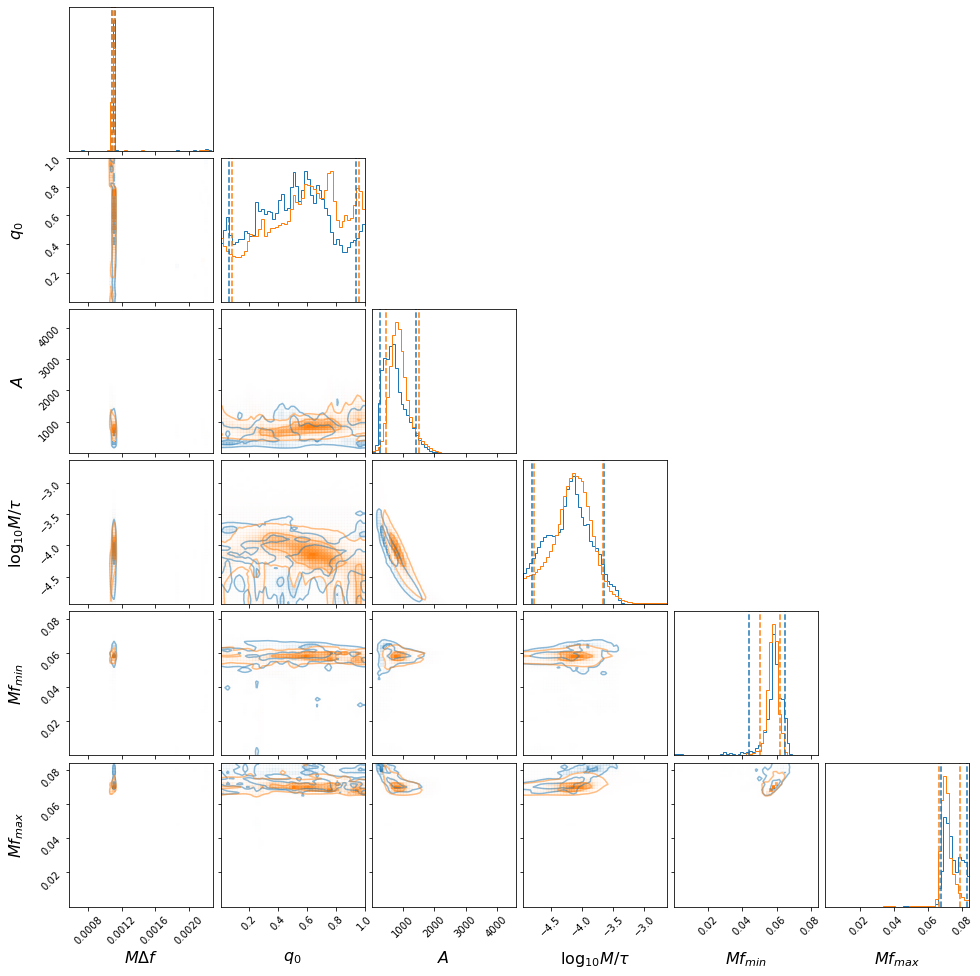

width -4.1916791630364765 0.5510307200740678 0.6120178295277148
amplitude 671.3378086182739 744.8449094273332 406.61008440396716
phase 0.510010962499367 0.43095249927109014 0.4517139590997638
spacing 0.001100742914677966 1.9081265296228564e-05 1.440850756914496e-05
fmin 0.05882270272862724 0.006177556378164577 0.014818998015589814
fmax 0.07363776587168573 0.009223612058782069 0.005699823736183274
duration 87011.74371407759 0.0 0.0
log_likelihood 32.354932471506494 11.612022389312749 11.926166799723742
log_prior 11.91123206619605 1.410578107423488 1.268628315260992
SNR 10.17490175718471 2.1185975694045123 2.2049712546946942
100 100
B3N150


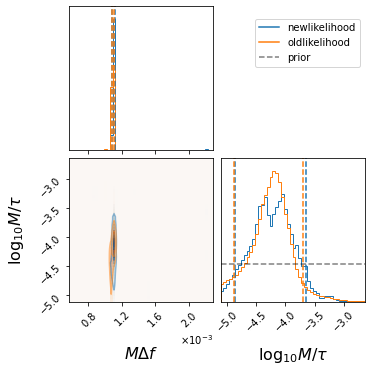

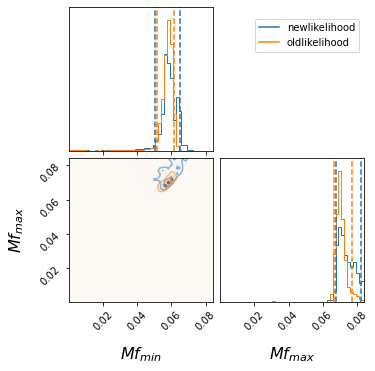

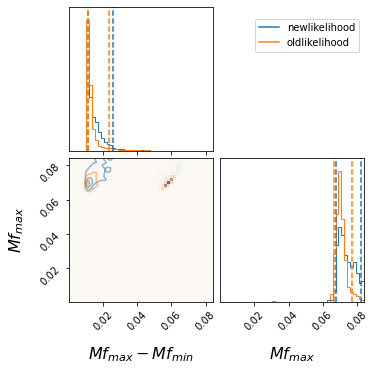

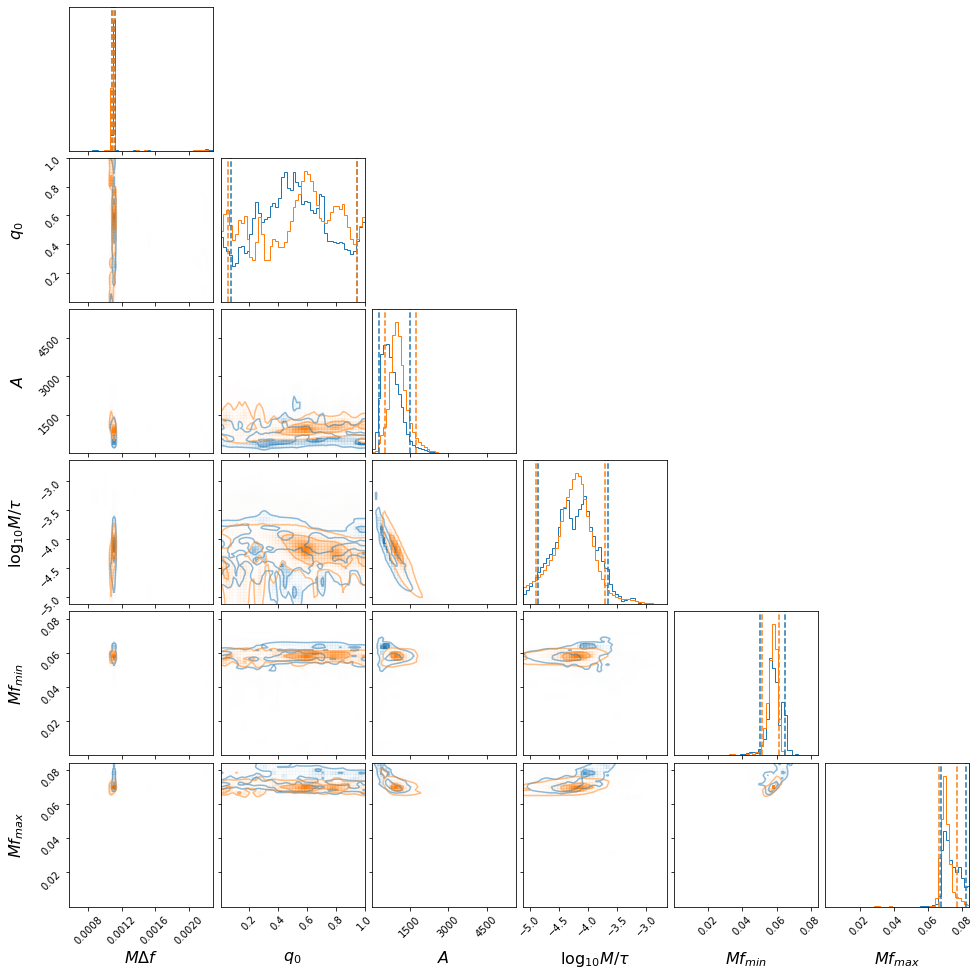

width -4.2288180181979484 0.5810084897780126 0.635186658965532
amplitude 708.2087240182985 772.5835305653171 423.40185857147014
phase 0.5027868626566387 0.44322569349232377 0.4321504930072798
spacing 0.0010997536032229314 1.9011784002047512e-05 1.2987509013398816e-05
fmin 0.05853405562467991 0.006477081132232228 0.008204628161578534
fmax 0.07282053727420604 0.009770892330617995 0.004988193926755147
duration 130517.61557111642 0.0 0.0
log_likelihood 33.16982586456017 14.285471035984799 13.877452558607057
log_prior 11.721328019630459 1.4624460353421416 1.3373282566838682
SNR 10.152337310039622 2.269104739585689 2.415524480881186
100 100
B3N200


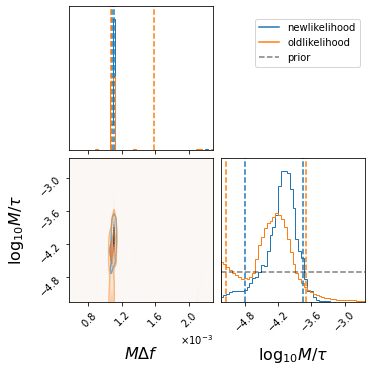

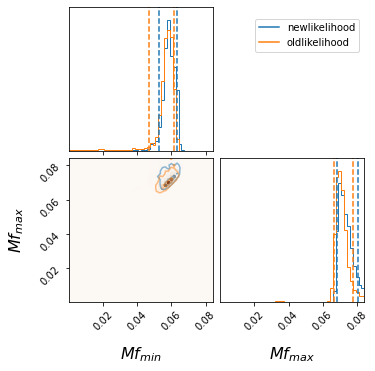

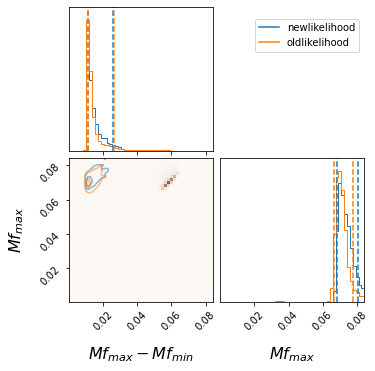

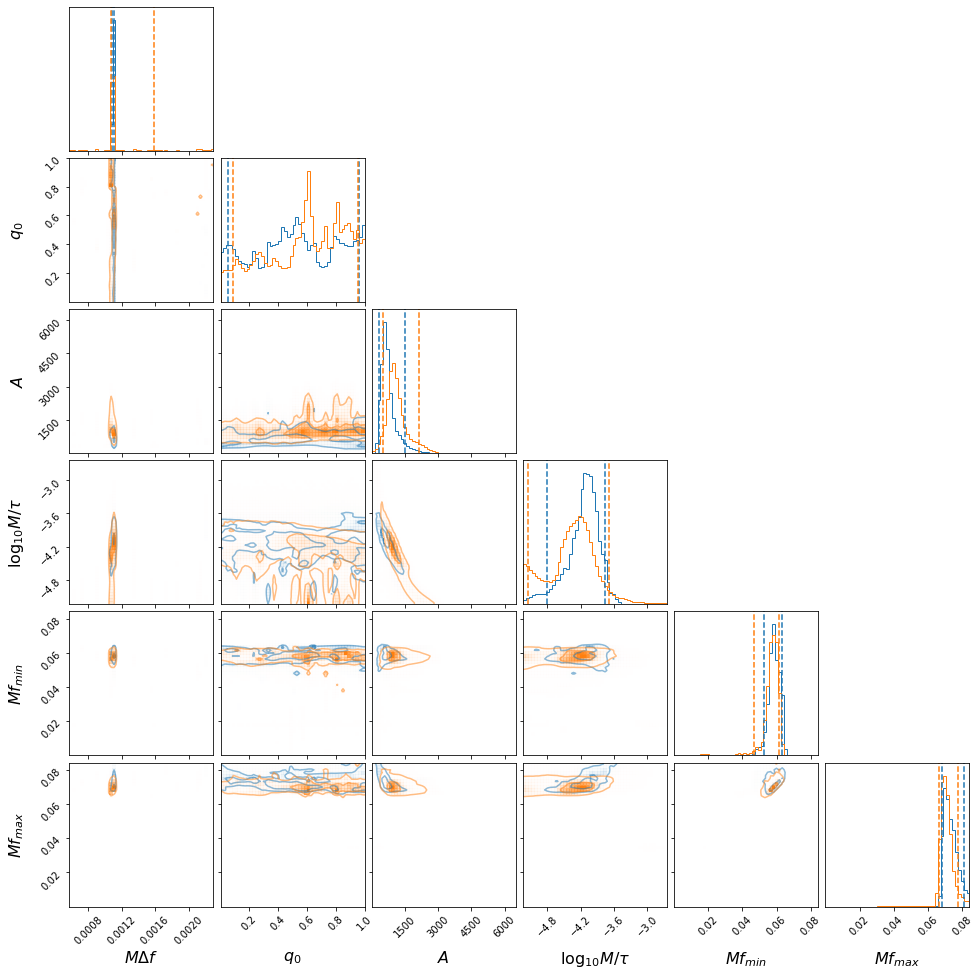

width -4.118462526345921 0.360501512997212 0.686259292770341
amplitude 657.8222607684309 844.6971962310508 338.48598871982824
phase 0.5239478344188145 0.43786545146792344 0.47205767838277324
spacing 0.001098422920785861 1.4718460739655782e-05 1.1987595502796575e-05
fmin 0.058581219807347366 0.0048130779092328616 0.006155740347869948
fmax 0.07262903580877199 0.008367759066307268 0.004456759657981937
duration 174023.48742815517 0.0 0.0
log_likelihood 36.95200691085118 13.22286914589737 13.36763354074828
log_prior 11.273817812006452 1.5816551747573087 0.8297369550623781
SNR 10.552187711402574 2.148393445490969 2.2335608694553972
100 100
B4N010


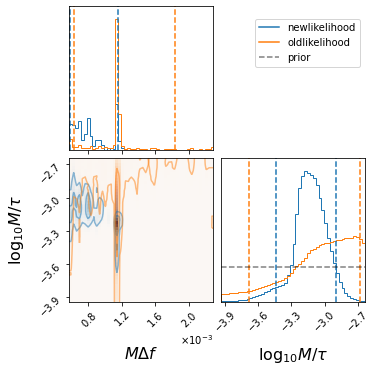

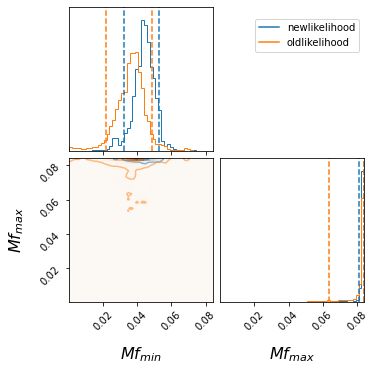

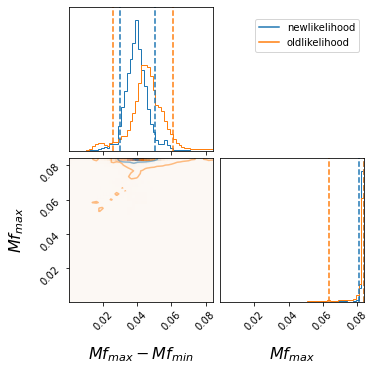

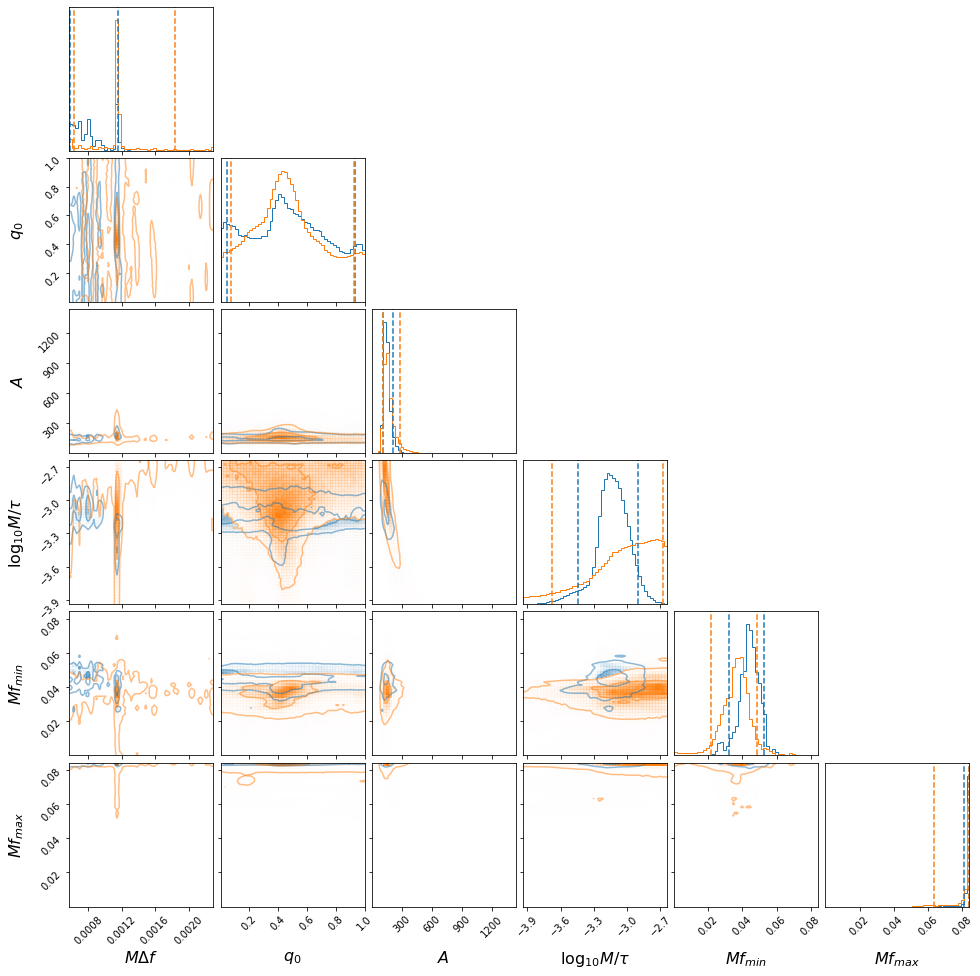

width -3.130892572311992 0.23084641098349978 0.30846807568921264
amplitude 147.07974695147104 70.14526507935526 36.62748891694066
phase 0.4647097387051201 0.47153765420913274 0.41832989403112053
spacing 0.0007864688119492858 0.0003664993827905065 0.00020641148249451492
fmin 0.04420458798139599 0.008723876489380819 0.012150000753221507
fmax 0.0838968980078696 0.0004997451498128386 0.002707914703205569
duration 8701.17437140776 0.0 0.0
log_likelihood 49.63135077609221 20.296607855491665 15.640192266465725
log_prior 11.192655795006491 0.7028115712963281 0.5352783223053894
SNR 14.25235744772361 2.7015094714501497 2.74799432922819
100 100
B4N020


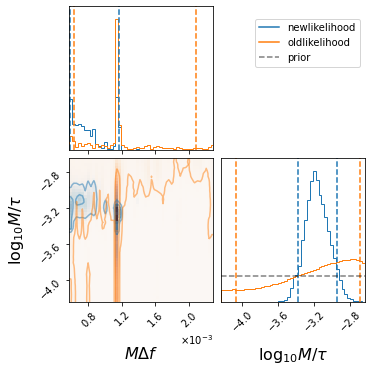

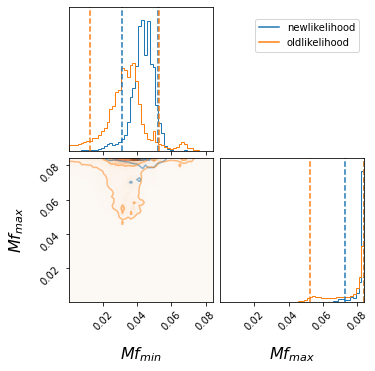

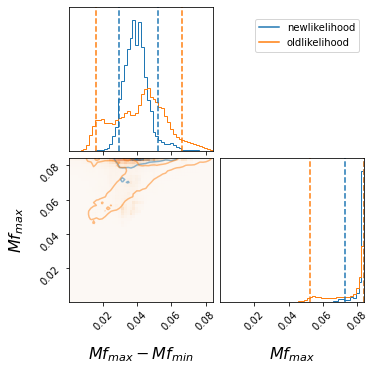

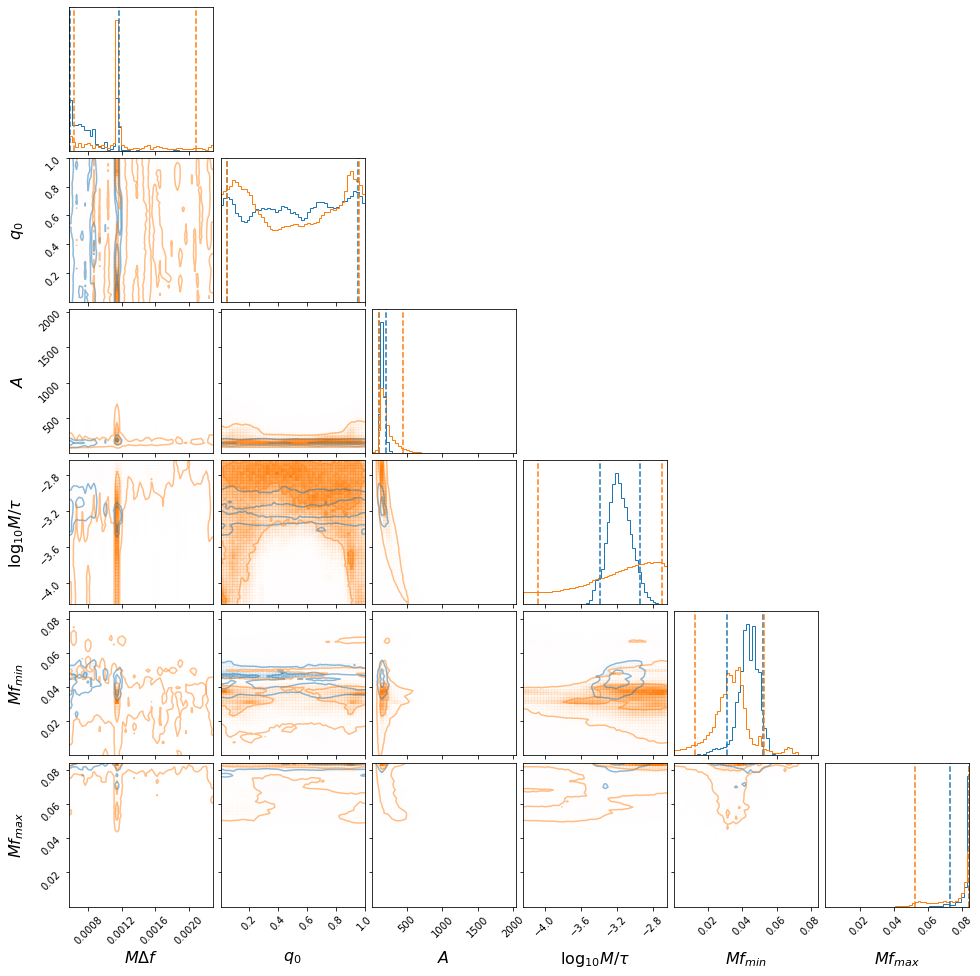

width -3.176141962730977 0.23336731919210196 0.208985938117491
amplitude 148.91290852205506 60.1095562788955 39.49752949570588
phase 0.5124448342415584 0.44182947401138917 0.4657157416110621
spacing 0.0007576269934275716 0.00040632598430888876 0.00017975505063729815
fmin 0.0434559646298223 0.008889767183027891 0.01229707829008458
fmax 0.08372690210096966 0.00066105653082979 0.010454689460140595
duration 17402.34874281552 0.0 0.0
log_likelihood 45.56439034628856 17.50123460023044 15.576986282756707
log_prior 10.73982135538362 0.4848027039214351 0.5369218524654542
SNR 13.840959082663579 2.6974451003379496 2.802653480467715
100 100
B4N050


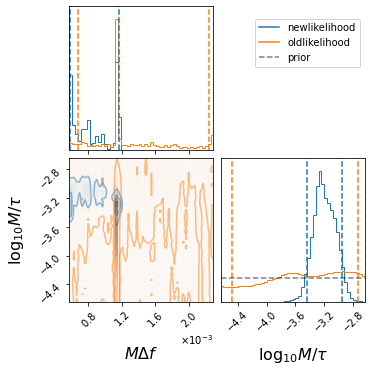

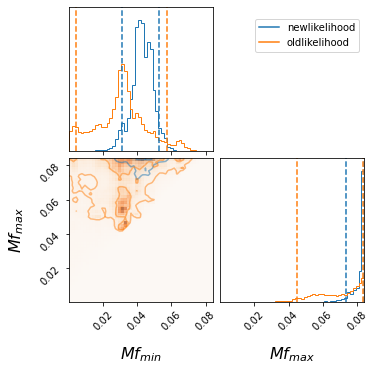

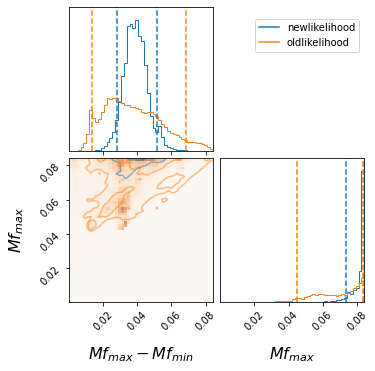

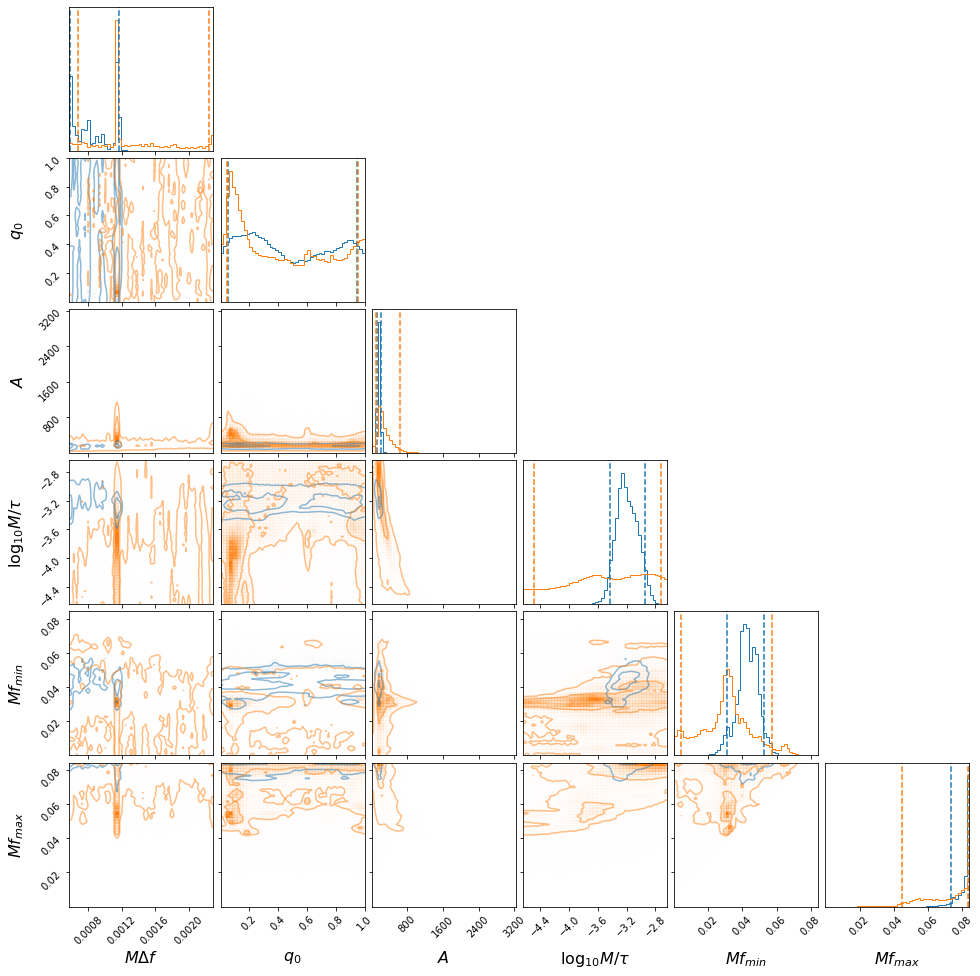

width -3.2069444080382965 0.25832951644048663 0.22740755761526055
amplitude 153.21449911947226 64.46934662221054 40.128501255127375
phase 0.4491278469466772 0.4986904335192587 0.3989000351524212
spacing 0.000807152164483573 0.000358658511244986 0.0002313312026830319
fmin 0.0428648582835959 0.009863879885201945 0.011949808818929555
fmax 0.08334615953605683 0.001008069168232359 0.009822650137869302
duration 43505.871857038794 0.0 0.0
log_likelihood 43.57239429041254 13.331809212430187 12.93027001603
log_prior 10.132427279061856 0.5224348123229721 0.5942197354442893
SNR 13.474719469015572 2.7211434964714485 2.6330384503648148
100 100
B4N100


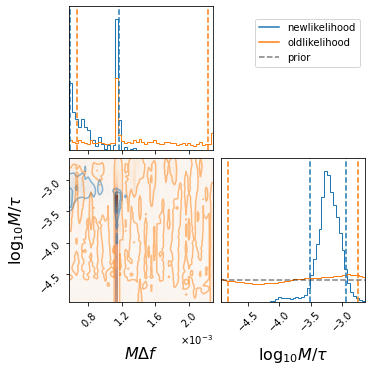

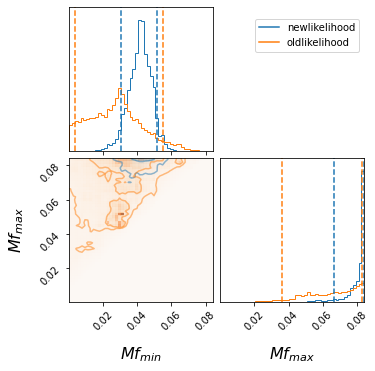

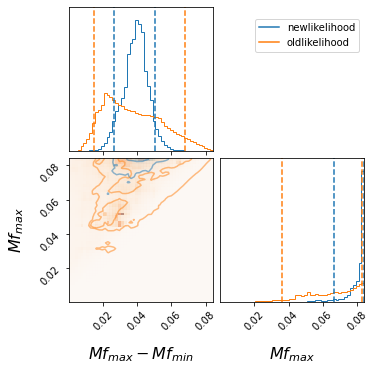

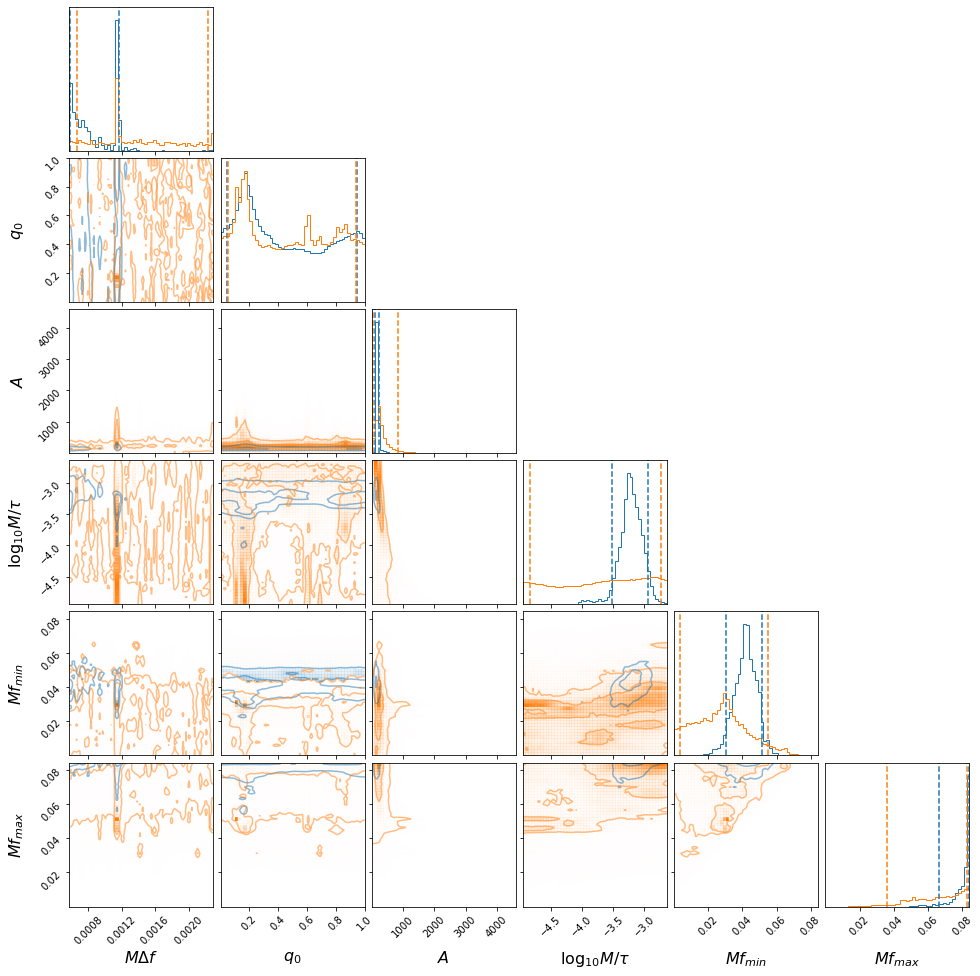

width -3.216096967228849 0.27639247748389684 0.30164550212589436
amplitude 154.07440668745323 91.87087027697086 42.16087209082201
phase 0.4034701418852628 0.5459554709717145 0.35617035016803805
spacing 0.0008072850410557737 0.00036401310978376384 0.00023106721242523414
fmin 0.04186140524155787 0.009712162724083019 0.011572804899383494
fmax 0.08283520410896333 0.0015139804264566598 0.016109219001482794
duration 87011.74371407759 0.0 0.0
log_likelihood 43.03759864923523 15.439478888306894 13.5308852767802
log_prior 9.666131623962539 0.6955824007738372 0.6348537537702477
SNR 13.400025691160952 2.86833979515659 2.798767584722812
100 100
B4N150


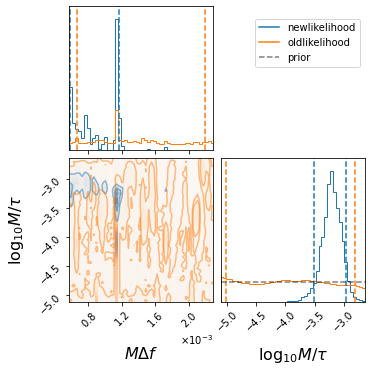

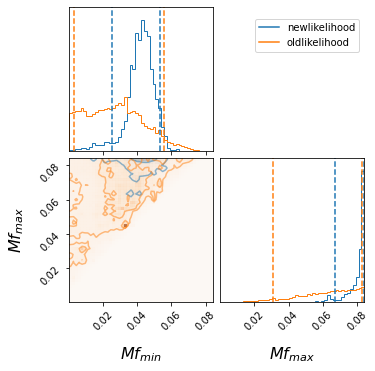

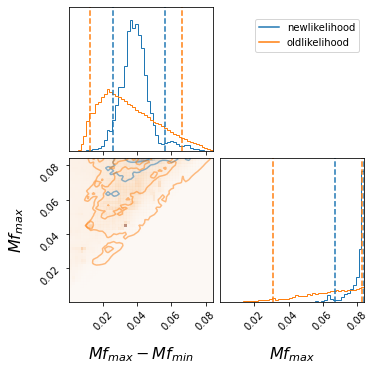

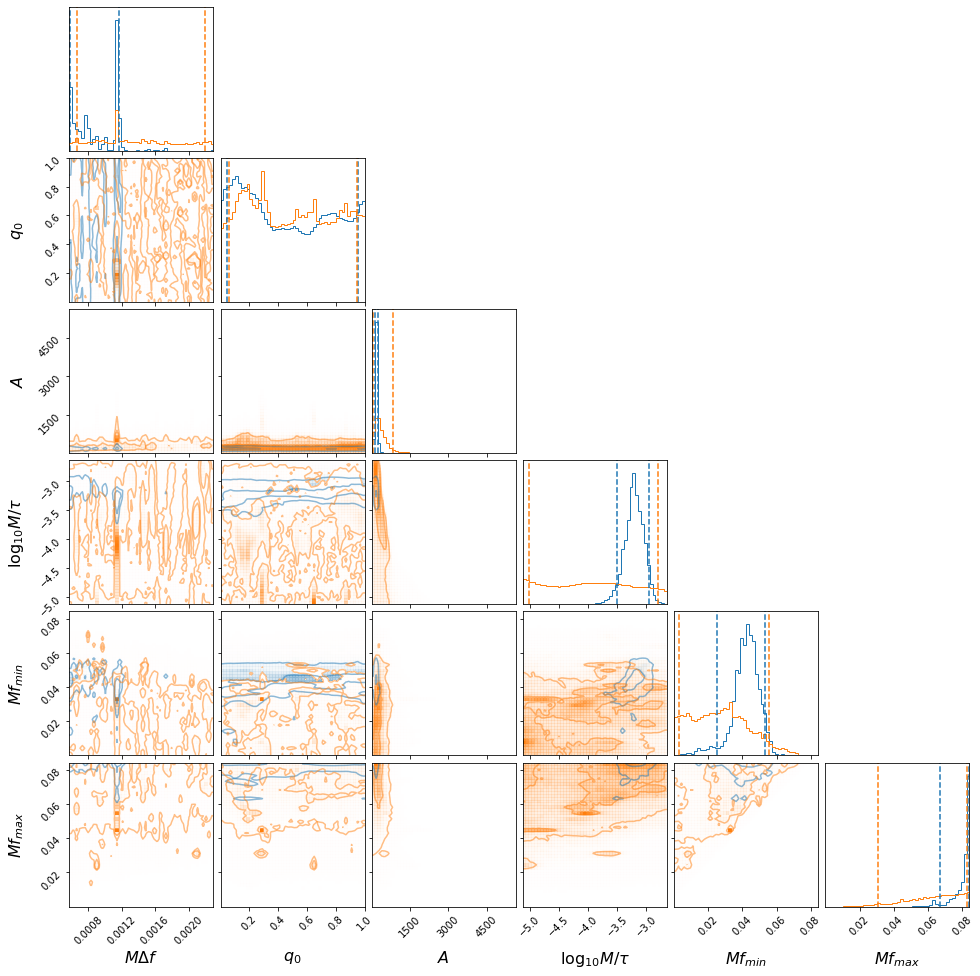

width -3.206158308688982 0.2555830657355913 0.29625726143224096
amplitude 153.38993121158262 90.1388377554789 41.27798892085504
phase 0.4487495546260921 0.5059372974032902 0.4074465011428411
spacing 0.0008885019939861583 0.00028285208187285463 0.00030950422728189073
fmin 0.04260673562311665 0.010720620625393043 0.017609141761534306
fmax 0.08259457914686441 0.0017417891112410377 0.015492881846155784
duration 130517.61557111642 0.0 0.0
log_likelihood 42.424262509341055 15.681799245263079 15.314749176818001
log_prior 9.36714377053703 0.6834918691157323 0.5882363805494659
SNR 13.286657606278139 2.7471165344980637 2.977612173443358
100 100
B4N200


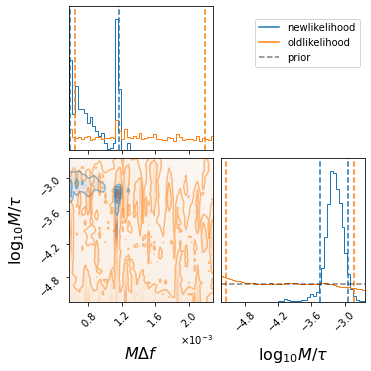

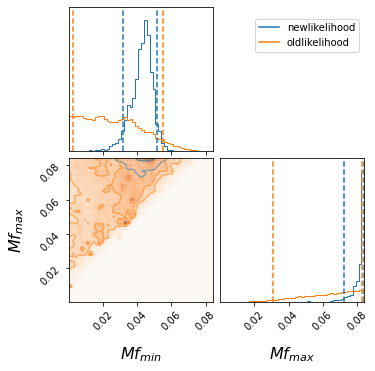

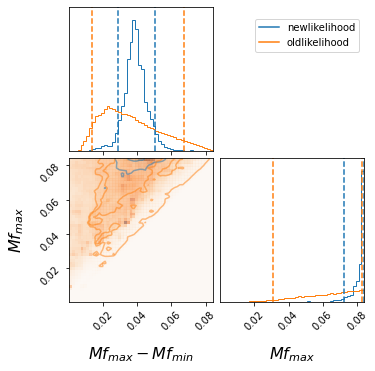

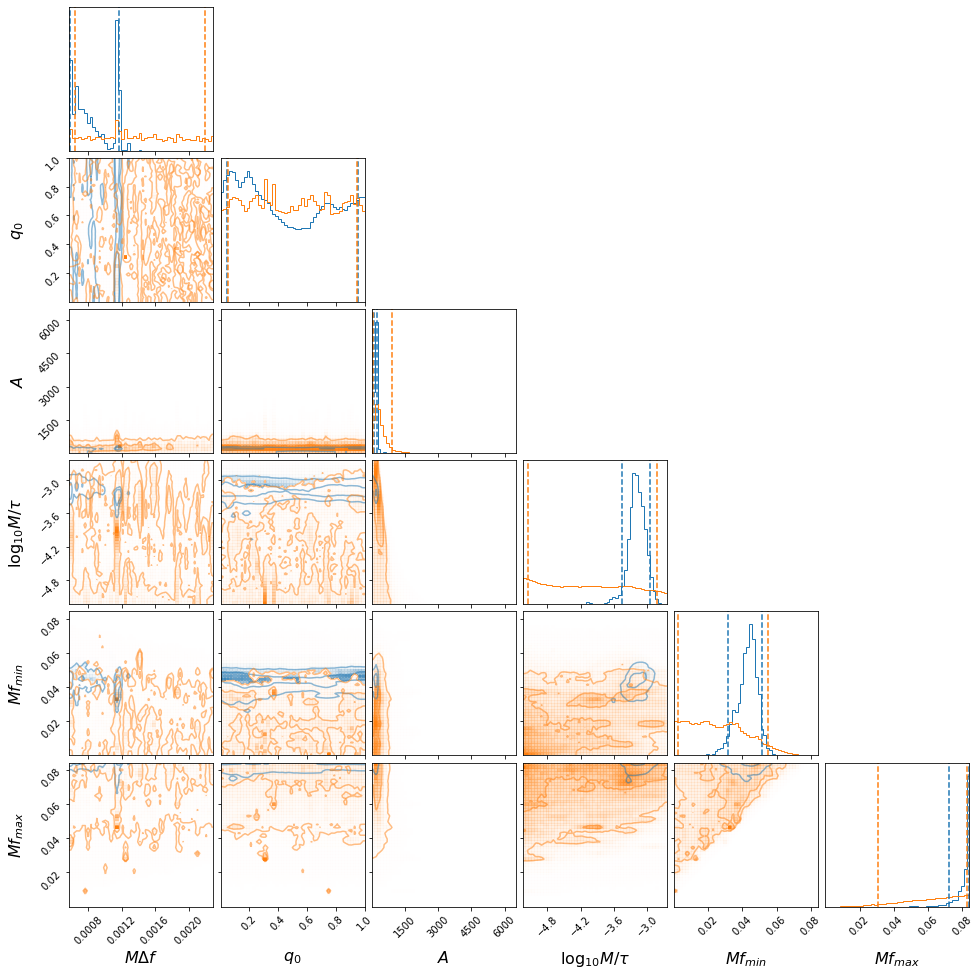

width -3.1858767970440303 0.239520457463962 0.25826376843050136
amplitude 150.2308974550593 81.00225708060731 40.677424909346314
phase 0.44657318929114975 0.5065069963966635 0.4043822612010095
spacing 0.0008082206809987784 0.000361293866591714 0.00023088821940847268
fmin 0.04347842689556483 0.007854711778076881 0.0120120353580817
fmax 0.08311997073975737 0.0012249632057465404 0.01037081109233419
duration 174023.48742815517 0.0 0.0
log_likelihood 43.83202533857316 17.875448937910534 14.30972337615098
log_prior 9.127111142874135 0.5957493433806 0.5515799391829574
SNR 13.56928443856375 2.797228723788388 2.863333659401471
100 100
noiseN010


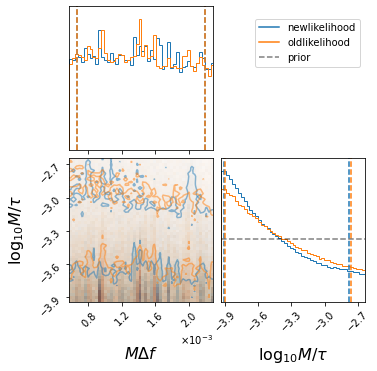

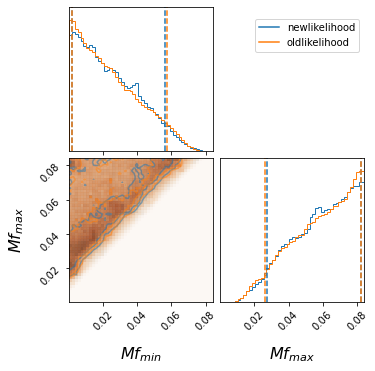

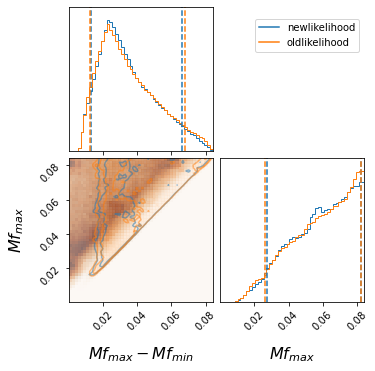

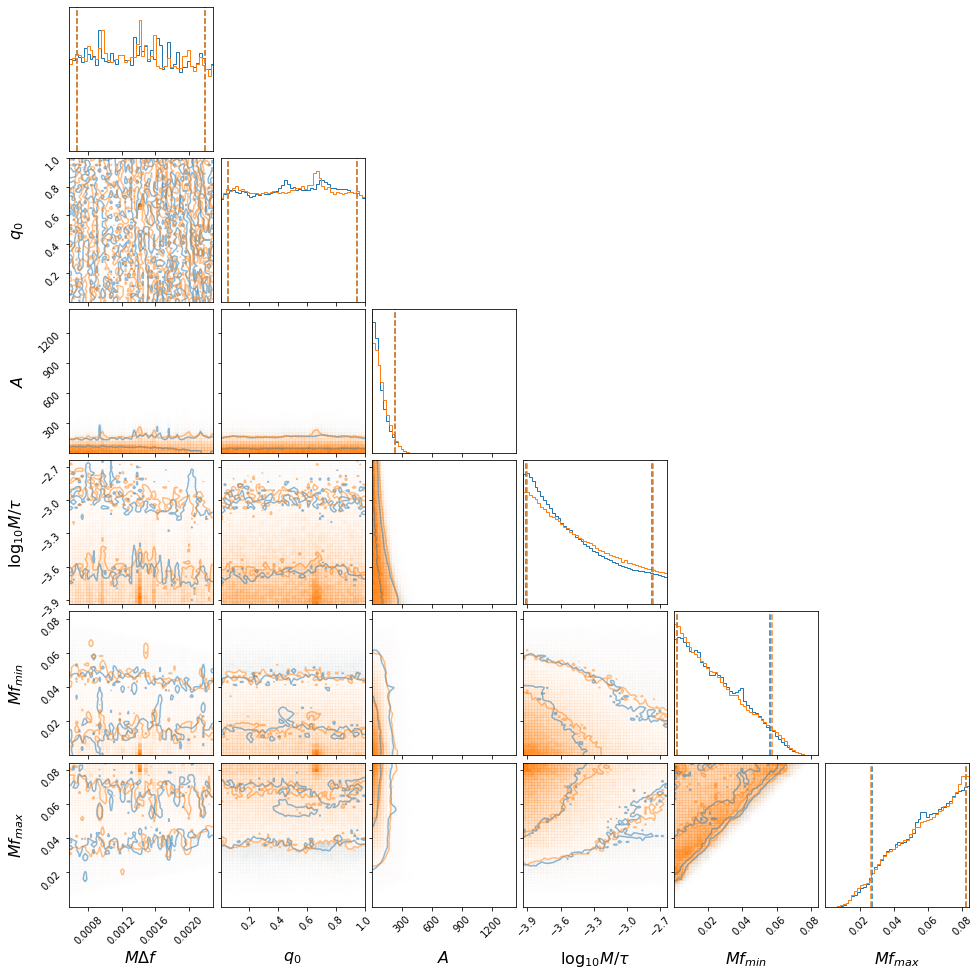

width -3.5500230459685547 0.7712040105435474 0.3581159204027893
amplitude 65.49444436402682 163.96654655681903 58.22967564193744
phase 0.5067098249898095 0.44059246602419333 0.45414595798238844
spacing 0.0014211994318562085 0.0007792520478553879 0.000759051204459193
fmin 0.021476672790193746 0.03454430560396273 0.01956602539429843
fmax 0.06113815955699405 0.02124622947089356 0.03379590887052298
duration 8701.17437140776 0.0 0.0
log_likelihood 0.21037540934698706 8.954751483687406 1.149993564113132
log_prior 12.15662229251491 0.8248510923567238 1.7759311722740598
SNR 3.26022377236822 4.4228400829366645 2.873589772578198
100 100
noiseN020


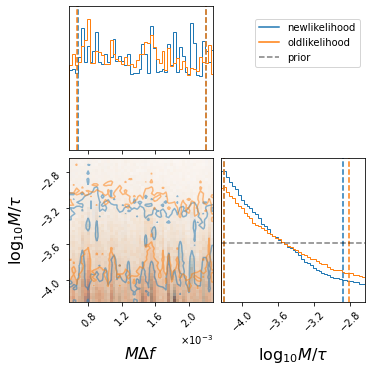

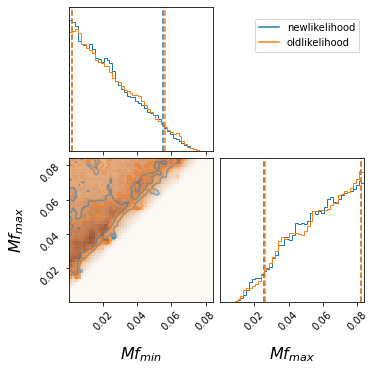

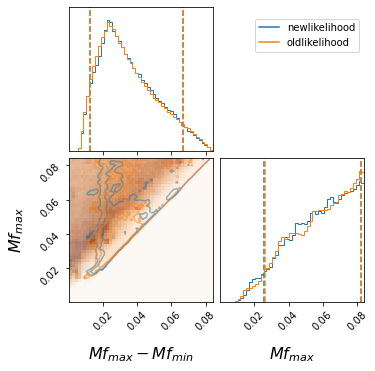

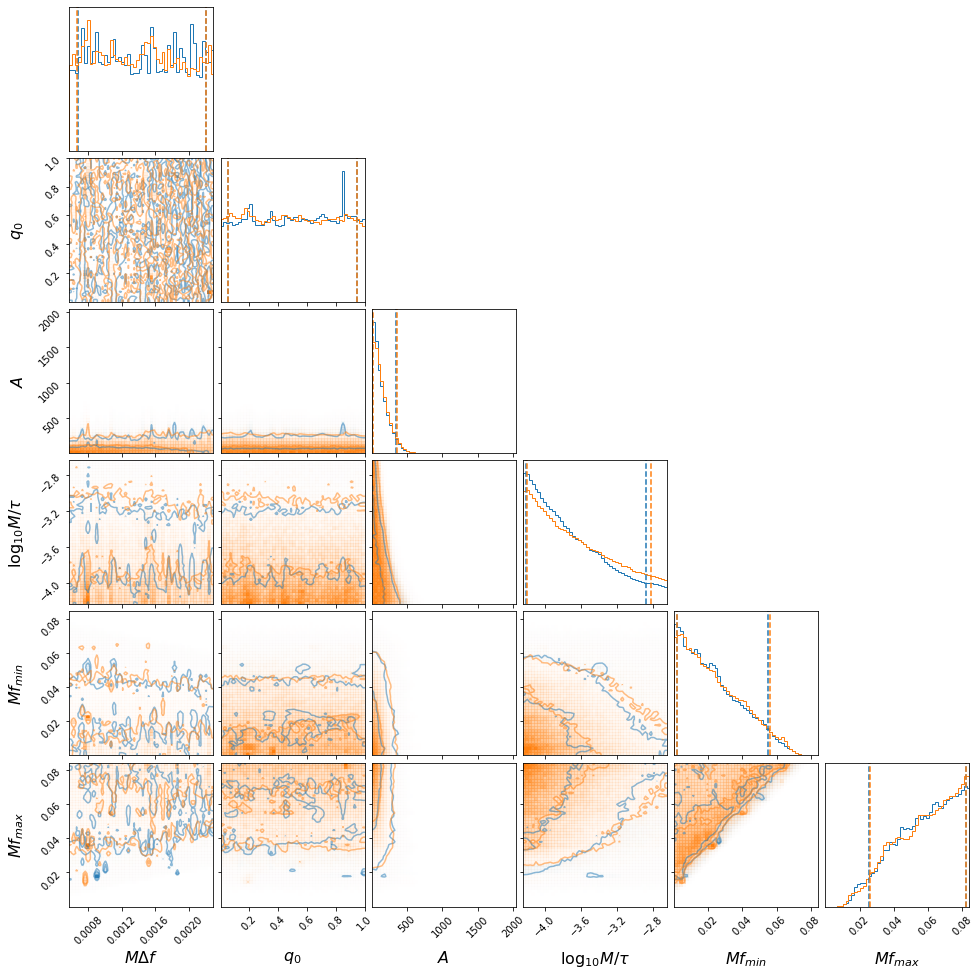

width -3.799372069842442 0.9214512326601918 0.4053577666741921
amplitude 101.43276498377146 242.39806448990828 90.82108049117133
phase 0.5112330249114905 0.4379128733815536 0.4578183012546147
spacing 0.001445503955132855 0.0007668545989903855 0.0007711080471198839
fmin 0.02014618071761881 0.03478945260738835 0.018494619277049963
fmax 0.06044891755725831 0.021831401006996994 0.034602390473177175
duration 17402.34874281552 0.0 0.0
log_likelihood 0.6166769406154664 11.636681151473498 1.4309933842309586
log_prior 12.175038179273924 0.933845949145784 2.1221939938422505
SNR 3.84788249212381 4.583315042262109 3.3936636961472524
100 100
noiseN050


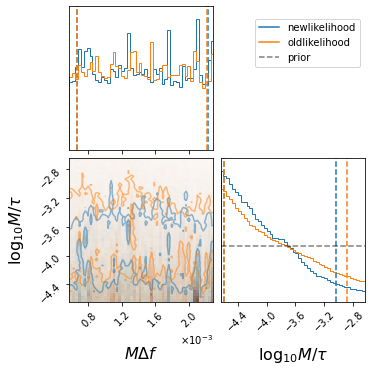

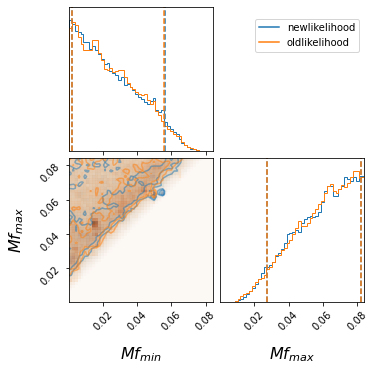

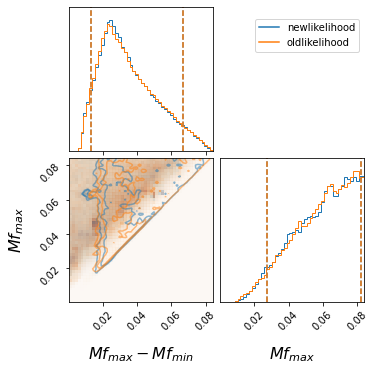

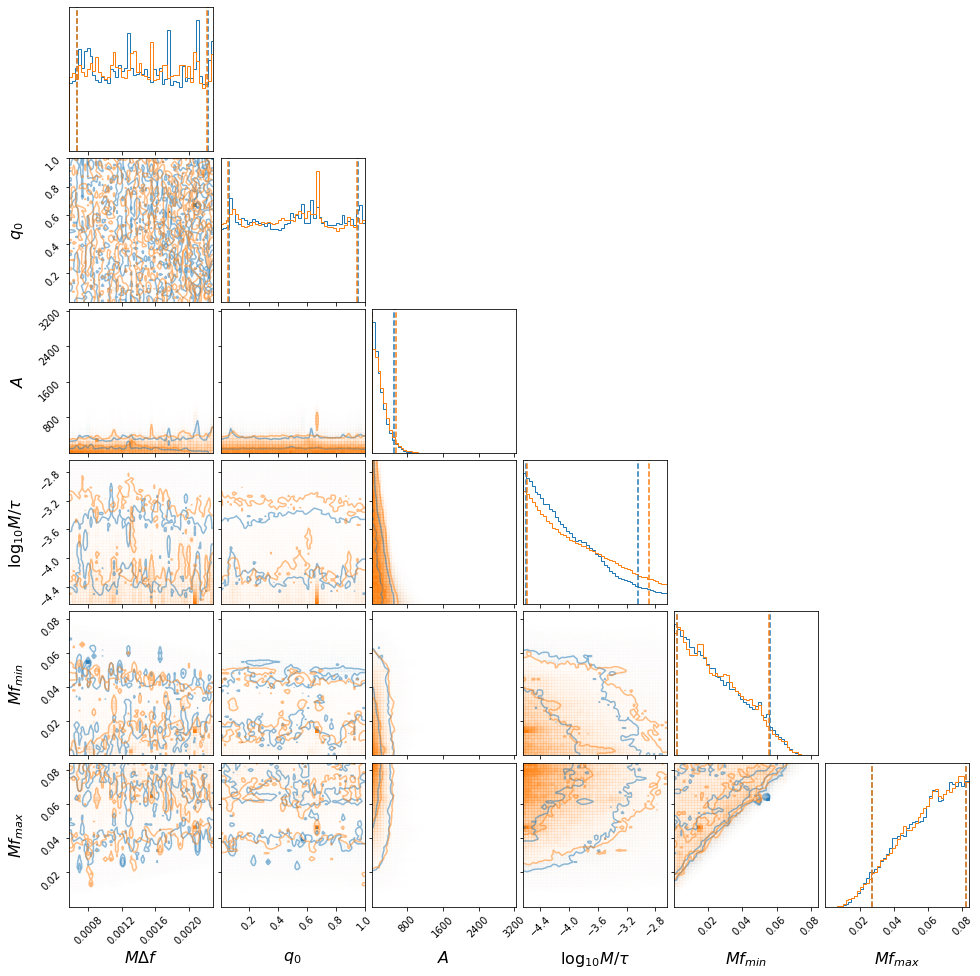

width -4.115556526417661 1.0733626395311324 0.4804598881533577
amplitude 145.90628038137368 362.2575797616254 131.01532140875514
phase 0.5138460514809519 0.4412560512096363 0.45838500530586046
spacing 0.0014245380511291013 0.0008024719303626675 0.0007562804253513991
fmin 0.021305936198538534 0.03480727865056346 0.01953029120105471
fmax 0.061870958962266936 0.020442082262266306 0.03436485329277074
duration 43505.871857038794 0.0 0.0
log_likelihood 0.6194476091907527 12.085038771453263 1.4291691369149429
log_prior 12.224484146522244 1.106759984298991 2.4721307448587737
SNR 3.836395347753887 4.6619354285261725 3.3681012701721955
100 100
noiseN100


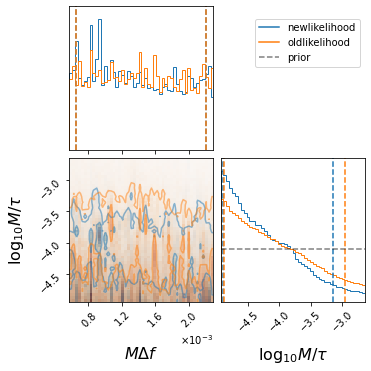

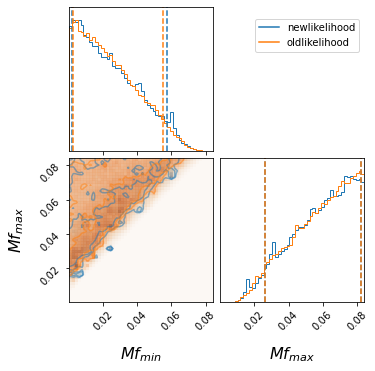

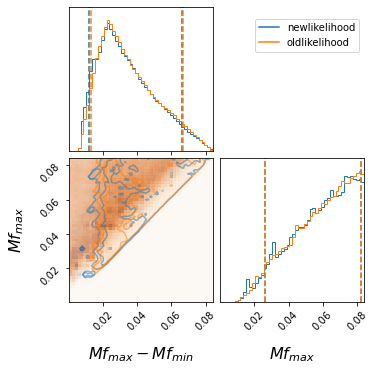

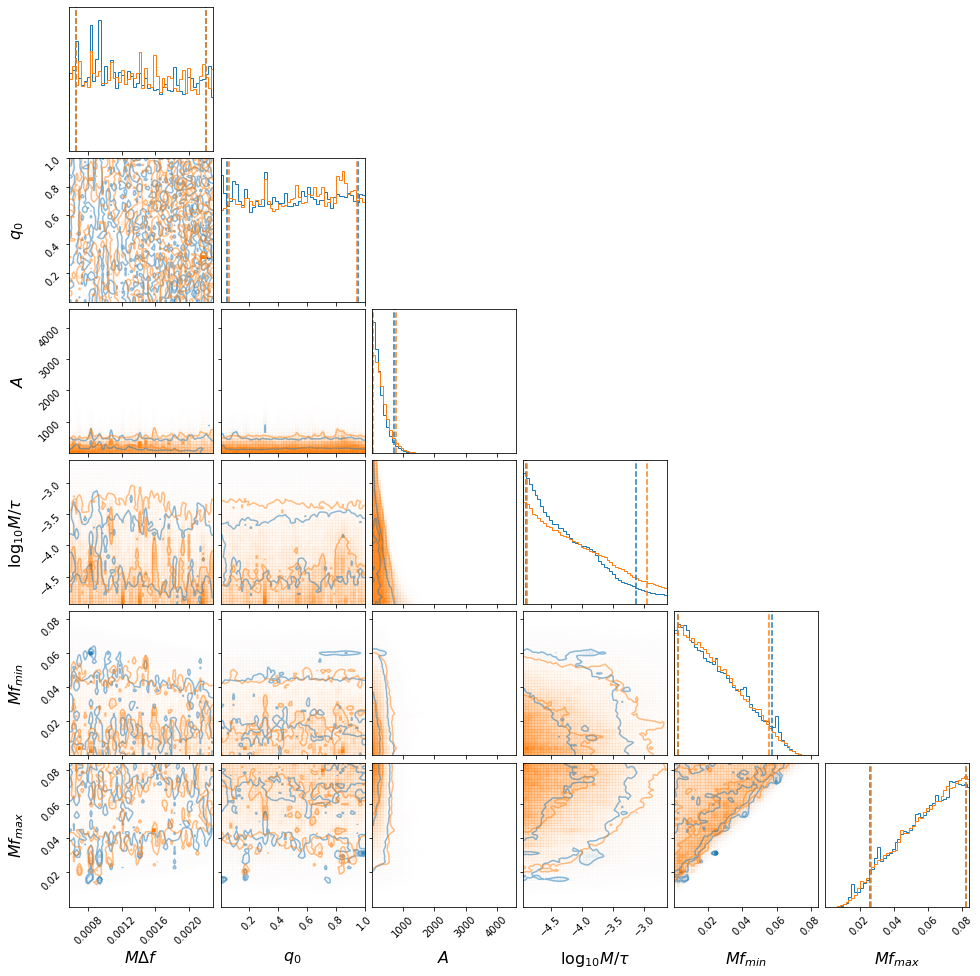

width -4.3411601324590094 1.204277356494202 0.5524719714971429
amplitude 196.87207463291764 506.73345627827774 176.0387837557522
phase 0.5012376385501576 0.4498421170044731 0.45632887715815185
spacing 0.0013504162969781215 0.0008564587702655497 0.0006957783164459653
fmin 0.0216173679769898 0.035529527673508254 0.019662578263584318
fmax 0.06130847212505177 0.020906082605329925 0.03494382951198226
duration 87011.74371407759 0.0 0.0
log_likelihood 0.9317831775193594 11.892144472796257 1.67730921920842
log_prior 12.256829244699937 1.27174032083623 2.7731508344906235
SNR 4.1276462363971325 4.659701956967692 3.6141953044257606
100 100
noiseN150


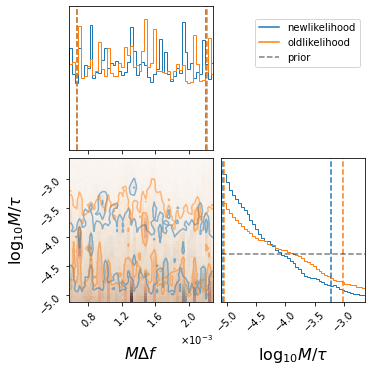

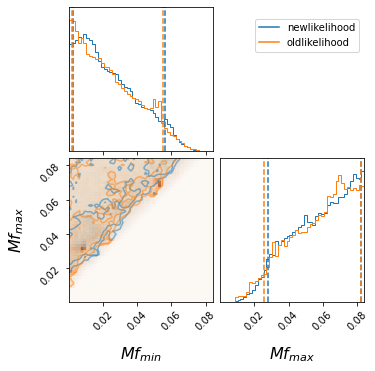

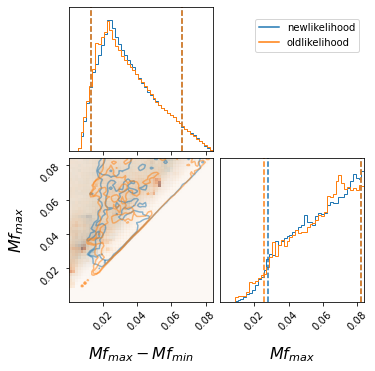

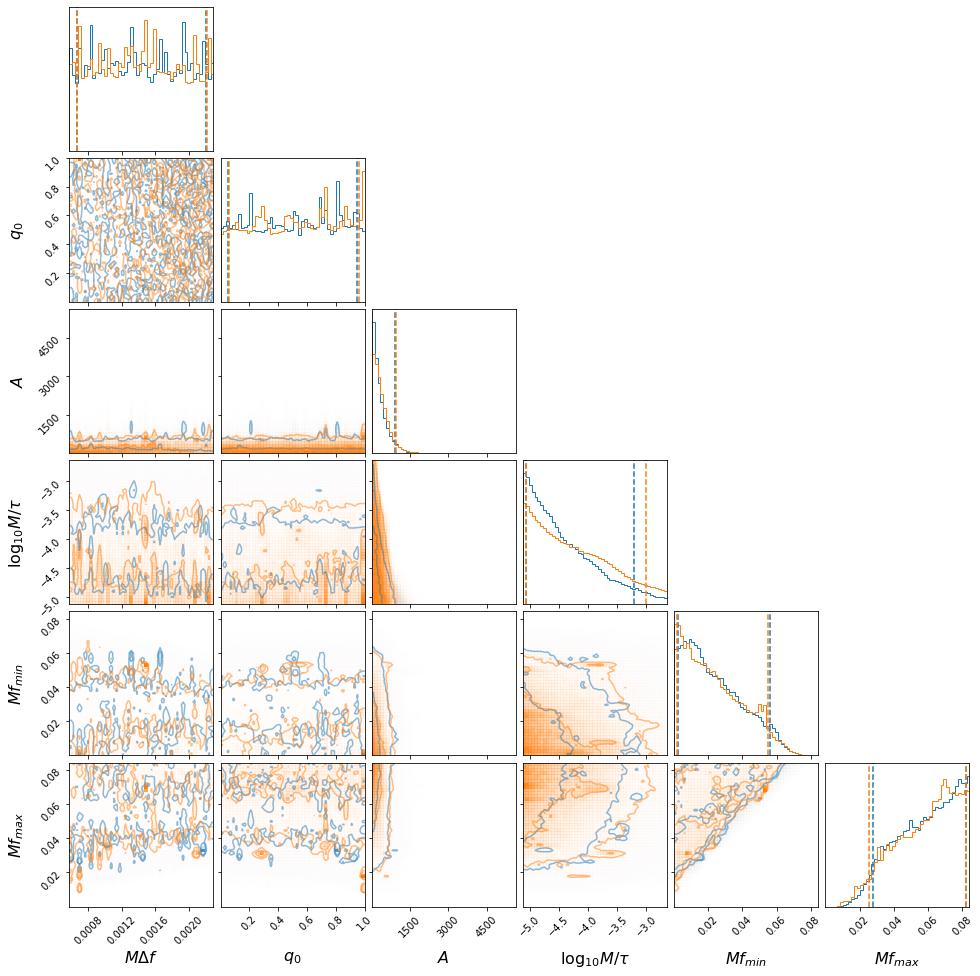

width -4.540857980372681 1.3311058023832532 0.5294339100156664
amplitude 236.03509714225333 685.9371632585938 211.910721068835
phase 0.5148121207656129 0.43281504977814256 0.46348753807088977
spacing 0.0014246177369621384 0.0007851497933091338 0.0007631244796552989
fmin 0.02058761583897028 0.035540969099355994 0.01855214401772764
fmax 0.060926838680304275 0.021514966615173305 0.03299838707199732
duration 130517.61557111642 0.0 0.0
log_likelihood 0.8912741135138623 13.203377265877577 1.6503947612569425
log_prior 12.439926489948789 1.2194028201581464 3.064386290755518
SNR 4.1023882831891605 4.6929832794516795 3.5927659144113164
100 100
noiseN200


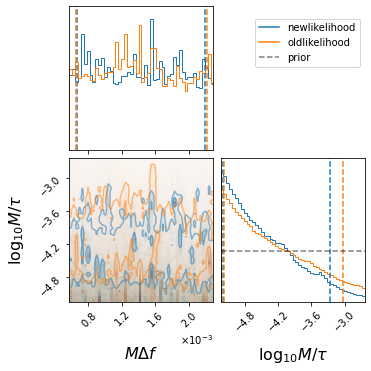

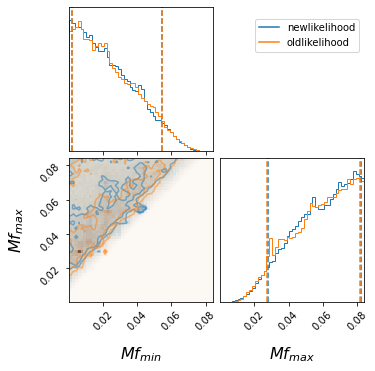

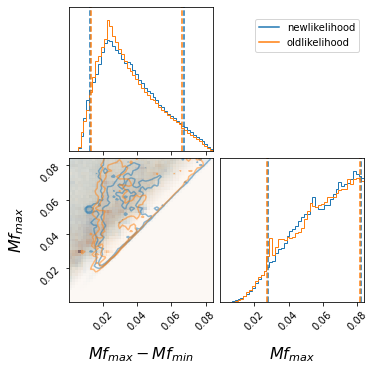

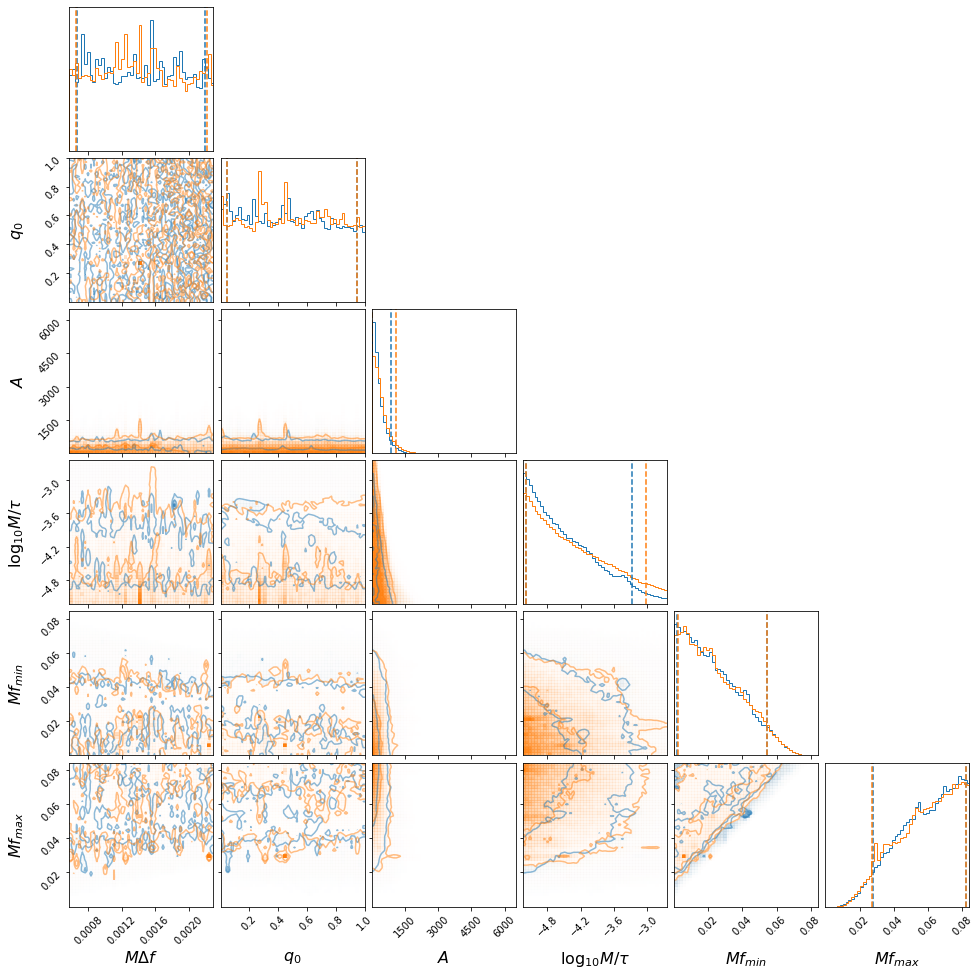

width -4.580480325309493 1.3170540072013672 0.6094170443541094
amplitude 242.48941163679694 649.3544910831127 215.59810595710798
phase 0.4738282296094306 0.4700778283149343 0.43046952065508765
spacing 0.0014305196960348755 0.0007693872764117618 0.0007664987198354951
fmin 0.0206701445375598 0.03379450996705277 0.01884642961936593
fmax 0.06107329593882625 0.021177118279871537 0.03337764294467684
duration 174023.48742815517 0.0 0.0
log_likelihood 0.8596242232020141 11.632180300530171 1.6194730935208494
log_prior 12.338956930191696 1.402990345197674 3.032906079830253
SNR 4.054368934924159 4.654289697389694 3.542871850813677


In [54]:
for file_array_new_2,file_array_old_2,name in zip(file_array_new,file_array_old,names_array):
    print(len(file_array_new_2),len(file_array_old_2))
    priors = bilby.result.read_in_result(file_array_new_2[0]).priors
    posterior_array_new = [bilby.result.read_in_result(result_single).posterior for result_single in file_array_new_2]
    posterior_array_old = [bilby.result.read_in_result(result_single).posterior for result_single in file_array_old_2]
    posterior_array_allplus_new = pd.concat(posterior_array_new,ignore_index=True)
    posterior_array_allplus_old = pd.concat(posterior_array_old,ignore_index=True)
    priors = bilby.result.read_in_result(file_array_new_2[0]).priors
    
    
    duration_str = file_array_new_2[0].split("/")[2].split("N")[1].split('_')[0]
    print(name+"N"+duration_str)
    line1 = mlines.Line2D([], [], color='C0', label='newlikelihood')
    line2 = mlines.Line2D([], [], color='C1', label='oldlikelihood')
    #line3 = mlines.Line2D([], [], color='gray', label='injected value')
    line4 = mlines.Line2D([], [], ls = '--',color='black', alpha = 0.5,label='prior')

    datanew = np.transpose([posterior_array_allplus_new.spacing.values,np.log10(posterior_array_allplus_new.width.values)])
    dataold = np.transpose([posterior_array_allplus_old.spacing.values,np.log10(posterior_array_allplus_old.width.values)])
    kwargsnew = dict(labels=[r"$M \Delta f$",r"$\log_{10}{M/\tau}$"], range=[[priors['spacing'].minimum,priors['spacing'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    kwargsold = dict(labels=[r"$M \Delta f$",r"$\log_{10}{M/\tau}$"], range=[[priors['spacing'].minimum,priors['spacing'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]],
                     show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),
                     hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),
                     color='C1',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    
    def get_normalisation_weight(len_current_samples, len_of_longest_samples):
        return np.ones(len_current_samples) * (len_of_longest_samples / len_current_samples)
    figure = corner.corner(datanew,**kwargsnew)
    corner.corner(dataold,**kwargsold,fig = figure)
    axes = np.array(figure.axes).reshape((2, 2))
    ax = axes[1,1]
    logprior = 1/(np.log10(priors['width'].maximum/priors['width'].minimum))
    ax.plot(np.log10(np.linspace(priors['width'].minimum, priors['width'].maximum, 1000)),np.linspace(logprior,logprior, 1000),color = 'black',ls='--',alpha = 0.5,label = 'prior')
    ax = axes[1,0]
    ax.hist2d(posterior_array_allplus_new.spacing.values,np.log10(posterior_array_allplus_new.width.values),bins=50,density=True,cmap='Blues',range=[[priors['spacing'].minimum,priors['spacing'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]])
    ax.hist2d(posterior_array_allplus_old.spacing.values,np.log10(posterior_array_allplus_old.width.values),bins=50,density=True,cmap='Oranges',alpha = 0.5,range=[[priors['spacing'].minimum,priors['spacing'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]])
    ax.ticklabel_format(axis="x", style="sci", scilimits=(0, 0),useMathText=True)
    ax = axes[1,1]
    plt.legend(handles=[line1,line2,line4], bbox_to_anchor=(0., 2.0, 1., .0),loc=0)
    plt.savefig(name+"N"+duration_str+"SpacingWidth_corner.pdf",dpi = 300)
    plt.savefig(name+"N"+duration_str+"SpacingWidth_corner_cut.pdf",dpi = 300,bbox_inches=Bbox([[0.1,0.1],[3.05,3.03]]))
    plt.show()
    plt.close()
    

    datanew = np.transpose([posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values])
    dataold = np.transpose([posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values])
    kwargsnew = dict(labels=[r"$M f_{min}$",r"$M f_{max}$"], range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    kwargsold = dict(labels=[r"$M f_{min}$",r"$M f_{max}$"], range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C1',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    def get_normalisation_weight(len_current_samples, len_of_longest_samples):
        return np.ones(len_current_samples) * (len_of_longest_samples / len_current_samples)
    figure = corner.corner(datanew,**kwargsnew)
    corner.corner(dataold,**kwargsold,fig = figure)

    axes = np.array(figure.axes).reshape((2, 2))
    ax = axes[1,0]
    ax.hist2d(posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values,bins=50,density=True,cmap='Blues',range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],alpha =0.5)
    ax.hist2d(posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values,bins=50,density=True,cmap='Oranges',alpha = 0.5,range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]])
    ax = axes[1,1]
    plt.legend(handles=[line1,line2], bbox_to_anchor=(0., 2.0, 1., .0),loc=0)
    plt.savefig(name+"N"+duration_str+"FRange_corner.pdf",dpi = 300)
    plt.savefig(name+"N"+duration_str+"FRange_corner_cut.pdf",dpi = 300,bbox_inches=Bbox([[0.1,0.1],[3.05,3.03]]))
    plt.show()
    plt.close()
    
    datanew = np.transpose([posterior_array_allplus_new.fmax.values-posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values])
    dataold = np.transpose([posterior_array_allplus_old.fmax.values-posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values])
    kwargsnew = dict(labels=[r"$M f_{max}-M f_{min}$",r"$M f_{max}$"], range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    kwargsold = dict(labels=[r"$M f_{max}-M f_{min}$",r"$M f_{max}$"], range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C1',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    def get_normalisation_weight(len_current_samples, len_of_longest_samples):
        return np.ones(len_current_samples) * (len_of_longest_samples / len_current_samples)
    figure = corner.corner(datanew,**kwargsnew)
    corner.corner(dataold,**kwargsold,fig = figure)

    axes = np.array(figure.axes).reshape((2, 2))
    ax = axes[1,0]
    ax.hist2d(posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values,bins=50,density=True,cmap='Blues',range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],alpha =0.5)
    ax.hist2d(posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values,bins=50,density=True,cmap='Oranges',alpha = 0.5,range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]])
    ax = axes[1,1]
    plt.legend(handles=[line1,line2], bbox_to_anchor=(0., 2.0, 1., .0),loc=0)
    plt.savefig(name+"N"+duration_str+"FRange_corner_new.pdf",dpi = 300)
    plt.savefig(name+"N"+duration_str+"FRange_corner_new_cut.pdf",dpi = 300,bbox_inches=Bbox([[0.1,0.1],[3.05,3.03]]))
    plt.show()
    plt.close()
    
    kwargsnew = dict(show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    kwargsold = dict(show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C1',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)

    kwargsnew['labels'] = [r"$M \Delta f$",r"$q_0$",r"$A$",r"$\log_{10}{M/\tau}$",r"$M f_{min}$",r"$M f_{max}$"]
    kwargsold['labels'] = [r"$M \Delta f$",r"$q_0$",r"$A$",r"$\log_{10}{M/\tau}$",r"$M f_{min}$",r"$M f_{max}$"]

    kwargsnew['range'] = [[priors['spacing'].minimum,priors['spacing'].maximum],[priors['phase'].minimum,priors['phase'].maximum],[priors['amplitude'].minimum,priors['amplitude'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)],[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]]
    kwargsold['range'] = [[priors['spacing'].minimum,priors['spacing'].maximum],[priors['phase'].minimum,priors['phase'].maximum],[priors['amplitude'].minimum,priors['amplitude'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)],[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]]

    datanew = np.transpose([posterior_array_allplus_new.spacing.values,posterior_array_allplus_new.phase.values,posterior_array_allplus_new.amplitude.values,np.log10(posterior_array_allplus_new.width.values),posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values])
    dataold = np.transpose([posterior_array_allplus_old.spacing.values,posterior_array_allplus_old.phase.values,posterior_array_allplus_old.amplitude.values,np.log10(posterior_array_allplus_old.width.values),posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values])
    
    figure = corner.corner(datanew,**kwargsnew)
    corner.corner(dataold,**kwargsold,fig = figure)
    plt.savefig(name+"N"+duration_str+"Full_corner.pdf",dpi = 300)
    plt.show()
    plt.close()
    
    rows = []
    rows.append(name+"N"+duration_str+'new')
    for keys in keys_all:
        median = np.median(posterior_array_allplus_new[keys])
        lowerlimit = np.percentile(posterior_array_allplus_new[keys], 5)
        upperlimit = np.percentile(posterior_array_allplus_new[keys], 95)
        if keys == 'width':
            median = np.median(np.log10(posterior_array_allplus_new[keys]))
            lowerlimit = np.percentile(np.log10(posterior_array_allplus_new[keys]), 5)
            upperlimit = np.percentile(np.log10(posterior_array_allplus_new[keys]), 95)
            # headers.append('log10'+keys+'_median')
            # headers.append('log10'+keys+'_plus')
            # headers.append('log10'+keys+'_minus')
        # else:
        #     headers.append(keys+'_median')
        #     headers.append(keys+'_plus')
        #     headers.append(keys+'_minus')
        rows.append(median)
        rows.append(upperlimit-median)
        rows.append(median-lowerlimit)
        print(keys, median, upperlimit-median,median-lowerlimit)
    # with open('figs/'+'PE.csv', 'w') as f:
    #     f_csv = csv.writer(f)
    #     f_csv.writerow(headers)
    with open('PE.csv', 'a+') as f:
        f_csv = csv.writer(f)
        f_csv.writerow(rows)

# violin plot for posterior 
Fig 13

## snr theory trend

In [61]:
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
import bilby
from glob import glob
from bilby.core.prior import PriorDict
import csv
import os


import sys
sys.path.append("..")
from burstevidence_newcomb import burstevidence as burstevidence_old
from burstevidence_newcomb import burstevidence_qnm as burstevidence
from comb_models_version3 import qnmcombmodel_cut as combmodel

chi = 2/3
#f_RD = (1-0.759*(1-chi)**0.129)*1.5251
f_RD = (1.5251-1.1568*(1-chi)**0.129)/(2*np.pi)
R_bar = 0.00547/(1+1/np.sqrt(1-chi**2))/(2*np.pi)
#0.006 should be 0.00572031?


fmin = 0
fmax = f_RD
# tem part
start = 0
end = 1
file_index = 9
# tem part end 

length0 = int(500*4096)
file_list = glob('echo_waves/*.dat')
file_list.sort()
# amplitude_array = np.concatenate((np.linspace(135,135,6),np.linspace(57,57,6),np.linspace(28,28,6),np.linspace(34,34,6),np.linspace(0,0,6)))
amplitude_array = np.concatenate((np.linspace(160,160,6),np.linspace(57,57,6),np.linspace(29,29,6),np.linspace(34,34,6),np.linspace(0,0,6)))

j=0
snr_array = []
for index in np.arange(0,24):
	file = file_list[index]
	amplitude_inject = amplitude_array[index]
	inject_data = np.genfromtxt(file,delimiter="\t",dtype=np.complex128)

	omega = np.real(inject_data[0::,0])
	frequency = omega/(2*np.pi)
	df = np.diff(frequency)[0]
	duration = 1/df
	dt = duration/len(omega)
	frequency = frequency[0:len(frequency)//2]


	inject_strain_fre = inject_data[0::,1]
	inject_strain_fre = (inject_strain_fre + np.conjugate(inject_strain_fre[::-1]))/2
	inject_strain_fre = inject_data[0::,1]
	inject_strain_plus = inject_strain_fre
	inject_strain_minus = np.conjugate(inject_strain_fre[::-1])


	inject_strain_fre = (inject_strain_plus+inject_strain_minus)/2
	inject_strain_fre = inject_strain_fre[0:len(frequency)]

	length = len(inject_strain_fre)*2

	i=0

	noise0 = np.load('noise100_500second.npy')
	noisep = noise0[i*length0:(i+1)*length0]
	noise = noisep[0:length]

	NFFT = 2048
	fs = 1/dt
	psd_window = np.blackman(NFFT)
	NOVL = int(NFFT/2)

	Pxx_strain, freqs = mlab.psd(noisep, Fs = fs, NFFT = NFFT,window = psd_window,noverlap = NOVL)
	psd_strain = interp1d(freqs, Pxx_strain)
	noisefre = dt * np.fft.fft(noise)[0:len(frequency)]

	strainfre = inject_strain_fre * amplitude_inject + noisefre
	frequencye = frequency[int(fmin/df):int(fmax/df+2)]

	hi = inject_strain_fre[int(fmin/df):int(fmax/df+2)] * amplitude_inject
	hi_plus = inject_strain_plus[int(fmin/df):int(fmax/df+2)] * amplitude_inject
	hi_minus = inject_strain_minus[int(fmin/df):int(fmax/df+2)] * amplitude_inject

	rho_opt_signal = np.sqrt(4*df * np.sum(np.abs(hi)**2/psd_strain(frequencye)))
	rho_opt_signal_plus = np.sqrt(4*df * np.sum(np.abs(hi_plus)**2/psd_strain(frequencye)))/2
	rho_opt_signal_minus = np.sqrt(4*df * np.sum(np.abs(hi_minus)**2/psd_strain(frequencye)))/2
	snr_array.append(np.max([rho_opt_signal_plus,rho_opt_signal_minus]))
	print(file.split('/')[-1],snr_array[-1])


w1XinN010.dat 15.752026932409908
w1XinN020.dat 16.233975050449473
w1XinN050.dat 16.666352545194187
w1XinN100.dat 16.815385134611443
w1XinN150.dat 16.84506012546179
w1XinN200.dat 16.852985732465317
w1specM50RbolT10Chi0.69N010.dat 11.630875334283212
w1specM50RbolT10Chi0.69N020.dat 13.42699894878039
w1specM50RbolT10Chi0.69N050.dat 15.456675244538873
w1specM50RbolT10Chi0.69N100.dat 16.790000210570167
w1specM50RbolT10Chi0.69N150.dat 17.37121346766126
w1specM50RbolT10Chi0.69N200.dat 18.224575886191776
w1specM50RdV0.2Chi0.69N010.dat 8.07850636879686
w1specM50RdV0.2Chi0.69N020.dat 10.283579625603396
w1specM50RdV0.2Chi0.69N050.dat 13.675246377862177
w1specM50RdV0.2Chi0.69N100.dat 16.632393768274262
w1specM50RdV0.2Chi0.69N150.dat 18.60327573504298
w1specM50RdV0.2Chi0.69N200.dat 20.157725297261972
w1specM50Rw0.99Chi0.69N010.dat 9.242481688380405
w1specM50Rw0.99Chi0.69N020.dat 11.579466480693123
w1specM50Rw0.99Chi0.69N050.dat 14.682985739809418
w1specM50Rw0.99Chi0.69N100.dat 16.444642044051403
w1s

In [62]:
# reshape snr_array to a (4,6) array
snr_array = np.array(snr_array).reshape(4,6)
snr_array = snr_array[::-1]

## violin plot

In [64]:
import pandas as pd
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import bilby
import corner
import csv
from glob import glob

import matplotlib.lines as mlines
from matplotlib.transforms import Bbox

In [65]:
duration_array_str = glob("echo_waves/*.dat")
duration_array_str.sort()
for i in range(len(duration_array_str)):
    duration_array_str[i] = duration_array_str[i].split("/")[1].split("N")[1].split('.')[0]
duration_array_str = list(dict.fromkeys(duration_array_str))
duration_array_str

['010', '020', '050', '100', '150', '200']

In [66]:
duration_array = glob("echo_waves/*.dat")
duration_array.sort()
for i in range(len(duration_array)):
    duration_array[i] = int(duration_array[i].split("/")[1].split("N")[1].split('.')[0])
duration_array = list(dict.fromkeys(duration_array))
duration_array.sort()
duration_array = np.array(duration_array)*2
duration_array

array([ 20,  40, 100, 200, 300, 400])

In [67]:
name_array = glob("echo_waves/*.dat")
name_array.sort()
for i in range(len(name_array)):
    name_array[i] = name_array[i].split("/")[1].split("N")[0]
#delete duplicates in name array
name_array = list(dict.fromkeys(name_array))
name_array.sort()
name_array = name_array[::-1]
name_array.append('noise')
name_array

['w1specM50Rw0.99Chi0.69',
 'w1specM50RdV0.2Chi0.69',
 'w1specM50RbolT10Chi0.69',
 'w1Xin',
 'noise']

In [68]:
file_array_new = [sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for name in name_array for string_likelihood in ['newlikelihood'] for duration in duration_array_str]
file_array_old = [sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for name in name_array for string_likelihood in ['oldlikelihood'] for duration in duration_array_str]

In [69]:
name_label_array = ['B1','B2','B3','B4','noise']
logbmax_array = [30,30,30,35]

In [70]:
file_array_new_test = [[sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for string_likelihood in ['newlikelihood'] for duration in duration_array_str] for name in name_array ]
file_array_old_test = [[sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for string_likelihood in ['oldlikelihood'] for duration in duration_array_str] for name in name_array ]
np.shape(file_array_new_test),np.shape(file_array_old_test)
#file_array_new_test[i][j][k] means the i-th signal, j-th duration, k-th noise realization

((5, 6, 100), (5, 6, 100))

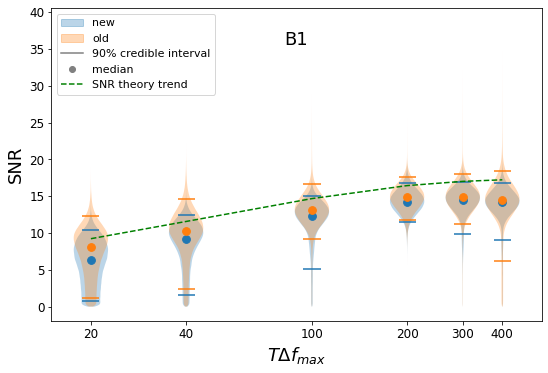

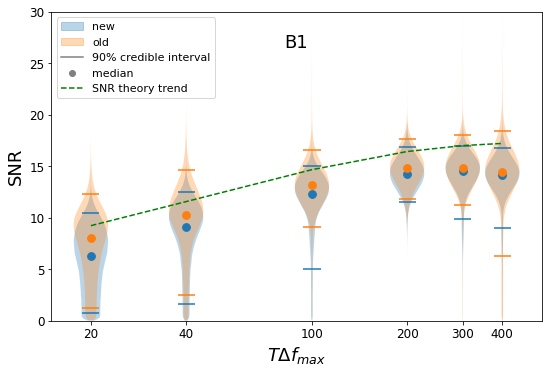

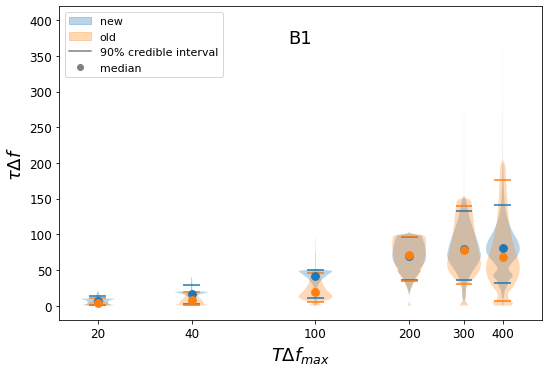

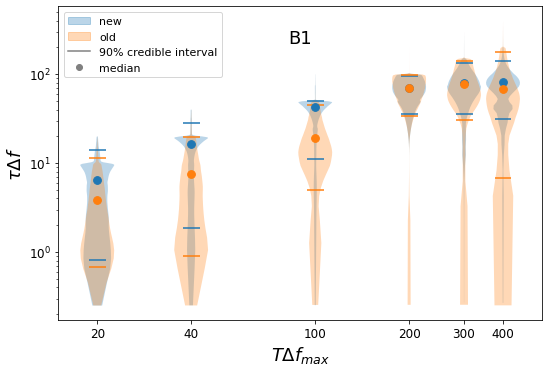

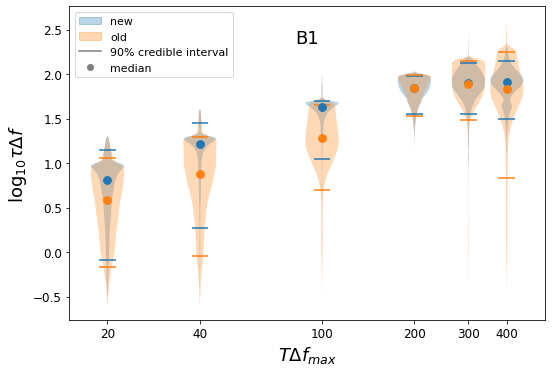

...

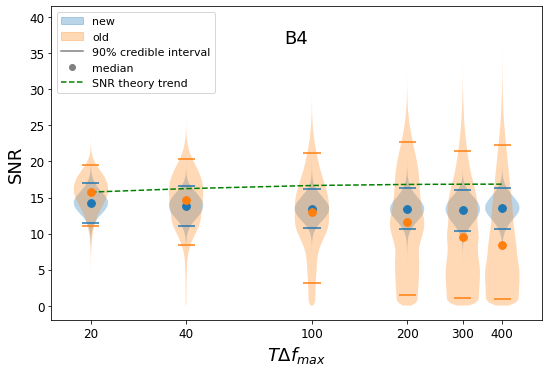

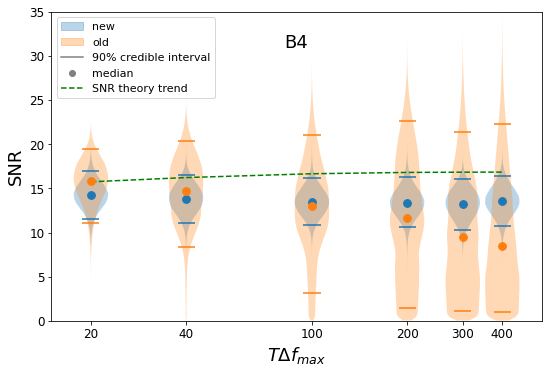

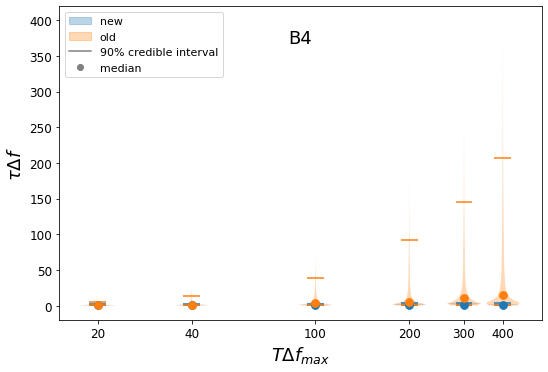

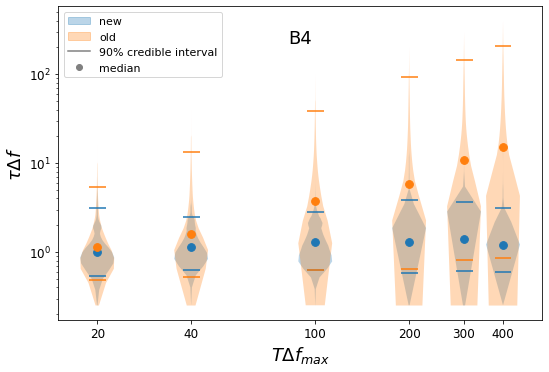

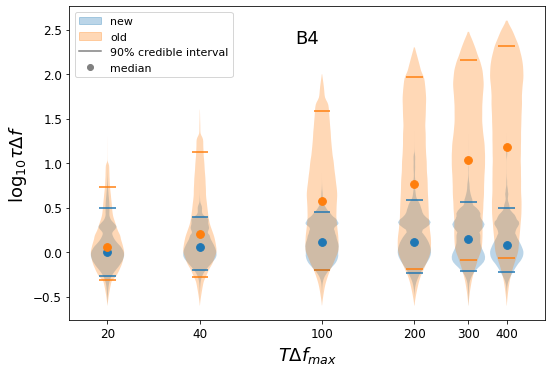

In [72]:
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
for file_array_new_2,file_array_old_2,snr_array_part,name_string,logbmax in zip(file_array_new_test,file_array_old_test,snr_array,name_label_array,logbmax_array):
    quantiles8 = [[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95]]
    quantiles7 = [[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95]]
    new_likelihood_SNR = []
    old_likelihood_SNR = []
    new_likelihood_qfactor = []
    old_likelihood_qfactor = []
    for file_array_new_3,file_array_old_3 in zip(file_array_new_2,file_array_old_2):
        posterior_array_new = [bilby.result.read_in_result(result_single).posterior for result_single in file_array_new_3]
        posterior_array_old = [bilby.result.read_in_result(result_single).posterior for result_single in file_array_old_3]
        posterior_array_allplus_new = pd.concat(posterior_array_new,ignore_index=True)
        posterior_array_allplus_old = pd.concat(posterior_array_old,ignore_index=True)
        new_likelihood_SNR.append(posterior_array_allplus_new['SNR'])
        old_likelihood_SNR.append(posterior_array_allplus_old['SNR'])
        new_likelihood_qfactor.append(posterior_array_allplus_new['spacing']/posterior_array_allplus_new['width'])
        old_likelihood_qfactor.append(posterior_array_allplus_old['spacing']/posterior_array_allplus_old['width'])
        
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []
    parts1 = ax.violinplot(new_likelihood_SNR,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_SNR,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    
    line3 = mlines.Line2D([], [], color='green',ls='--', label='SNR theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_SNR]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in old_likelihood_SNR]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.plot(positions,snr_array_part,color = 'green',ls = '--',label = 'SNR theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel('SNR',fontsize = 18)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    # ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1,line3], loc=2,fontsize = 11)
    plt.savefig('SNR_violinplot_%s.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()
    
    
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []
    parts1 = ax.violinplot(new_likelihood_SNR,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_SNR,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    
    line3 = mlines.Line2D([], [], color='green',ls='--', label='SNR theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_SNR]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in old_likelihood_SNR]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.plot(positions,snr_array_part,color = 'green',ls = '--',label = 'SNR theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel('SNR',fontsize = 18)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    ax.set_ylim(0,logbmax)
    # ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1,line3], loc=2,fontsize = 11)
    plt.savefig('SNR_violinplot_%s_fix_ylim.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()
    
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []

    parts1 = ax.violinplot(new_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    
    line3 = mlines.Line2D([], [], color='grey',ls='--', label='snr theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_qfactor]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in old_likelihood_qfactor]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    #ax.plot(positions,snr_array_part,color = 'grey',ls = '--',label = 'snr theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel(r'$\tau \Delta f$',fontsize = 18)
    # ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1], loc=2,fontsize = 11)
    plt.savefig('qfactor_violinplot_%s.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()
    
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []

    parts1 = ax.violinplot(new_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    
    line3 = mlines.Line2D([], [], color='grey',ls='--', label='snr theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_qfactor]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in old_likelihood_qfactor]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    #ax.plot(positions,snr_array_part,color = 'grey',ls = '--',label = 'snr theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel(r'$\tau \Delta f$',fontsize = 18)
    ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1], loc=2,fontsize = 11)
    plt.savefig('qfactor_violinplot_%s_yscalelog.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()
    
    
    log10_new_likelihood_qfactor = []
    log10_old_likelihood_qfactor = []
    for i in range(len(new_likelihood_qfactor)):
        log10_new_likelihood_qfactor.append(np.log10(new_likelihood_qfactor[i]))
        log10_old_likelihood_qfactor.append(np.log10(old_likelihood_qfactor[i]))
        
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []

    parts1 = ax.violinplot(log10_new_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(log10_old_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)

    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')

    line3 = mlines.Line2D([], [], color='grey',ls='--', label='snr theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in log10_new_likelihood_qfactor]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in log10_old_likelihood_qfactor]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #ax.text(0.5,0.5,name_string,fontsize = 18)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    #ax.plot(positions,snr_array_part,color = 'grey',ls = '--',label = 'snr theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel(r'$\log_{10} \tau \Delta f$',fontsize = 18)
    #ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1], loc=2,fontsize = 11)
    plt.savefig('log_qfactor_violinplot_%s.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()

# parameter table
table 3 & table 4

In [1]:
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np
import csv

import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
import bilby
from glob import glob
from bilby.core.prior import PriorDict



import sys
sys.path.append("..")
from burstevidence_newcomb import burstevidence as burstevidence_old
from burstevidence_newcomb import burstevidence_qnm as burstevidence
from comb_models_version3 import qnmcombmodel_cut as combmodel

#chi = 2/3
chi = 0.69
f_RD = (1.5251-1.1568*(1-chi)**0.129)/(2*np.pi)
R_bar = 0.00547/(1+1/np.sqrt(1-chi**2))
#0.006 should be 0.00572031?


fmin = 0
fmax = f_RD

noise0 = np.load('noise100_500second.npy')

keys_array = ['log_likelihood','spacing', 'phase', 'amplitude','width',  'fmin', 'fmax', 'SNR','qfactor']
headers = ['name', 'log_likelihood_median', 'log_likelihood_plus', 'log_likelihood_minus', 'spacing_median', 'spacing_plus', 'spacing_minus', 'phase_median', 'phase_plus', 'phase_minus', 'amplitude_median', 'amplitude_plus', 'amplitude_minus', 'log10width_median', 'log10width_plus', 'log10width_minus', 'fmin_median', 'fmin_plus', 'fmin_minus', 'fmax_median', 'fmax_plus', 'fmax_minus', 'SNR_median', 'SNR_plus', 'SNR_minus', 'qfactor_median', 'qfactor_plus', 'qfactor_minus']
with open('PE_new.csv', 'w') as f:
    f_csv = csv.writer(f)
    f_csv.writerow(headers)

In [2]:
def format_number(a, a1, a2):
    # get the effective digits of the minimum value of a1 and a2
    min_uncertainty = min(a1, a2)
    if 'e' in str(min_uncertainty):
        digit = -int(str(min_uncertainty).split('e')[1])
        a_new = a*10**digit
        a1_new = a1*10**digit
        a2_new = a2*10**digit
        return format_number(a_new, a1_new, a2_new)+' 10^{-%d}'%digit
    elif min_uncertainty < 1:
        # calculate the effective digits
        effective_digits = len(str(min_uncertainty).split('.')[1]) - len(str(int(str(min_uncertainty).split('.')[1]))) + 1
        # format the string
        formatted_a = "{:.{prec}f}".format(a, prec=effective_digits)
        formatted_a1 = "{:.{prec}f}".format(a1, prec=effective_digits)
        formatted_a2 = "{:.{prec}f}".format(a2, prec=effective_digits)
        # combine the final result
        formatted_str = f'{formatted_a}'+'^{+'+f'{formatted_a1}'+'}_{-'+f'{formatted_a2}'+'}'
    else:
        desired_precision = 10**int(np.log10(min_uncertainty))
        formatted_a = str(int(round(a / desired_precision) * desired_precision))
        formatted_a1 = str(int(round(a1 / desired_precision) * desired_precision))
        formatted_a2 = str(int(round(a2 / desired_precision) * desired_precision))
        formatted_str = f'{formatted_a}'+'^{+'+f'{formatted_a1}'+'}_{-'+f'{formatted_a2}'+'}'
    return formatted_str

In [3]:
duration_array_str = glob("echo_waves/*.dat")
duration_array_str.sort()
for i in range(len(duration_array_str)):
    duration_array_str[i] = duration_array_str[i].split("/")[1].split("N")[1].split('.')[0]
duration_array_str = list(dict.fromkeys(duration_array_str))
duration_array_str

['010', '020', '050', '100', '150', '200']

In [4]:
duration_array = glob("echo_waves/*.dat")
duration_array.sort()
for i in range(len(duration_array)):
    duration_array[i] = int(duration_array[i].split("/")[1].split("N")[1].split('.')[0])
duration_array = list(dict.fromkeys(duration_array))
duration_array.sort()
duration_array = np.array(duration_array)
duration_array

array([ 10,  20,  50, 100, 150, 200])

In [5]:
name_array = glob("echo_waves/*.dat")
name_array.sort()
for i in range(len(name_array)):
    name_array[i] = name_array[i].split("/")[1].split("N")[0]
#delete duplicates in name array
name_array = list(dict.fromkeys(name_array))
name_array.sort()
name_array = name_array[::-1]
name_array.append('noise')
name_array

['w1specM50Rw0.99Chi0.69',
 'w1specM50RdV0.2Chi0.69',
 'w1specM50RbolT10Chi0.69',
 'w1Xin',
 'noise']

In [6]:
for string_likelihood in ['newlikelihood','oldlikelihood']:
    for name in name_array:
        print(name,string_likelihood)
        for duration_str in duration_array_str:
        # for string_likelihood in ['newlikelihood','oldlikelhood']:
            # if string_likelihood == 'newlikelihood':
            file_array = sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration_str)))
            # if string_likelihood == 'oldlikelhood':
            #     file_array = sorted(glob('%s/%s/*%s*.json'%(name,string_likelihood,'N'+duration_str)))
            if name == 'noise':
                file = glob('echo_waves/*%s*%s.dat'%(name_array[0],'N'+duration_str))[0]
            else:
                file = glob('echo_waves/*%s*%s.dat'%(name,'N'+duration_str))[0]
            i = 0

            inject_data = np.genfromtxt(file,delimiter="\t",dtype=np.complex128)

            omega = np.real(inject_data[0::,0])
            frequency = omega/(2*np.pi)
            df = np.diff(frequency)[0]
            duration = 1/df
            dt = duration/len(omega)
            frequency = frequency[0:len(frequency)//2]

            length0 = int(500*4096)
            noisep = noise0[i*length0:(i+1)*length0]


            NFFT = 2048
            fs = 1/dt
            psd_window = np.blackman(NFFT)
            NOVL = int(NFFT/2)

            Pxx_strain, freqs = mlab.psd(noisep, Fs = fs, NFFT = NFFT,window = psd_window,noverlap = NOVL)
            psd_strain = interp1d(freqs, Pxx_strain)

            posterior_array= [bilby.result.read_in_result(result_single).posterior for result_single in file_array]
            posterior_array_allplus = pd.concat(posterior_array,ignore_index=True)
            
            logBdata = pd.read_csv(sorted(glob('%s/*%s*%s*.csv'%(name,'N'+duration_str,string_likelihood)))[0])['logB'].values
            
            rows = []
            rows.append(name+'N'+duration_str+string_likelihood)
            
            format_string = '& '+str(int(duration_str)*2)+' & '
            for keys in keys_array:
                if keys in ['width', 'amplitude', 'phase', 'spacing', 'fmin', 'fmax','SNR']:
                    median = np.median(posterior_array_allplus[keys])
                    lowerlimit = np.percentile(posterior_array_allplus[keys], 5)
                    upperlimit = np.percentile(posterior_array_allplus[keys], 95)
                if keys == 'width':
                    median = np.median(np.log10(posterior_array_allplus[keys]))
                    lowerlimit = np.percentile(np.log10(posterior_array_allplus[keys]), 5)
                    upperlimit = np.percentile(np.log10(posterior_array_allplus[keys]), 95)
                #     headers.append('log10'+keys+'_median')
                #     headers.append('log10'+keys+'_plus')
                #     headers.append('log10'+keys+'_minus')
                # else:
                #     headers.append(keys+'_median')
                #     headers.append(keys+'_plus')
                #     headers.append(keys+'_minus')
                if keys == 'amplitude':
                    median = np.median(np.log10(posterior_array_allplus[keys]))/np.sqrt(np.mean(psd_strain(frequency)))
                    lowerlimit = np.percentile(np.log10(posterior_array_allplus[keys]), 5)/np.sqrt(np.mean(psd_strain(frequency)))
                    upperlimit = np.percentile(np.log10(posterior_array_allplus[keys]), 95)/np.sqrt(np.mean(psd_strain(frequency)))
                if keys == 'qfactor':
                    median = np.median(posterior_array_allplus['spacing']/posterior_array_allplus['width'])
                    lowerlimit = np.percentile(posterior_array_allplus['spacing']/posterior_array_allplus['width'], 5)
                    upperlimit = np.percentile(posterior_array_allplus['spacing']/posterior_array_allplus['width'], 95)
                if keys == 'log_likelihood':
                    median = np.median(logBdata)
                    lowerlimit = np.percentile(logBdata, 5)
                    upperlimit = np.percentile(logBdata, 95)       
                rows.append(median)
                rows.append(upperlimit-median)
                rows.append(median-lowerlimit)
                # print(keys, median, upperlimit-median,median-lowerlimit,lowerlimit,upperlimit)
                if keys in ['log_likelihood','spacing', 'phase', 'amplitude','width',  'fmin', 'fmax']:
                    format_string = format_string + '$'+format_number(median, upperlimit-median,median-lowerlimit)+ '$'+' & '
            # format_string[-1]='\\'
            format_string = format_string[0:-2]+'\\\\'
            print(format_string)
            with open('PE_new.csv', 'a+') as f:
                f_csv = csv.writer(f)
                f_csv.writerow(rows)

w1specM50Rw0.99Chi0.69 newlikelihood


& 20 & $-2^{+6}_{-1}$ & $0.0012^{+0.0011}_{-0.0005}$ & $0.6^{+0.4}_{-0.5}$ & $0.9^{+0.2}_{-0.4}$ & $-3.7^{+0.9}_{-0.2}$ & $0.04^{+0.02}_{-0.04}$ & $0.077^{+0.007}_{-0.042}$ \\
& 40 & $1^{+14}_{-3}$ & $0.0011^{+0.0011}_{-0.0004}$ & $0.8^{+0.2}_{-0.7}$ & $1.04^{+0.08}_{-0.41}$ & $-4.14^{+0.95}_{-0.09}$ & $0.05^{+0.02}_{-0.04}$ & $0.080^{+0.005}_{-0.037}$ \\
& 100 & $20^{+20}_{-20}$ & $0.0011^{+0.0006}_{-0.0004}$ & $0.83^{+0.05}_{-0.64}$ & $1.17^{+0.05}_{-0.27}$ & $-4.56^{+0.58}_{-0.07}$ & $0.05^{+0.01}_{-0.03}$ & $0.078^{+0.005}_{-0.008}$ \\
& 200 & $40^{+20}_{-20}$ & $11492^{+3}_{-5746} 10^{-7}$ & $0.83^{+0.01}_{-0.16}$ & $1.23^{+0.06}_{-0.07}$ & $-4.8^{+0.2}_{-0.1}$ & $0.046^{+0.010}_{-0.013}$ & $0.076^{+0.005}_{-0.003}$ \\
& 300 & $40^{+20}_{-40}$ & $11493^{+3}_{-5746} 10^{-7}$ & $0.83^{+0.01}_{-0.20}$ & $1.25^{+0.06}_{-0.11}$ & $-4.9^{+0.3}_{-0.2}$ & $0.04^{+0.01}_{-0.02}$ & $0.076^{+0.005}_{-0.005}$ \\
& 400 & $40^{+20}_{-30}$ & $11493^{+4}_{-5746} 10^{-7}$ & $0.831^{+0.010}_{-0.188